In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
from matplotlib.pyplot import figure
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima
from sklearn.ensemble import BaggingRegressor
from pandas import DataFrame
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, median_absolute_error
from math import sqrt
import datetime
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import fbprophet
from fbprophet import Prophet
import mxnet
import gluonts
import xgboost as xgb
from gluonts.dataset import common
from gluonts.model import deepar
from gluonts.dataset.common import ListDataset
from gluonts.model.simple_feedforward import SimpleFeedForwardEstimator
from gluonts.mx import Trainer
from gluonts.evaluation import make_evaluation_predictions
from sklearn.svm import SVR
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn import linear_model
from gluonts.model.deepvar import DeepVAREstimator
from gluonts.model.deepar import DeepAREstimator
from gluonts.model.transformer import TransformerEstimator
from gluonts.model.seq2seq import MQCNNEstimator
from gluonts.model.lstnet import LSTNetEstimator
from gluonts.dataset.multivariate_grouper import MultivariateGrouper
import optuna

Importing plotly failed. Interactive plots will not work.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\setuptools\distutils_patch.py:26: UserWarning: Distutils was imported before Setuptools. This usage is discouraged and may exhibit undesirable behaviors or errors. Please use Setuptools' objects directly or at least import Setuptools first.
  "Distutils was imported before Setuptools. This usage is discouraged "


# Orignal Data

In [2]:
test = pd.read_csv("sku_data.csv", encoding= 'unicode_escape')
test

,date,store,item,sales
0,1/1/2013,1,1,13
1,1/2/2013,1,1,11
2,1/3/2013,1,1,14
3,1/4/2013,1,1,13
4,1/5/2013,1,1,10
...,...,...,...,...
912995,12/27/2017,10,50,63
912996,12/28/2017,10,50,59
912997,12/29/2017,10,50,74
912998,12/30/2017,10,50,62


In [3]:
df = pd.read_csv("sku_data.csv")
df.set_index("date", inplace=True)
df.index = pd.to_datetime(df.index)

In [4]:
df

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,10,50,63
2017-12-28,10,50,59
2017-12-29,10,50,74


# Number of Distinct Stores:

In [5]:
#Number of distinct stores
distinct_stores = len(df.store.unique())
distinct_stores

10

# Number of Distinct Items:

In [6]:
#Number of distinct items
distinct_items = len(df.item.unique())
distinct_items

50

# Number of Distinct Store and Item Combinations:

In [7]:
#Number of distinct store and item combinations
distinct_combinations = len(df.groupby(["store", "item"]).mean())
distinct_combinations

500

# Summary Statistics of Sales Across Store-Item Combinations:

In [10]:
#Creating a pipeline to summarize data per store-item combination


def summary_statistics(d_stores, d_items):
    data = []

    stores = np.arange(1, d_stores + 1)
    items = np.arange(1, d_items + 1)
    for store in stores:
        for item in items:
            row = {'store': store, 'item': item}
            subset = df[df["store"] == store]
            subset = subset[subset["item"] == item]

            #Number of rows
            row["Total Historical Data"] = subset.shape[0]

            #Missing Data
            row["Missing Count"] = subset.shape[0] - subset.dropna().shape[0]
            row["Missing %"] = row["Missing Count"] / subset.shape[0]
            row["# of Zero Values"] = sum(subset["sales"] == 0)


            #Summary Statistics
            row["Total Sales"] = sum(subset["sales"])
            row["Average Sales"] = np.mean(subset["sales"])
            row["Sales SD"] = np.std(subset["sales"])
            row["Sales Variance"] = np.var(subset['sales'])
            row["Sales Median"] = subset['sales'].median()
            row["Sales Min"] = subset['sales'].min()
            row["Sales Max"] = subset['sales'].max()







            #Sales Per Day of Week
            subset = subset.reset_index()
            subset["weekday"] = subset["date"].apply(datetime.datetime.weekday)
            row["Total Sales Mon"] = sum(subset[subset["weekday"] == 0]["sales"])
            row["Total Sales Tue"] = sum(subset[subset["weekday"] == 1]["sales"])
            row["Total Sales Wed"] = sum(subset[subset["weekday"] == 2]["sales"])
            row["Total Sales Thu"] = sum(subset[subset["weekday"] == 3]["sales"])
            row["Total Sales Fri"] = sum(subset[subset["weekday"] == 4]["sales"])
            row["Total Sales Sat"] = sum(subset[subset["weekday"] == 5]["sales"])
            row["Total Sales Sun"] = sum(subset[subset["weekday"] == 6]["sales"])



            #Percentage of Sales Per Day of Week
            row["% of Sales Mon"] = row["Total Sales Mon"] / row["Total Sales"]
            row["% of Sales Tue"] = row["Total Sales Tue"] / row["Total Sales"]
            row["% of Sales Wed"] = row["Total Sales Wed"] / row["Total Sales"]
            row["% of Sales Thu"] = row["Total Sales Thu"] / row["Total Sales"]
            row["% of Sales Fri"] = row["Total Sales Fri"] / row["Total Sales"]
            row["% of Sales Sat"] = row["Total Sales Sat"] / row["Total Sales"]
            row["% of Sales Sun"] = row["Total Sales Sun"] / row["Total Sales"]

            #Add data of store-item combination to congregated data 
            data.append(row)
            
    return pd.DataFrame(data)
        
        
        

In [11]:
summary = summary_statistics(distinct_stores, distinct_items)
summary

,store,item,Total Historical Data,Missing Count,Missing %,# of Zero Values,Total Sales,Average Sales,Sales SD,Sales Variance,...,Total Sales Fri,Total Sales Sat,Total Sales Sun,% of Sales Mon,% of Sales Tue,% of Sales Wed,% of Sales Thu,% of Sales Fri,% of Sales Sat,% of Sales Sun
0,1,1,1826,0,0.0,0,36468,19.971522,6.739176,45.416495,...,5485,5996,6211,0.111111,0.130032,0.134501,0.139218,0.150406,0.164418,0.170314
1,1,2,1826,0,0.0,0,97050,53.148959,15.001670,225.050100,...,14598,15598,16484,0.112705,0.131345,0.133673,0.141288,0.150417,0.160721,0.169851
2,1,3,1826,0,0.0,0,60638,33.208105,10.069771,101.400285,...,9192,9675,10407,0.114845,0.129984,0.132277,0.140127,0.151588,0.159553,0.171625
3,1,4,1826,0,0.0,0,36440,19.956188,6.638799,44.073656,...,5413,5910,6154,0.110538,0.131970,0.132080,0.145801,0.148546,0.162184,0.168880
4,1,5,1826,0,0.0,0,30335,16.612815,5.670549,32.155126,...,4516,4842,5115,0.111950,0.131070,0.133509,0.146366,0.148871,0.159618,0.168617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,10,46,1826,0,0.0,0,120601,66.046550,18.110030,327.973189,...,18399,19295,20492,0.114070,0.131259,0.131840,0.140364,0.152561,0.159990,0.169916
496,10,47,1826,0,0.0,0,45204,24.755750,7.922650,62.768382,...,6692,7295,7692,0.112733,0.131869,0.131847,0.143970,0.148040,0.161380,0.170162
497,10,48,1826,0,0.0,0,105570,57.814896,15.894185,252.625101,...,15880,16817,18102,0.114076,0.130586,0.132396,0.141754,0.150422,0.159297,0.171469
498,10,49,1826,0,0.0,0,60317,33.032311,10.088847,101.784827,...,9094,9766,10141,0.113235,0.130842,0.132881,0.142232,0.150770,0.161911,0.168128


In [13]:
list_1 = ["store", "item", "Total Historical Data", "Missing Count", "Missing %", "# of Zero Values", "Total Sales", "Average Sales", "Sales SD", "Sales Variance", "Sales Median", "Sales Min", "Sales Max"]
list_2 = ["store", "item", "Total Sales Mon", "Total Sales Tue", "Total Sales Wed", "Total Sales Thu", "Total Sales Fri", "Total Sales Sat", "Total Sales Sun", "% of Sales Mon", "% of Sales Tue", "% of Sales Wed", "% of Sales Thu", "% of Sales Fri", "% of Sales Sat", "% of Sales Sun"]
summary_1 = summary[list_1]
summary_2 = summary[list_2]

In [52]:
summary_1.head()

,store,item,Total Historical Data,Missing Count,Missing %,# of Zero Values,Total Sales,Average Sales,Sales SD,Sales Variance,Sales Median,Sales Min,Sales Max
0,1,1,1826,0,0.0,0,36468,19.971522,6.739176,45.416495,19.0,4,50
1,1,2,1826,0,0.0,0,97050,53.148959,15.001670,225.050100,52.0,13,115
2,1,3,1826,0,0.0,0,60638,33.208105,10.069771,101.400285,33.0,8,70
3,1,4,1826,0,0.0,0,36440,19.956188,6.638799,44.073656,20.0,4,43
4,1,5,1826,0,0.0,0,30335,16.612815,5.670549,32.155126,16.0,3,37


In [53]:
summary_2.head()

,store,item,Total Sales Mon,Total Sales Tue,Total Sales Wed,Total Sales Thu,Total Sales Fri,Total Sales Sat,Total Sales Sun,% of Sales Mon,% of Sales Tue,% of Sales Wed,% of Sales Thu,% of Sales Fri,% of Sales Sat,% of Sales Sun
0,1,1,4052,4742,4905,5077,5485,5996,6211,0.111111,0.130032,0.134501,0.139218,0.150406,0.164418,0.170314
1,1,2,10938,12747,12973,13712,14598,15598,16484,0.112705,0.131345,0.133673,0.141288,0.150417,0.160721,0.169851
2,1,3,6964,7882,8021,8497,9192,9675,10407,0.114845,0.129984,0.132277,0.140127,0.151588,0.159553,0.171625
3,1,4,4028,4809,4813,5313,5413,5910,6154,0.110538,0.131970,0.132080,0.145801,0.148546,0.162184,0.168880
4,1,5,3396,3976,4050,4440,4516,4842,5115,0.111950,0.131070,0.133509,0.146366,0.148871,0.159618,0.168617


# Checking for Missing Data

In [15]:
#Checking for missing data (null values)
missing_data = summary[summary["Missing Count"] != 0]
number_missing = len(missing_data)
print("Instances of Missing Data: {}".format(number_missing))

Instances of Missing Data: 0


In [17]:
#Checking for inconsistencies in Total Historical Data (not equal to 1826)
incomplete = summary[summary["Total Historical Data"] != 1826]
inconsistent_time_series = len(incomplete)
print("Time series without entire four years of data: {}".format(inconsistent_time_series))

Time series without entire four years of data: 0


In [18]:
#Checking for values of 0
zeroes = summary[summary["# of Zero Values"] != 0]
zero_data = len(zeroes)
print("Instances of zero sales: {}".format(zero_data))

Instances of zero sales: 1


# A Bunch of Histograms

Text(0.5, 1.0, 'Histogram of Total Sales Across All Store/Item Combs.')

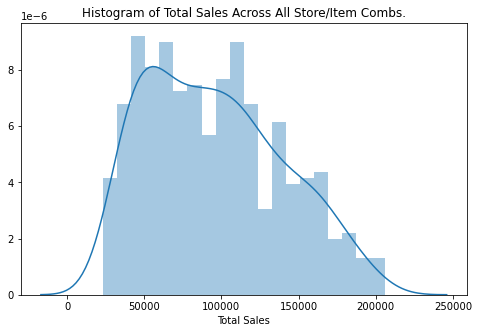

In [57]:
plt.figure(figsize=(8,5))
sns.distplot(summary['Total Sales'], bins=20, hist=True)
plt.xlabel("Total Sales")
plt.title("Histogram of Total Sales Across All Store/Item Combs.")

Text(0.5, 1.0, 'Histogram of Average Sales Per Day Across All Store/Item Combs.')

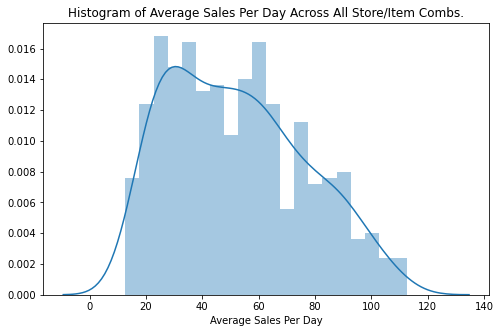

In [58]:
plt.figure(figsize=(8,5))
sns.distplot(summary['Average Sales'], bins=20, hist=True)
plt.xlabel("Average Sales Per Day")
plt.title("Histogram of Average Sales Per Day Across All Store/Item Combs.")

Text(0.5, 1.0, 'Histogram of Standard Deviations Per Day Across All Store/Item Combs.')

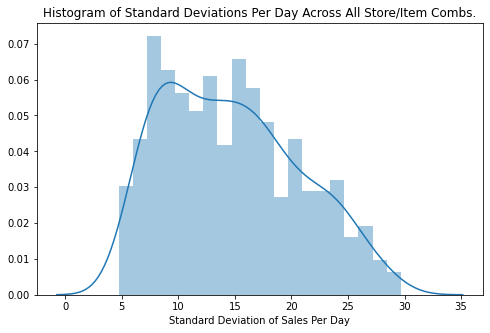

In [59]:
plt.figure(figsize=(8,5))
sns.distplot(summary['Sales SD'], bins=20, hist=True)
plt.xlabel("Standard Deviation of Sales Per Day")
plt.title("Histogram of Standard Deviations Per Day Across All Store/Item Combs.")

Text(0.5, 1.0, 'Histogram of Minimum # of Sales Across All Store/Item Combs.')

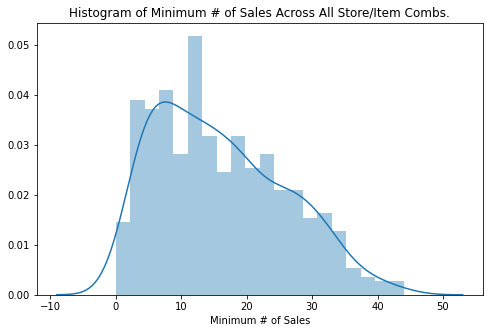

In [60]:
plt.figure(figsize=(8,5))
sns.distplot(summary['Sales Min'], bins=20, hist=True)
plt.xlabel("Minimum # of Sales")
plt.title("Histogram of Minimum # of Sales Across All Store/Item Combs.")

Text(0.5, 1.0, 'Histogram of Maximum # of Sales Across All Store/Item Combs.')

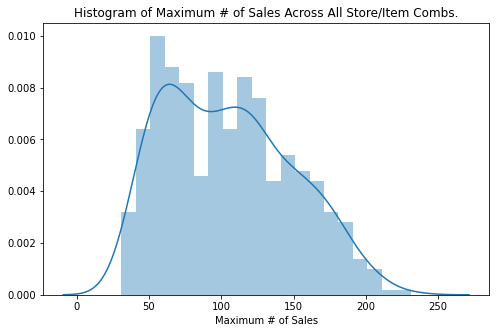

In [61]:
plt.figure(figsize=(8,5))
sns.distplot(summary['Sales Max'], bins=20, hist=True)
plt.xlabel("Maximum # of Sales")
plt.title("Histogram of Maximum # of Sales Across All Store/Item Combs.")

# Percentage of Sales Per Day of Week

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Text(0.5, 1.0, 'Average Percentage of Sales Across Days of Week')

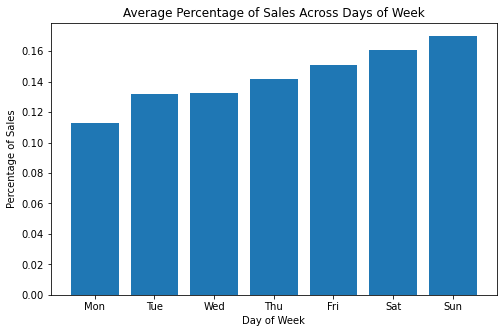

In [62]:
#Average Distribution of Sales Across Days of the Week

days = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
mon = summary["% of Sales Mon"].mean()
tue = summary["% of Sales Tue"].mean()
wed = summary["% of Sales Wed"].mean()
thu = summary["% of Sales Thu"].mean()
fri = summary["% of Sales Fri"].mean()
sat = summary["% of Sales Sat"].mean()
sun = summary["% of Sales Sun"].mean()
sales_per_days = [mon, tue, wed, thu, fri, sat, sun]

#Plot
plt.figure(figsize=(8,5))
plt.bar(days, sales_per_days)
plt.xlabel("Day of Week")
plt.ylabel("Percentage of Sales")
plt.title("Average Percentage of Sales Across Days of Week")

# Comparison of Sales Between Stores Over Time

Text(0, 0.5, 'Sales')

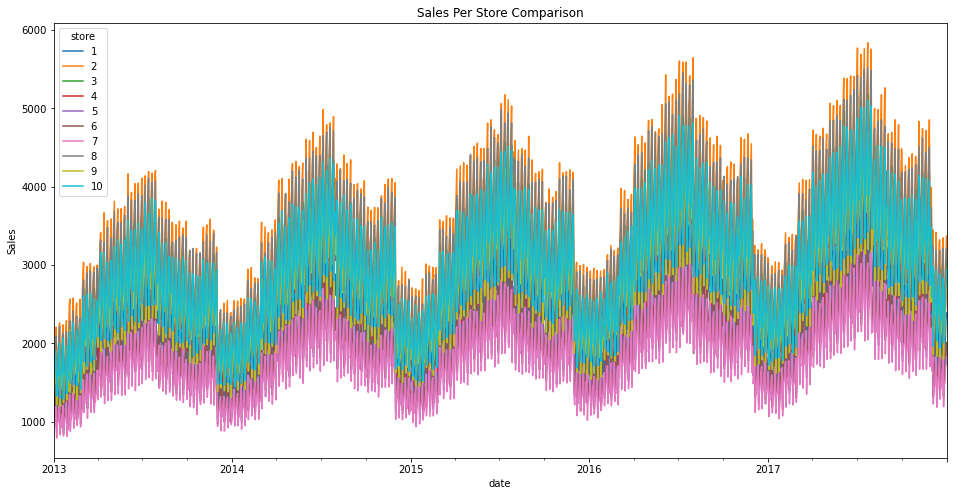

In [63]:
#Generate plots for each and every store by date

fd = df.reset_index()
store_totals = fd.groupby(["date", "store"]).sum()["sales"]
items_added = store_totals.unstack()
items_added.plot(figsize=(16, 8))
plt.title("Sales Per Store Comparison")
plt.ylabel("Sales")


# Comparison of Sales Across All Stores

Text(0.5, 1.0, 'Comparison of Total Sales Across Stores')

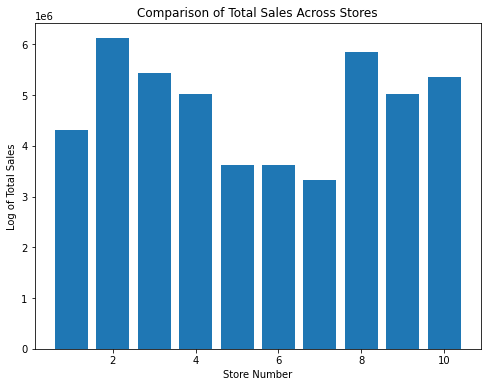

In [64]:
#Bar Chart Comparing Total Sales Across All Stores

plt.figure(figsize=(8, 6))
def bar_chart():
    x = np.arange(1, 11)
    y = []
    for i in range(1, 11):
        total_sales = sum(items_added[i])
        y.append(total_sales)
    
    plt.bar(x, y)

bar_chart()
plt.xlabel("Store Number")
plt.ylabel("Log of Total Sales")
plt.title("Comparison of Total Sales Across Stores")

# Forecasting

In [57]:
def forecast_errors(y_pred, y_test):
    
    # Mean Absolute Error (MAE)
    MAE = mean_absolute_error(y_pred, y_test) 
    #print('Mean Absolute Error (MAE): ' + str(np.round(MAE, 2)))
    
    # Median Absolute Error (MedAE)
    MEDAE = median_absolute_error(y_pred, y_test)
    #print('Median Absolute Error (MedAE): ' + str(np.round(MEDAE, 2)))
    
    # Mean Squared Error (MSE)
    MSE = mean_squared_error(y_pred, y_test)
    #print('Mean Squared Error (MSE): ' + str(np.round(MSE, 2)))

    # Root Mean Squarred Error (RMSE) 
    RMSE = mean_squared_error(y_pred, y_test, squared=False)
    #print('Root Mean Squared Error (RMSE): ' + str(np.round(RMSE, 2)))

    # Mean Absolute Percentage Error (MAPE)
    #MAPE = np.mean((np.abs(np.subtract(y_test, y_pred)/ y_test))) * 100
    MAPE = mean_absolute_percentage_error(y_test, y_pred) * 100
    #print('Mean Absolute Percentage Error (MAPE): ' + str(np.round(MAPE, 2)) + ' %')
    
    return {'MAE': MAE, 'MEDAE': MEDAE, 'MSE': MSE, 'RMSE': RMSE, 'MAPE': MAPE}

In [58]:
def preprocess_monthly(store, item, logged=False):
    subset = df[df["store"] == store]
    subset = subset[subset["item"] == item]
    subset = subset[["sales"]]
    subset = subset.resample('MS').sum()
    
    if logged == True:
        subset["sales"] = np.log(subset["sales"] + 1)
    
    train = subset[:54]
    test = subset[54:]
    
    return(subset, train, test)

In [59]:
def preprocess_weekly(store, item, logged=False):
    subset = df[df["store"] == store]
    subset = subset[subset["item"] == item]
    subset = subset[["sales"]]
    subset = subset.resample('W').sum()
    
    if logged == True:
        subset["sales"] = np.log(subset["sales"] + 1)
    
    train = subset[:249]
    test = subset[249:]
    
    return(subset, train, test)

In [60]:
def preprocess(store, item, logged=False):
    #Creating subset of data respective to store-item combination
    subset = df[df["store"] == store]
    subset = subset[subset["item"] == item]
    subset = subset[["sales"]]
    
    if logged == True:
        subset["sales"] = np.log(subset["sales"] + 1) 
    
    #Test/Train Split
    train = subset[:1736]
    test = subset[1736:]
    
    return (subset, train, test)

In [61]:
pd.set_option("display.max_columns", None)
def rolling_predictions(train_x, train_y, test_x, test_y, model, date_col="date", sales_col="sales", proph=False, monthly=False, weekly=False):
    combined = pd.concat([train_x, test_x]) 
    for i in range(len(test_y)):
        if proph:
            combined = combined.reset_index()
        next_row = combined.iloc[[(len(train_y) + i)]]
        new_value = model.predict(next_row)
        if proph:
            new_value = new_value[['yhat']].values[0][0]
            
        test_y.iloc[i] = new_value
        combined = pd.concat([train_y, test_y])
        
        if proph == False:
            combined = combined.to_frame(name=sales_col)
        if monthly:
            combined = regression_preprocess_monthly(combined, 
                                                     future_forecast=True, 
                                                     date_col=date_col, 
                                                     sales_col=sales_col)
        elif weekly:
            combined = regression_preprocess_weekly(combined, 
                                                     future_forecast=True, 
                                                     date_col=date_col, 
                                                     sales_col=sales_col)
        
        else:
            combined = regression_preprocess(combined, with_year=False, 
                                             future_forecast=True, 
                                             date_col=date_col, 
                                             sales_col=sales_col)
        combined.drop(sales_col, axis=1, inplace=True)

    return test_y

In [62]:
def regression_preprocess_monthly(subset, p=6, future_forecast=False, date_col="date", sales_col="sales"):
    #Adding Dummy Variables
    subset = subset.reset_index()
    subset['month'] = subset[date_col].dt.month
    months = pd.get_dummies(subset["month"], prefix="month")
    subset = subset.drop("month", axis = 1)
    subset = subset.join(months)
    
    #lag1-12 variables
    for i in range(1, 13):
        subset["lag{}".format(i)] = subset[sales_col].shift(i)
    
    #rolling mean
    subset["rolling mean"] = subset["lag1"].rolling(12, min_periods=1).mean()
    
    #Lag Variables for rolling mean
    for i in range(1, 13):
        subset["rolling mean lag{}".format(i)] = subset["rolling mean"].shift(i)
        
    #rolling max
    subset["rolling max"] = subset["lag1"].rolling(12, min_periods=1).max()
    
    #Test/Train Split
    finaldf = subset.set_index(date_col)
    
    if future_forecast == True:
        return finaldf
    
    test_length=p
    end_point = len(finaldf)
    x = end_point - test_length
    finaldf_train = finaldf.iloc[:x, :]
    
    #Remove rows with Null values introduced by lag variables
    finaldf_train.dropna(inplace=True)
    
    finaldf_test = finaldf.iloc[x:, :]
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != sales_col]
    finaldf_test_y = finaldf_test[sales_col]
    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != sales_col]
    finaldf_train_y = finaldf_train[sales_col]
    
    return [finaldf_test_x, finaldf_test_y, finaldf_train_x, finaldf_train_y]

In [63]:
def regression_preprocess_weekly(subset, p=12, future_forecast=False, date_col="date", sales_col="sales"):
    #Adding Dummy Variables
    subset = subset.reset_index()
    subset['month'] = subset[date_col].dt.month
    months = pd.get_dummies(subset["month"], prefix="month")
    subset = subset.drop("month", axis = 1)
    subset = subset.join(months)
    
    #lag1-12 variables
    for i in range(1, 6):
        subset["lag{}".format(i)] = subset[sales_col].shift(i)
    
    #rolling mean
    subset["rolling mean"] = subset["lag1"].rolling(3, min_periods=1).mean()
    
    #Lag Variables for rolling mean
    for i in range(1, 5):
        subset["rolling mean lag{}".format(i)] = subset["rolling mean"].shift(i)
        
    #rolling max
    subset["rolling max"] = subset["lag1"].rolling(3, min_periods=1).max()
    
    #Test/Train Split
    finaldf = subset.set_index(date_col)
    
    if future_forecast == True:
        return finaldf
    
    test_length=p
    end_point = len(finaldf)
    x = end_point - test_length
    finaldf_train = finaldf.iloc[:x, :]
    
    #Remove rows with Null values introduced by lag variables
    finaldf_train.dropna(inplace=True)
    
    finaldf_test = finaldf.iloc[x:, :]
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != sales_col]
    finaldf_test_y = finaldf_test[sales_col]
    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != sales_col]
    finaldf_train_y = finaldf_train[sales_col]
    
    return [finaldf_test_x, finaldf_test_y, finaldf_train_x, finaldf_train_y]

In [64]:
def regression_preprocess(subset, with_year=False, p=90, future_forecast=False, date_col="date", sales_col="sales"):
    #Adding Dummy Variables
    subset = subset.reset_index()
    subset['day_of_week'] = subset[date_col].dt.weekday
    subset['day_of_month'] = subset[date_col].dt.day
    subset['month'] = subset[date_col].dt.month
    week_days = pd.get_dummies(subset["day_of_week"], prefix="week_day")
    month_days = pd.get_dummies(subset["day_of_month"], prefix="month_day")
    months = pd.get_dummies(subset["month"], prefix="month")
    
    
    if with_year == False:
        subset = subset.drop(["day_of_week", 'day_of_month', "month"], axis = 1)
        subset = subset.join([week_days, month_days, months])
    else:
        subset['year'] = subset[date_col].dt.year
        year = pd.get_dummies(subset["year"], prefix="year")
        subset = subset.drop(["day_of_week", "month", 'year'], axis = 1)
        subset = subset.join([week_days, months, year])
    
    #Lag Variables (multiples of 7) variables
    subset["lag1"] = subset[sales_col].shift(1)
    for i in range(7, 29, 7):
        subset["lag{}".format(i)] = subset[sales_col].shift(i)
        
    #rolling mean
    subset["rolling mean"] = subset["lag1"].rolling(7, min_periods=1).mean()
    
    #rolling max
    subset["rolling max"] = subset["lag1"].rolling(7, min_periods=1).max()
    
    #Lag Variables for rolling mean & rolling median
    for i in range(1, 31):
        subset["rolling mean lag{}".format(i)] = subset["rolling mean"].shift(i)
    
    #Test/Train Split
    finaldf = subset.set_index(date_col)
    
    if future_forecast == True:
        return finaldf
    
    test_length=p
    end_point = len(finaldf)
    x = end_point - test_length
    finaldf_train = finaldf.iloc[:x, :]
    
    #Remove rows with Null values introduced by lag variables
    finaldf_train.dropna(inplace=True)
    
    finaldf_test = finaldf.iloc[x:, :]
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != sales_col]
    finaldf_test_y = finaldf_test[sales_col]
    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != sales_col]
    finaldf_train_y = finaldf_train[sales_col]
    
    return [finaldf_test_x, finaldf_test_y, finaldf_train_x, finaldf_train_y]

# xgboost Model

In [115]:
def xgboost_forecast(stores=range(1, 11), items=range(1, 51), features=False, with_year=False, future=False, 
                     log=False, weekly=False, monthly=False, **args):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            if monthly:
                subset, d, e = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, d, e = preprocess_weekly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, d, e = preprocess(store, item, logged=True)
                else:
                    subset, f, g = preprocess(store, item, logged=False)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
                
            #Adding regressors and making test/train split
            if monthly:
                further_preprocess = regression_preprocess_monthly(subset, p=6)
            elif weekly:
                further_preprocess = regression_preprocess_weekly(subset, p=12)
            else:
                further_preprocess = regression_preprocess(subset, with_year=False, p=90)
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
        
            #Model + Prediction
            trained_model = xgb.XGBRegressor(**args).fit(
                finaldf_train_x, finaldf_train_y)
            
            if monthly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=True)
            elif weekly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, weekly=True)
            else:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=False)
            y_pred = pd.DataFrame(predicted_values)
            
            
            
            #Appending forecasted values and error metrics to respective dfs
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred["sales"]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred["sales"].round()
            
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.values).round(), 
                                                 np.exp(test_y.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), 
                                                 test_y.values)
                errors.append(error_dict)
            
            if features:
                #Feature Importance Matrix
                features = finaldf_train_x.columns
                coefs = trained_model.feature_importances_
                importance = pd.DataFrame({'features': features, 'coefs': coefs})
                return importance
                
   
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df
    
    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

### xgboost parameter optimization

In [120]:
def objective(trial):
    param = {
        "silent": 1,
        "booster": "gbtree"
    }
    
    param["reg_alpha"] = trial.suggest_loguniform("reg_alpha", 1e-5, 1)
    param["n_estimators"] = trial.suggest_int("n_estimators", 100, 500)
    param["alpha"] = trial.suggest_loguniform("alpha", 1e-8, 3.0)
    param["lambda"] = trial.suggest_loguniform("lambda", 1e-8, 3.0)
    param["max_depth"] = trial.suggest_int("max_depth", 1, 9)
    param["eta"] = trial.suggest_loguniform("eta", 1e-8, 0.5)
    param["gamma"] = trial.suggest_loguniform("gamma", 1e-8, 3.0)
    param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
    param["subsample"] = trial.suggest_loguniform("subsample", 0.4, 1.0)
    param["colsample_bytree"] = trial.suggest_loguniform("colsample_bytree", 0.2, 1.0)
    
    # modeling
    results = xgboost_forecast(stores=[1], items=[1],
                               log=True,
                               weekly=True,
                               **param)
    errors = results[1]["MAPE"]
    
    return errors.mean()

In [122]:
study_xgboost = optuna.create_study()
study_xgboost.optimize(objective, n_trials=100)
xgboost_optimized_parameters = study_xgboost.best_params
xgboost_optimized_parameters

[I 2021-12-07 16:28:19,997] A new study created in memory with name: no-name-ad67704e-f1ad-40e9-967c-5676473dee43
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:20,772] Trial 0 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.00021363633287184455, 'n_estimators': 241, 'alpha': 1.7277892262995145e-07, 'lambda': 8.136564715717781e-07, 'max_depth': 8, 'eta': 2.5177573862269864e-08, 'gamma': 0.0016071344926704835, 'grow_policy': 'lossguide', 'subsample': 0.9474983089452438, 'colsample_bytree': 0.3771222238798405}. Best is trial 0 with value: 98.57194468857476.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:21,335] Trial 1 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.000178675034653833, 'n_estimators': 454, 'alpha': 0.0008095228118008263, 'lambda': 1.3922505620693308e-07, 'max_depth': 3, 'eta': 8.273619128919673e-08, 'gamma': 7.076670303223984e-07, 'grow_policy': 'lossguide', 'subsample': 0.5330866117286766, 'colsample_bytree': 0.6331266710552994}. Best is trial 0 with value: 98.57194468857476.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:21,916] Trial 2 finished with value: 52.02209930927214 and parameters: {'reg_alpha': 0.02012294731136062, 'n_estimators': 446, 'alpha': 2.5539346395820315e-08, 'lambda': 3.336327626521009e-08, 'max_depth': 4, 'eta': 0.005471448339907178, 'gamma': 0.0007286705690534828, 'grow_policy': 'depthwise', 'subsample': 0.5401929041926798, 'colsample_bytree': 0.3974030627263017}. Best is trial 2 with value: 52.02209930927214.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:22,780] Trial 3 finished with value: 9.372149084899945 and parameters: {'reg_alpha': 0.0045216013792906224, 'n_estimators': 499, 'alpha': 2.5521640008952524e-07, 'lambda': 1.2551342134789743e-08, 'max_depth': 9, 'eta': 0.02143802113522103, 'gamma': 0.0018547743072531086, 'grow_policy': 'lossguide', 'subsample': 0.5575285289460342, 'colsample_bytree': 0.3071854408945374}. Best is trial 3 with value: 9.372149084899945.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:23,298] Trial 4 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.040020455570242454, 'n_estimators': 477, 'alpha': 0.00011814010074028291, 'lambda': 0.4157983838091539, 'max_depth': 2, 'eta': 1.4715835890881053e-06, 'gamma': 8.022419113922528e-08, 'grow_policy': 'depthwise', 'subsample': 0.7397993757926589, 'colsample_bytree': 0.4331293789124524}. Best is trial 3 with value: 9.372149084899945.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:23,819] Trial 5 finished with value: 95.65952775941801 and parameters: {'reg_alpha': 0.00282731835797886, 'n_estimators': 112, 'alpha': 0.010077518620168644, 'lambda': 1.1391286619747068e-07, 'max_depth': 7, 'eta': 0.0034860198433745, 'gamma': 0.0008238185379407017, 'grow_policy': 'lossguide', 'subsample': 0.4246815499981382, 'colsample_bytree': 0.7562965761353707}. Best is trial 3 with value: 9.372149084899945.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:24,354] Trial 6 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.009963284020695792, 'n_estimators': 442, 'alpha': 8.633984771792181e-05, 'lambda': 0.0021224223162211106, 'max_depth': 3, 'eta': 4.070747452154403e-06, 'gamma': 1.947176719102757e-07, 'grow_policy': 'lossguide', 'subsample': 0.9531031712710338, 'colsample_bytree': 0.5405701068264092}. Best is trial 3 with value: 9.372149084899945.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:24,844] Trial 7 finished with value: 8.92746589791588 and parameters: {'reg_alpha': 1.491423465332486e-05, 'n_estimators': 123, 'alpha': 1.4726212151974747, 'lambda': 6.509922201777736e-07, 'max_depth': 8, 'eta': 0.0702978510001154, 'gamma': 0.3388089173216185, 'grow_policy': 'depthwise', 'subsample': 0.403580518885083, 'colsample_bytree': 0.21101445506463642}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:25,294] Trial 8 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.29909947069079273, 'n_estimators': 267, 'alpha': 0.0003323411944029053, 'lambda': 0.0002963014427964789, 'max_depth': 1, 'eta': 6.9713313484703365e-06, 'gamma': 0.00022136284382574017, 'grow_policy': 'depthwise', 'subsample': 0.9586383084525036, 'colsample_bytree': 0.2767277712302275}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:25,731] Trial 9 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.00038426545912044225, 'n_estimators': 179, 'alpha': 4.6966378854117054e-05, 'lambda': 0.05846858142413389, 'max_depth': 8, 'eta': 3.832801485614386e-06, 'gamma': 0.20103573238451167, 'grow_policy': 'lossguide', 'subsample': 0.5282574808034124, 'colsample_bytree': 0.31451362777656633}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:26,381] Trial 10 finished with value: 9.546832680624203 and parameters: {'reg_alpha': 1.1772475533407168e-05, 'n_estimators': 370, 'alpha': 1.643631520844197, 'lambda': 4.990650926477422e-06, 'max_depth': 6, 'eta': 0.4676616255086168, 'gamma': 0.6964433204593289, 'grow_policy': 'depthwise', 'subsample': 0.403106311500811, 'colsample_bytree': 0.22234482617783904}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:27,186] Trial 11 finished with value: 11.325841691483435 and parameters: {'reg_alpha': 1.3570754204298795e-05, 'n_estimators': 316, 'alpha': 9.631677866027776e-07, 'lambda': 1.1418952721400556e-08, 'max_depth': 9, 'eta': 0.35633117791754954, 'gamma': 0.08636209201695791, 'grow_policy': 'depthwise', 'subsample': 0.6788750047966341, 'colsample_bytree': 0.2102544405871995}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:27,719] Trial 12 finished with value: 95.65952775941801 and parameters: {'reg_alpha': 0.0013297053063975578, 'n_estimators': 115, 'alpha': 0.18487884893387005, 'lambda': 8.652304491037523e-06, 'max_depth': 9, 'eta': 0.0032083760616553308, 'gamma': 0.0204347879381641, 'grow_policy': 'depthwise', 'subsample': 0.4687725106007459, 'colsample_bytree': 0.2904190955992087}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:28,317] Trial 13 finished with value: 10.909651861651708 and parameters: {'reg_alpha': 0.15308335396279377, 'n_estimators': 361, 'alpha': 2.7122254060305517e-06, 'lambda': 1.1970953910346084e-05, 'max_depth': 6, 'eta': 0.02331062045109068, 'gamma': 5.3887211329859215e-06, 'grow_policy': 'lossguide', 'subsample': 0.6068320230125892, 'colsample_bytree': 0.9688116761536651}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:28,992] Trial 14 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 3.810106327076088e-05, 'n_estimators': 195, 'alpha': 0.016446861619557405, 'lambda': 7.962819469183767e-07, 'max_depth': 7, 'eta': 0.00016435756181484132, 'gamma': 7.701687168720117e-06, 'grow_policy': 'depthwise', 'subsample': 0.7536149832964493, 'colsample_bytree': 0.24141001389783603}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:29,864] Trial 15 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.0011977707789765416, 'n_estimators': 382, 'alpha': 5.589471649301119e-06, 'lambda': 1.0429616683264196e-08, 'max_depth': 9, 'eta': 0.0001872676183179737, 'gamma': 2.0815265480070293, 'grow_policy': 'lossguide', 'subsample': 0.4632001458067689, 'colsample_bytree': 0.3330267478700526}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:30,395] Trial 16 finished with value: 9.072657158710353 and parameters: {'reg_alpha': 0.009242564182130474, 'n_estimators': 177, 'alpha': 2.2712245304408246e-08, 'lambda': 0.00011584176269135395, 'max_depth': 5, 'eta': 0.04618476338864468, 'gamma': 0.01897549746130377, 'grow_policy': 'lossguide', 'subsample': 0.6076748985262403, 'colsample_bytree': 0.20102652309390692}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:30,953] Trial 17 finished with value: 10.370317078311347 and parameters: {'reg_alpha': 0.08115465247767206, 'n_estimators': 170, 'alpha': 2.1198554128100255, 'lambda': 0.0001735830957159649, 'max_depth': 5, 'eta': 0.0665450690515612, 'gamma': 0.05408034603358204, 'grow_policy': 'depthwise', 'subsample': 0.8063337095532886, 'colsample_bytree': 0.24766982087918155}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:31,432] Trial 18 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 5.0514721990923655e-05, 'n_estimators': 143, 'alpha': 0.005311754324839576, 'lambda': 0.0028012644058531197, 'max_depth': 5, 'eta': 0.0006201689260043438, 'gamma': 0.007881179049172005, 'grow_policy': 'lossguide', 'subsample': 0.6141084023238481, 'colsample_bytree': 0.202989003862504}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:32,005] Trial 19 finished with value: 9.520083422101878 and parameters: {'reg_alpha': 0.6215975382268147, 'n_estimators': 230, 'alpha': 2.230518453057054e-08, 'lambda': 3.081668150717269e-05, 'max_depth': 4, 'eta': 0.06854084115289512, 'gamma': 0.45903479616248244, 'grow_policy': 'depthwise', 'subsample': 0.471427088264447, 'colsample_bytree': 0.5172710402648955}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:32,501] Trial 20 finished with value: 97.85791703286218 and parameters: {'reg_alpha': 0.009982723316910974, 'n_estimators': 202, 'alpha': 0.08388483128468505, 'lambda': 0.002405147660711527, 'max_depth': 6, 'eta': 0.0006418747179648487, 'gamma': 2.1326498839706564e-05, 'grow_policy': 'depthwise', 'subsample': 0.8217120754025439, 'colsample_bytree': 0.25798409629753793}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:33,211] Trial 21 finished with value: 11.076945007406808 and parameters: {'reg_alpha': 0.004426718751464653, 'n_estimators': 295, 'alpha': 3.673372573820751e-07, 'lambda': 7.287780366973837e-07, 'max_depth': 8, 'eta': 0.020887338212609394, 'gamma': 0.00587880634750483, 'grow_policy': 'lossguide', 'subsample': 0.5747765234074558, 'colsample_bytree': 0.33686173366953265}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:33,795] Trial 22 finished with value: 15.082231209256097 and parameters: {'reg_alpha': 0.0006509444041912181, 'n_estimators': 101, 'alpha': 1.1670265551797795e-08, 'lambda': 1.694462294549612e-07, 'max_depth': 7, 'eta': 0.14815718764027366, 'gamma': 0.007088938515305647, 'grow_policy': 'lossguide', 'subsample': 0.6787599963944345, 'colsample_bytree': 0.20077364990025617}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:34,314] Trial 23 finished with value: 55.82995609132233 and parameters: {'reg_alpha': 0.004015112376364788, 'n_estimators': 149, 'alpha': 8.693389354542288e-08, 'lambda': 5.3497201621471654e-05, 'max_depth': 8, 'eta': 0.014943858401449845, 'gamma': 5.738967375308086e-05, 'grow_policy': 'lossguide', 'subsample': 0.4996017849936406, 'colsample_bytree': 0.23643988471078303}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:34,875] Trial 24 finished with value: 97.08758307084325 and parameters: {'reg_alpha': 0.022388218047202327, 'n_estimators': 216, 'alpha': 8.499216432032586e-06, 'lambda': 2.672935691426827e-06, 'max_depth': 9, 'eta': 0.001188777409076468, 'gamma': 2.10007995649173, 'grow_policy': 'lossguide', 'subsample': 0.6653480391367849, 'colsample_bytree': 0.282486771491742}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:35,542] Trial 25 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.00927378787600953, 'n_estimators': 406, 'alpha': 1.7679724431746546e-05, 'lambda': 4.849987119050087e-08, 'max_depth': 4, 'eta': 3.642076853983518e-05, 'gamma': 0.03415650556665965, 'grow_policy': 'lossguide', 'subsample': 0.5737299571511618, 'colsample_bytree': 0.2336368579267129}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:36,283] Trial 26 finished with value: 10.888448187072818 and parameters: {'reg_alpha': 0.0018381114036965808, 'n_estimators': 326, 'alpha': 1.0383568202227503e-06, 'lambda': 2.7495860084367423, 'max_depth': 7, 'eta': 0.08043124174165428, 'gamma': 0.0018171061780988239, 'grow_policy': 'lossguide', 'subsample': 0.42154602774837985, 'colsample_bytree': 0.3621229667988597}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:36,821] Trial 27 finished with value: 37.69780026894989 and parameters: {'reg_alpha': 8.877814565588385e-05, 'n_estimators': 256, 'alpha': 7.5593946179862e-08, 'lambda': 0.02659797057672412, 'max_depth': 6, 'eta': 0.01137899938897579, 'gamma': 0.19086088747934157, 'grow_policy': 'lossguide', 'subsample': 0.5768036543388753, 'colsample_bytree': 0.2915692596538191}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:37,314] Trial 28 finished with value: 12.026614522377168 and parameters: {'reg_alpha': 0.05384908624788154, 'n_estimators': 142, 'alpha': 0.0012999043658316512, 'lambda': 0.000373211896955018, 'max_depth': 5, 'eta': 0.04144123395556144, 'gamma': 0.0001949647892770288, 'grow_policy': 'depthwise', 'subsample': 0.495389900518276, 'colsample_bytree': 0.2656786172398418}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:38,364] Trial 29 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.0004325453605130946, 'n_estimators': 495, 'alpha': 1.956215980576064e-07, 'lambda': 4.2632340628616636e-07, 'max_depth': 8, 'eta': 3.129423770326245e-08, 'gamma': 0.0024601136123199438, 'grow_policy': 'lossguide', 'subsample': 0.6410293801504912, 'colsample_bytree': 0.3852402018496714}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:39,085] Trial 30 finished with value: 10.955502751631292 and parameters: {'reg_alpha': 0.0001986868662739457, 'n_estimators': 279, 'alpha': 0.21053369491274856, 'lambda': 1.486397603068323e-06, 'max_depth': 8, 'eta': 0.2576795164417915, 'gamma': 0.020636131905371967, 'grow_policy': 'lossguide', 'subsample': 0.7303412113267316, 'colsample_bytree': 0.21788253807658498}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:39,588] Trial 31 finished with value: 8.956611191546488 and parameters: {'reg_alpha': 0.6314171533677195, 'n_estimators': 238, 'alpha': 2.9685979982554922e-08, 'lambda': 3.823936905883251e-05, 'max_depth': 4, 'eta': 0.08641498621669289, 'gamma': 0.2910882234022575, 'grow_policy': 'depthwise', 'subsample': 0.4503273124176443, 'colsample_bytree': 0.5401622096415214}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:40,045] Trial 32 finished with value: 71.43889377149559 and parameters: {'reg_alpha': 0.8799640909243176, 'n_estimators': 231, 'alpha': 4.8133866037697965e-08, 'lambda': 2.2989705917275233e-05, 'max_depth': 3, 'eta': 0.005573391330132105, 'gamma': 0.65906507263177, 'grow_policy': 'depthwise', 'subsample': 0.43948380239388285, 'colsample_bytree': 0.5131601596174868}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:40,514] Trial 33 finished with value: 9.184602831223499 and parameters: {'reg_alpha': 0.13464385243743188, 'n_estimators': 161, 'alpha': 3.817981732756684e-07, 'lambda': 8.982791663517841e-05, 'max_depth': 4, 'eta': 0.18298109549493805, 'gamma': 0.11849582347813675, 'grow_policy': 'depthwise', 'subsample': 0.44518939624455195, 'colsample_bytree': 0.431413329107809}. Best is trial 7 with value: 8.92746589791588.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:41,041] Trial 34 finished with value: 8.486541079616378 and parameters: {'reg_alpha': 0.29199701457638194, 'n_estimators': 176, 'alpha': 6.895802614613535e-07, 'lambda': 9.122736108522251e-05, 'max_depth': 4, 'eta': 0.13478578822397508, 'gamma': 0.2495622735386203, 'grow_policy': 'depthwise', 'subsample': 0.4049062714811336, 'colsample_bytree': 0.6387011560193464}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:41,506] Trial 35 finished with value: 13.784067720286789 and parameters: {'reg_alpha': 0.4273557610715579, 'n_estimators': 190, 'alpha': 1.0455036928051753e-08, 'lambda': 0.0008088265772099955, 'max_depth': 2, 'eta': 0.09256154937851985, 'gamma': 2.911606995916318, 'grow_policy': 'depthwise', 'subsample': 0.4008543605354688, 'colsample_bytree': 0.6583046301433567}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:41,990] Trial 36 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.2634480028932834, 'n_estimators': 132, 'alpha': 6.431458378973457e-08, 'lambda': 0.006244027240767424, 'max_depth': 3, 'eta': 3.2488833814919617e-07, 'gamma': 1.0712954752495636e-08, 'grow_policy': 'depthwise', 'subsample': 0.5017738701007726, 'colsample_bytree': 0.6114899188888934}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:42,465] Trial 37 finished with value: 70.05275413037985 and parameters: {'reg_alpha': 0.13433494681899807, 'n_estimators': 212, 'alpha': 8.668524591073874e-07, 'lambda': 0.00010113808567060535, 'max_depth': 4, 'eta': 0.0068595595250854355, 'gamma': 0.3567274379496505, 'grow_policy': 'depthwise', 'subsample': 0.43013989897960175, 'colsample_bytree': 0.7728479858361268}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:43,047] Trial 38 finished with value: 14.337242728337054 and parameters: {'reg_alpha': 0.028533894730640406, 'n_estimators': 249, 'alpha': 2.8311420440784778e-08, 'lambda': 0.000868976643427161, 'max_depth': 5, 'eta': 0.03827900857275299, 'gamma': 0.9286940239388028, 'grow_policy': 'depthwise', 'subsample': 0.4179004153945527, 'colsample_bytree': 0.5933972582047186}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:43,555] Trial 39 finished with value: 92.80341713656757 and parameters: {'reg_alpha': 0.06336469775556587, 'n_estimators': 169, 'alpha': 0.0006503153456087769, 'lambda': 1.5525641106328793e-05, 'max_depth': 2, 'eta': 0.003310579289005224, 'gamma': 0.07888867095613572, 'grow_policy': 'depthwise', 'subsample': 0.4505949538227365, 'colsample_bytree': 0.6974487709281775}. Best is trial 34 with value: 8.486541079616378.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:44,017] Trial 40 finished with value: 8.041919634645167 and parameters: {'reg_alpha': 0.37687986196277423, 'n_estimators': 123, 'alpha': 2.6221630419317608e-05, 'lambda': 5.207642692309808e-06, 'max_depth': 3, 'eta': 0.49490983689426526, 'gamma': 0.2553546665039502, 'grow_policy': 'depthwise', 'subsample': 0.40143358233656573, 'colsample_bytree': 0.48101451288361835}. Best is trial 40 with value: 8.041919634645167.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:44,516] Trial 41 finished with value: 12.935151583776964 and parameters: {'reg_alpha': 0.9725050411937745, 'n_estimators': 127, 'alpha': 3.6153519326653625e-05, 'lambda': 3.6747122671247437e-06, 'max_depth': 3, 'eta': 0.38913124322708875, 'gamma': 0.14734374961467225, 'grow_policy': 'depthwise', 'subsample': 0.40057412045213137, 'colsample_bytree': 0.5570963716591628}. Best is trial 40 with value: 8.041919634645167.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:45,022] Trial 42 finished with value: 10.708548921446521 and parameters: {'reg_alpha': 0.2718953330274301, 'n_estimators': 118, 'alpha': 3.5722987431594568e-06, 'lambda': 4.5039760644670555e-05, 'max_depth': 4, 'eta': 0.15574592502536816, 'gamma': 0.017025905525454004, 'grow_policy': 'depthwise', 'subsample': 0.9010529363130383, 'colsample_bytree': 0.470806243646058}. Best is trial 40 with value: 8.041919634645167.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:45,476] Trial 43 finished with value: 12.763559534423058 and parameters: {'reg_alpha': 0.6096930392797624, 'n_estimators': 156, 'alpha': 0.00014063640011125245, 'lambda': 2.435410955562402e-06, 'max_depth': 3, 'eta': 0.03622955916976411, 'gamma': 1.1028977330458225, 'grow_policy': 'depthwise', 'subsample': 0.41541883336456487, 'colsample_bytree': 0.469627277592827}. Best is trial 40 with value: 8.041919634645167.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:45,945] Trial 44 finished with value: 11.69764243248127 and parameters: {'reg_alpha': 0.18660005975034238, 'n_estimators': 183, 'alpha': 1.1153830689066134e-07, 'lambda': 1.9368140103408386e-07, 'max_depth': 2, 'eta': 0.20080072502111687, 'gamma': 0.27294656826725844, 'grow_policy': 'depthwise', 'subsample': 0.48159032496854953, 'colsample_bytree': 0.8784221194717604}. Best is trial 40 with value: 8.041919634645167.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:46,379] Trial 45 finished with value: 6.038029698157393 and parameters: {'reg_alpha': 0.3988969176217476, 'n_estimators': 113, 'alpha': 1.294195744429715e-06, 'lambda': 6.926422533709281e-06, 'max_depth': 1, 'eta': 0.3625567242237637, 'gamma': 0.045539317205311354, 'grow_policy': 'depthwise', 'subsample': 0.5233102903453903, 'colsample_bytree': 0.4116413419936202}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:46,818] Trial 46 finished with value: 7.372813986145829 and parameters: {'reg_alpha': 0.4431375859388045, 'n_estimators': 104, 'alpha': 1.822750500558181e-05, 'lambda': 9.774265042065647e-06, 'max_depth': 1, 'eta': 0.38561527291413555, 'gamma': 0.05322247273049203, 'grow_policy': 'depthwise', 'subsample': 0.5367810513216507, 'colsample_bytree': 0.4248410324224425}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:47,250] Trial 47 finished with value: 12.092536058980203 and parameters: {'reg_alpha': 0.08025904977517026, 'n_estimators': 106, 'alpha': 1.8441217823003652e-06, 'lambda': 8.086803502626515e-06, 'max_depth': 1, 'eta': 0.3476887654118364, 'gamma': 0.0006076088664594555, 'grow_policy': 'depthwise', 'subsample': 0.5325775193768422, 'colsample_bytree': 0.42206050726163824}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:47,683] Trial 48 finished with value: 11.760660233731436 and parameters: {'reg_alpha': 0.31490204933964533, 'n_estimators': 122, 'alpha': 1.4641276602935134e-05, 'lambda': 1.2896218288102716e-06, 'max_depth': 1, 'eta': 0.4954600508575229, 'gamma': 0.06350136899040842, 'grow_policy': 'depthwise', 'subsample': 0.5238296012319665, 'colsample_bytree': 0.4737895544450417}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:48,148] Trial 49 finished with value: 14.025220196571988 and parameters: {'reg_alpha': 0.4286704211817924, 'n_estimators': 101, 'alpha': 5.391820286782879e-05, 'lambda': 3.55025032009856e-07, 'max_depth': 1, 'eta': 0.14683501356362447, 'gamma': 1.2841838375343764, 'grow_policy': 'depthwise', 'subsample': 0.548605625246204, 'colsample_bytree': 0.40725918233718084}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:48,626] Trial 50 finished with value: 10.802533656015932 and parameters: {'reg_alpha': 0.10226369127292115, 'n_estimators': 136, 'alpha': 0.00020431696701704238, 'lambda': 3.8560925103411635e-08, 'max_depth': 2, 'eta': 0.4679103325435744, 'gamma': 0.040795722448794015, 'grow_policy': 'depthwise', 'subsample': 0.4308660234124269, 'colsample_bytree': 0.35523363203164016}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:49,068] Trial 51 finished with value: 9.639390610752026 and parameters: {'reg_alpha': 0.5047060690555021, 'n_estimators': 155, 'alpha': 1.8195130835415308e-05, 'lambda': 7.228064870951455e-06, 'max_depth': 1, 'eta': 0.10352940511437897, 'gamma': 0.3565423264990141, 'grow_policy': 'depthwise', 'subsample': 0.4477343302875185, 'colsample_bytree': 0.5642434158629195}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:49,510] Trial 52 finished with value: 68.51921358688712 and parameters: {'reg_alpha': 0.2395701492331345, 'n_estimators': 118, 'alpha': 8.060484294999078e-07, 'lambda': 1.722245762829631e-05, 'max_depth': 2, 'eta': 0.012778114507408667, 'gamma': 0.15002063188182815, 'grow_policy': 'depthwise', 'subsample': 0.4606247537170936, 'colsample_bytree': 0.5142220811036365}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:49,961] Trial 53 finished with value: 17.047636766990667 and parameters: {'reg_alpha': 0.7953619071138512, 'n_estimators': 135, 'alpha': 6.53333727255594e-06, 'lambda': 0.00024680543049684396, 'max_depth': 3, 'eta': 0.031945427308161564, 'gamma': 0.711103603728825, 'grow_policy': 'depthwise', 'subsample': 0.413038584711045, 'colsample_bytree': 0.6744599581829166}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:50,449] Trial 54 finished with value: 11.299332764908076 and parameters: {'reg_alpha': 2.54589306684558e-05, 'n_estimators': 166, 'alpha': 0.002020555174835567, 'lambda': 4.437101056616608e-05, 'max_depth': 4, 'eta': 0.07330053197582806, 'gamma': 0.004678275740600841, 'grow_policy': 'depthwise', 'subsample': 0.517565613193446, 'colsample_bytree': 0.74852510719746}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:50,885] Trial 55 finished with value: 10.154744027278912 and parameters: {'reg_alpha': 0.3885166606976665, 'n_estimators': 114, 'alpha': 0.8782612887332415, 'lambda': 1.774628794410135e-06, 'max_depth': 1, 'eta': 0.23328127516597633, 'gamma': 0.014723274158020449, 'grow_policy': 'depthwise', 'subsample': 0.41113269715580447, 'colsample_bytree': 0.4957418070324406}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:51,371] Trial 56 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.043394842285919936, 'n_estimators': 208, 'alpha': 2.1478444477094655e-06, 'lambda': 5.619234108236949e-06, 'max_depth': 2, 'eta': 2.93148461151746e-05, 'gamma': 8.935397184106928e-07, 'grow_policy': 'depthwise', 'subsample': 0.48103892375595547, 'colsample_bytree': 0.4019190715864322}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:51,855] Trial 57 finished with value: 96.42986172143694 and parameters: {'reg_alpha': 0.16433397262616173, 'n_estimators': 146, 'alpha': 4.1993791778487667e-07, 'lambda': 6.095614360915138e-07, 'max_depth': 3, 'eta': 0.0019525843519648662, 'gamma': 0.03452524733533403, 'grow_policy': 'depthwise', 'subsample': 0.4319412657481102, 'colsample_bytree': 0.45232708666735266}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:52,333] Trial 58 finished with value: 9.954279275449904 and parameters: {'reg_alpha': 0.6206929895776444, 'n_estimators': 180, 'alpha': 0.00047171332995056303, 'lambda': 1.1322112958352393e-05, 'max_depth': 4, 'eta': 0.10022933490522509, 'gamma': 0.2980390109877174, 'grow_policy': 'depthwise', 'subsample': 0.4577976255691062, 'colsample_bytree': 0.5987541608701946}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:52,821] Trial 59 finished with value: 12.078459864142237 and parameters: {'reg_alpha': 0.10731983683399535, 'n_estimators': 226, 'alpha': 5.656665363069931e-05, 'lambda': 4.617726233533814e-06, 'max_depth': 6, 'eta': 0.02111536461899264, 'gamma': 0.07519540906894003, 'grow_policy': 'depthwise', 'subsample': 0.47804152335605493, 'colsample_bytree': 0.31854385401306734}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:53,273] Trial 60 finished with value: 14.01016714311143 and parameters: {'reg_alpha': 0.2172984332160676, 'n_estimators': 100, 'alpha': 2.5771448410504096e-05, 'lambda': 2.5787764732559537e-05, 'max_depth': 5, 'eta': 0.24590859175014565, 'gamma': 1.5219354525765818, 'grow_policy': 'depthwise', 'subsample': 0.5112214659473574, 'colsample_bytree': 0.5564665162300085}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:53,772] Trial 61 finished with value: 8.892463708554954 and parameters: {'reg_alpha': 0.009553413490624498, 'n_estimators': 190, 'alpha': 2.279314844953283e-08, 'lambda': 6.535419975711054e-05, 'max_depth': 5, 'eta': 0.05145171596978458, 'gamma': 0.11933225559173445, 'grow_policy': 'depthwise', 'subsample': 0.5586014961998386, 'colsample_bytree': 0.22655433736391828}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:54,280] Trial 62 finished with value: 7.643084492993231 and parameters: {'reg_alpha': 9.205398455281015e-05, 'n_estimators': 195, 'alpha': 2.004081060137604e-07, 'lambda': 7.630162084903071e-05, 'max_depth': 5, 'eta': 0.05950082120762318, 'gamma': 0.14145130376509843, 'grow_policy': 'depthwise', 'subsample': 0.5855597772045059, 'colsample_bytree': 0.2197625651677237}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:54,797] Trial 63 finished with value: 62.500711982888966 and parameters: {'reg_alpha': 1.8597389761046132e-05, 'n_estimators': 195, 'alpha': 2.8326023887091104e-07, 'lambda': 0.0005479816798578497, 'max_depth': 5, 'eta': 0.009828244794349973, 'gamma': 0.011166506317725696, 'grow_policy': 'depthwise', 'subsample': 0.5922860318351973, 'colsample_bytree': 0.2536949604401041}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:55,289] Trial 64 finished with value: 7.37960740994405 and parameters: {'reg_alpha': 9.184586987316117e-05, 'n_estimators': 130, 'alpha': 1.4549239580706707e-07, 'lambda': 0.00014221427356228151, 'max_depth': 6, 'eta': 0.05676498366701396, 'gamma': 0.11330945855746846, 'grow_policy': 'depthwise', 'subsample': 0.6455669376915103, 'colsample_bytree': 0.21750361353156603}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:55,798] Trial 65 finished with value: 11.038998493540882 and parameters: {'reg_alpha': 9.282749089529204e-05, 'n_estimators': 150, 'alpha': 1.5778460002201374e-07, 'lambda': 0.00014517406228198038, 'max_depth': 6, 'eta': 0.04432147654611566, 'gamma': 0.03247613574862625, 'grow_policy': 'depthwise', 'subsample': 0.645380367681762, 'colsample_bytree': 0.222746402865238}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:56,294] Trial 66 finished with value: 37.36213439860805 and parameters: {'reg_alpha': 0.0001478815735664017, 'n_estimators': 132, 'alpha': 6.101353920526953e-07, 'lambda': 8.2569624116526e-05, 'max_depth': 6, 'eta': 0.022386551798809034, 'gamma': 0.09480955245220546, 'grow_policy': 'depthwise', 'subsample': 0.5580776544790079, 'colsample_bytree': 0.22652857420417555}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:56,783] Trial 67 finished with value: 8.684751041001476 and parameters: {'reg_alpha': 0.00041421677130088267, 'n_estimators': 163, 'alpha': 1.2750383937512173e-06, 'lambda': 0.0003776255269317319, 'max_depth': 5, 'eta': 0.16846876263848565, 'gamma': 0.1297901739591062, 'grow_policy': 'depthwise', 'subsample': 0.6197594039772327, 'colsample_bytree': 0.21052328666317247}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:57,277] Trial 68 finished with value: 10.50644108061288 and parameters: {'reg_alpha': 0.00039411051901228956, 'n_estimators': 172, 'alpha': 1.4006634276308305e-06, 'lambda': 0.0011685067884789706, 'max_depth': 5, 'eta': 0.2541742039806507, 'gamma': 0.002780201803665943, 'grow_policy': 'depthwise', 'subsample': 0.6261752820260689, 'colsample_bytree': 0.36964743092758223}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:57,769] Trial 69 finished with value: 9.148358206219429 and parameters: {'reg_alpha': 7.246929385057151e-05, 'n_estimators': 114, 'alpha': 5.04689648618508e-06, 'lambda': 0.00042555718471388207, 'max_depth': 7, 'eta': 0.12863445692447972, 'gamma': 0.0007640003541537864, 'grow_policy': 'depthwise', 'subsample': 0.6955142112484106, 'colsample_bytree': 0.20729180188829438}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:58,281] Trial 70 finished with value: 6.99016103205176 and parameters: {'reg_alpha': 0.000781143421883611, 'n_estimators': 160, 'alpha': 1.192241823290012e-05, 'lambda': 0.0020128181864509606, 'max_depth': 6, 'eta': 0.32176834781561936, 'gamma': 0.5421754517449102, 'grow_policy': 'depthwise', 'subsample': 0.6068850202898347, 'colsample_bytree': 0.2725589584079407}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:58,782] Trial 71 finished with value: 9.917450186241089 and parameters: {'reg_alpha': 0.0007924478409389475, 'n_estimators': 142, 'alpha': 1.0683743076185628e-05, 'lambda': 0.005483367174553981, 'max_depth': 6, 'eta': 0.3001515947502478, 'gamma': 0.4646224315792689, 'grow_policy': 'depthwise', 'subsample': 0.5828269061800173, 'colsample_bytree': 0.24724446899811736}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:59,291] Trial 72 finished with value: 9.024170414565248 and parameters: {'reg_alpha': 0.00027532784474465635, 'n_estimators': 154, 'alpha': 3.2334519361134827e-06, 'lambda': 0.0002214755578802929, 'max_depth': 6, 'eta': 0.4718098613669669, 'gamma': 0.20567787177914115, 'grow_policy': 'depthwise', 'subsample': 0.6043873125396749, 'colsample_bytree': 0.2686429126974188}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:28:59,793] Trial 73 finished with value: 13.121927882352754 and parameters: {'reg_alpha': 0.00011837387056675303, 'n_estimators': 125, 'alpha': 5.539826138816621e-07, 'lambda': 0.026222223579159813, 'max_depth': 7, 'eta': 0.2081740207862787, 'gamma': 0.04870404689682562, 'grow_policy': 'depthwise', 'subsample': 0.6247780256787477, 'colsample_bytree': 0.21447444775109897}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:00,280] Trial 74 finished with value: 9.861397631355205 and parameters: {'reg_alpha': 0.002600819895903517, 'n_estimators': 168, 'alpha': 1.8602525920417476e-07, 'lambda': 0.0013349803891108138, 'max_depth': 5, 'eta': 0.14098789167947387, 'gamma': 0.023972909517702957, 'grow_policy': 'depthwise', 'subsample': 0.6540468769030062, 'colsample_bytree': 0.2372727441540266}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:00,808] Trial 75 finished with value: 9.055851152854853 and parameters: {'reg_alpha': 5.212942641280277e-05, 'n_estimators': 140, 'alpha': 7.749633828219413e-05, 'lambda': 0.0046757479751659455, 'max_depth': 7, 'eta': 0.059227894157533774, 'gamma': 0.6600130810486965, 'grow_policy': 'depthwise', 'subsample': 0.6891593123634331, 'colsample_bytree': 0.3444263837589501}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:01,351] Trial 76 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.0005872626171349725, 'n_estimators': 203, 'alpha': 4.588502732244838e-06, 'lambda': 0.00017101517370874056, 'max_depth': 6, 'eta': 2.054233253939725e-06, 'gamma': 0.15400888991503767, 'grow_policy': 'depthwise', 'subsample': 0.5870076405116071, 'colsample_bytree': 0.29953316106043787}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:01,862] Trial 77 finished with value: 13.453689831170653 and parameters: {'reg_alpha': 0.00024768920185310605, 'n_estimators': 112, 'alpha': 1.193307564141273e-06, 'lambda': 0.01118055050242178, 'max_depth': 5, 'eta': 0.2886535072705408, 'gamma': 2.124257365617445, 'grow_policy': 'depthwise', 'subsample': 0.5463896672519262, 'colsample_bytree': 0.2775234245154415}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:02,348] Trial 78 finished with value: 7.593837563081241 and parameters: {'reg_alpha': 0.0010810553925484198, 'n_estimators': 181, 'alpha': 1.0314282658322006e-05, 'lambda': 0.00046636839184571635, 'max_depth': 4, 'eta': 0.10465532133868448, 'gamma': 0.5220437943304023, 'grow_policy': 'depthwise', 'subsample': 0.7236599441203605, 'colsample_bytree': 0.3860352646829962}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:02,901] Trial 79 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.0011658393774620674, 'n_estimators': 345, 'alpha': 9.136894539675635e-06, 'lambda': 0.0020003770361389727, 'max_depth': 4, 'eta': 2.055333896164733e-07, 'gamma': 0.5830801192381047, 'grow_policy': 'depthwise', 'subsample': 0.7199210970797535, 'colsample_bytree': 0.3835701077007081}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:03,358] Trial 80 finished with value: 7.470290256835711 and parameters: {'reg_alpha': 0.0022462255336534462, 'n_estimators': 184, 'alpha': 2.5955765753632122e-05, 'lambda': 0.13711686857979707, 'max_depth': 1, 'eta': 0.0708588952263474, 'gamma': 0.21762815494971088, 'grow_policy': 'depthwise', 'subsample': 0.6634926070187969, 'colsample_bytree': 0.43839219201748447}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:03,812] Trial 81 finished with value: 7.696107606969398 and parameters: {'reg_alpha': 0.006381408125756639, 'n_estimators': 191, 'alpha': 2.804583475715845e-05, 'lambda': 2.3376594355925517, 'max_depth': 1, 'eta': 0.09413671297347566, 'gamma': 0.2325526638769124, 'grow_policy': 'depthwise', 'subsample': 0.7862710386676107, 'colsample_bytree': 0.4606493621270589}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:04,274] Trial 82 finished with value: 10.782642662076576 and parameters: {'reg_alpha': 0.005582052724006981, 'n_estimators': 218, 'alpha': 2.623114556056245e-05, 'lambda': 0.7117988249561034, 'max_depth': 1, 'eta': 0.0282342603831124, 'gamma': 0.05939982108925989, 'grow_policy': 'depthwise', 'subsample': 0.79452153966074, 'colsample_bytree': 0.4499038773494823}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:04,731] Trial 83 finished with value: 7.8510630995638415 and parameters: {'reg_alpha': 0.002299553895270041, 'n_estimators': 187, 'alpha': 0.00010300641052748052, 'lambda': 0.5557573456276599, 'max_depth': 1, 'eta': 0.08618074203939562, 'gamma': 0.3915869305714381, 'grow_policy': 'depthwise', 'subsample': 0.7747961666962168, 'colsample_bytree': 0.41567086808208153}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:05,184] Trial 84 finished with value: 37.58067810799583 and parameters: {'reg_alpha': 0.0021312794826275306, 'n_estimators': 189, 'alpha': 0.00019554537977923585, 'lambda': 0.29856160826470746, 'max_depth': 1, 'eta': 0.015035492024101671, 'gamma': 0.5415179959672668, 'grow_policy': 'depthwise', 'subsample': 0.7513137019208077, 'colsample_bytree': 0.4221963174152522}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:05,656] Trial 85 finished with value: 14.294929796738911 and parameters: {'reg_alpha': 0.0012881952736280406, 'n_estimators': 266, 'alpha': 0.00011430020888504346, 'lambda': 2.2533798061709445, 'max_depth': 1, 'eta': 0.08091230840326633, 'gamma': 2.892198614794328, 'grow_policy': 'depthwise', 'subsample': 0.7917621170439123, 'colsample_bytree': 0.39279152247241217}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:06,113] Trial 86 finished with value: 10.182040622267856 and parameters: {'reg_alpha': 0.006396574657297936, 'n_estimators': 201, 'alpha': 0.00034852042425804455, 'lambda': 0.29223612036469937, 'max_depth': 1, 'eta': 0.047646116202445445, 'gamma': 4.9190323189488336e-05, 'grow_policy': 'depthwise', 'subsample': 0.8673397944357566, 'colsample_bytree': 0.408924339612968}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:06,565] Trial 87 finished with value: 66.65509846100827 and parameters: {'reg_alpha': 0.0033611630204331733, 'n_estimators': 181, 'alpha': 4.6041810185942886e-05, 'lambda': 0.8885326114559585, 'max_depth': 1, 'eta': 0.008351419962223543, 'gamma': 0.9922108595083143, 'grow_policy': 'depthwise', 'subsample': 0.7017090914718614, 'colsample_bytree': 0.4425716132606361}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:07,034] Trial 88 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.01601090652756431, 'n_estimators': 221, 'alpha': 8.235500451025855e-06, 'lambda': 0.16893821064517098, 'max_depth': 2, 'eta': 0.0002906829045918055, 'gamma': 1.6646444456765466, 'grow_policy': 'depthwise', 'subsample': 0.7785183251856893, 'colsample_bytree': 0.3748974137026491}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:07,541] Trial 89 finished with value: 8.747089032856186 and parameters: {'reg_alpha': 0.0008923725565741322, 'n_estimators': 409, 'alpha': 1.5427766447615003e-05, 'lambda': 1.0429344743441502, 'max_depth': 1, 'eta': 0.016920716577566875, 'gamma': 0.3778107978100918, 'grow_policy': 'depthwise', 'subsample': 0.8316705925656518, 'colsample_bytree': 0.4258407931734135}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:07,996] Trial 90 finished with value: 7.150409452395218 and parameters: {'reg_alpha': 0.002162753677071553, 'n_estimators': 158, 'alpha': 9.614565763935647e-05, 'lambda': 1.5882767027072857, 'max_depth': 1, 'eta': 0.1075791843664332, 'gamma': 0.1983372377767981, 'grow_policy': 'depthwise', 'subsample': 0.6708385393606304, 'colsample_bytree': 0.3184716119062147}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:08,448] Trial 91 finished with value: 98.57194468857476 and parameters: {'reg_alpha': 0.0016657578899852879, 'n_estimators': 159, 'alpha': 8.134985438685849e-05, 'lambda': 1.756097601530812, 'max_depth': 1, 'eta': 1.101814999763582e-08, 'gamma': 0.09974709813523489, 'grow_policy': 'depthwise', 'subsample': 0.7663765360507456, 'colsample_bytree': 0.3224947882512836}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:08,928] Trial 92 finished with value: 7.135432710504479 and parameters: {'reg_alpha': 0.002369250372805691, 'n_estimators': 198, 'alpha': 4.006002748505698e-05, 'lambda': 0.07650691476124398, 'max_depth': 2, 'eta': 0.11043812512979304, 'gamma': 0.20974586125378542, 'grow_policy': 'depthwise', 'subsample': 0.6664605666823336, 'colsample_bytree': 0.3488185963334484}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:09,397] Trial 93 finished with value: 6.967225035000486 and parameters: {'reg_alpha': 0.001631580604056349, 'n_estimators': 198, 'alpha': 3.964520617893939e-05, 'lambda': 0.08999381111437683, 'max_depth': 2, 'eta': 0.11320731214068512, 'gamma': 0.2331940111273587, 'grow_policy': 'depthwise', 'subsample': 0.6607852369133326, 'colsample_bytree': 0.34461179346888837}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:09,865] Trial 94 finished with value: 13.212290975894621 and parameters: {'reg_alpha': 0.0036485607047417306, 'n_estimators': 208, 'alpha': 0.00021395766172895743, 'lambda': 0.09853828626320313, 'max_depth': 2, 'eta': 0.05651665020551266, 'gamma': 0.8751094876882153, 'grow_policy': 'depthwise', 'subsample': 0.6674968562000028, 'colsample_bytree': 0.3457723778130636}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:10,343] Trial 95 finished with value: 10.604439684073219 and parameters: {'reg_alpha': 0.0009600234069608961, 'n_estimators': 236, 'alpha': 1.1504506921502576e-05, 'lambda': 0.028117039529294636, 'max_depth': 2, 'eta': 0.33727229978845097, 'gamma': 0.1932807691003993, 'grow_policy': 'lossguide', 'subsample': 0.7149351493345623, 'colsample_bytree': 0.3066321715564151}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:10,807] Trial 96 finished with value: 12.077732156161584 and parameters: {'reg_alpha': 0.0016128198178796908, 'n_estimators': 176, 'alpha': 3.7491654232003225e-05, 'lambda': 0.05067465348994776, 'max_depth': 2, 'eta': 0.02946468033077616, 'gamma': 0.06430935857226266, 'grow_policy': 'depthwise', 'subsample': 0.668461994142697, 'colsample_bytree': 0.3343227953833928}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:11,289] Trial 97 finished with value: 9.720612586824034 and parameters: {'reg_alpha': 0.0028597716649573085, 'n_estimators': 248, 'alpha': 6.163101492711622e-05, 'lambda': 0.15583326115137155, 'max_depth': 2, 'eta': 0.12564329474110966, 'gamma': 0.011750855491003444, 'grow_policy': 'depthwise', 'subsample': 0.6408296554878071, 'colsample_bytree': 0.35433743609523244}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:11,734] Trial 98 finished with value: 10.635176147449217 and parameters: {'reg_alpha': 0.0006625410112867093, 'n_estimators': 150, 'alpha': 4.0303735691368296e-08, 'lambda': 0.05498109095894807, 'max_depth': 1, 'eta': 0.18870960181398128, 'gamma': 0.036777476256272305, 'grow_policy': 'depthwise', 'subsample': 0.600233318191266, 'colsample_bytree': 0.32424984975141335}. Best is trial 45 with value: 6.038029698157393.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-07 16:29:12,187] Trial 99 finished with value: 8.849485651317364 and parameters: {'reg_alpha': 0.005029318967016075, 'n_estimators': 132, 'alpha': 2.3423901689193633e-06, 'lambda': 0.011017600850157952, 'max_depth': 2, 'eta': 0.060879125923758604, 'gamma': 0.09303824983673237, 'grow_policy': 'depthwise', 'subsample': 0.6860747999377085, 'colsample_bytree': 0.363776323791628}. Best is trial 45 with value: 6.038029698157393.


{'reg_alpha': 0.3988969176217476,
 'n_estimators': 113,
 'alpha': 1.294195744429715e-06,
 'lambda': 6.926422533709281e-06,
 'max_depth': 1,
 'eta': 0.3625567242237637,
 'gamma': 0.045539317205311354,
 'grow_policy': 'depthwise',
 'subsample': 0.5233102903453903,
 'colsample_bytree': 0.4116413419936202}

In [15]:
xgboost_optimized_parameters = {'reg_alpha': 0.00016274698221357443,
 'n_estimators': 479,
 'alpha': 1.561467237382475e-05,
 'lambda': 1.8350595663428915,
 'max_depth': 2,
 'eta': 0.008948649339209674,
 'gamma': 3.497438335100046e-05,
 'grow_policy': 'lossguide',
 'subsample': 0.8517586504522916,
 'colsample_bytree': 0.20250182128675095}

In [123]:
xgboost_optimized_parameters_weekly = {'reg_alpha': 0.3988969176217476,
 'n_estimators': 113,
 'alpha': 1.294195744429715e-06,
 'lambda': 6.926422533709281e-06,
 'max_depth': 1,
 'eta': 0.3625567242237637,
 'gamma': 0.045539317205311354,
 'grow_policy': 'depthwise',
 'subsample': 0.5233102903453903,
 'colsample_bytree': 0.4116413419936202}

### xgboost Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost Daily')

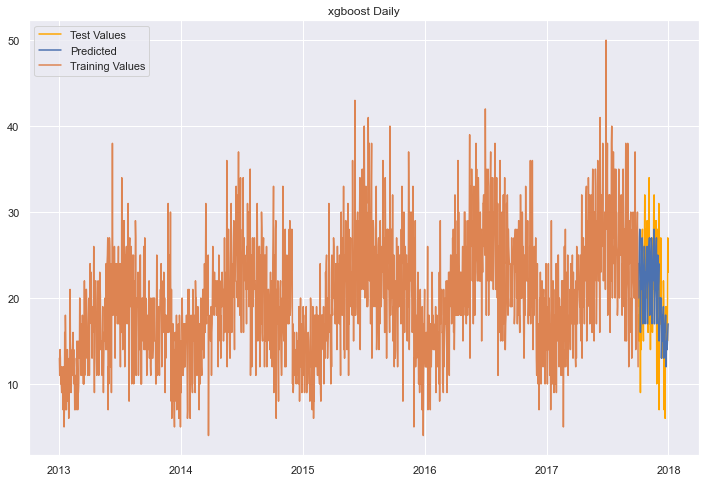

In [354]:
yhat = xgboost_forecast([1], [1], log=True, **xgboost_optimized_parameters)[0]
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost Daily")

Text(0.5, 1.0, 'xgboost')

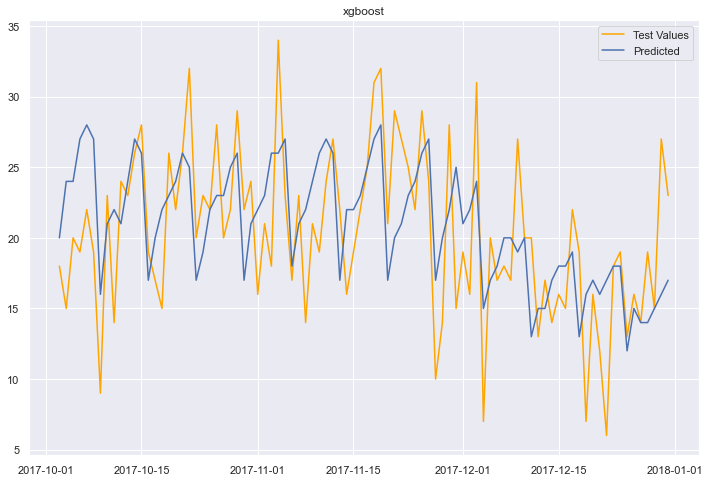

In [355]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("xgboost")

### xgboost Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost Future Forecast')

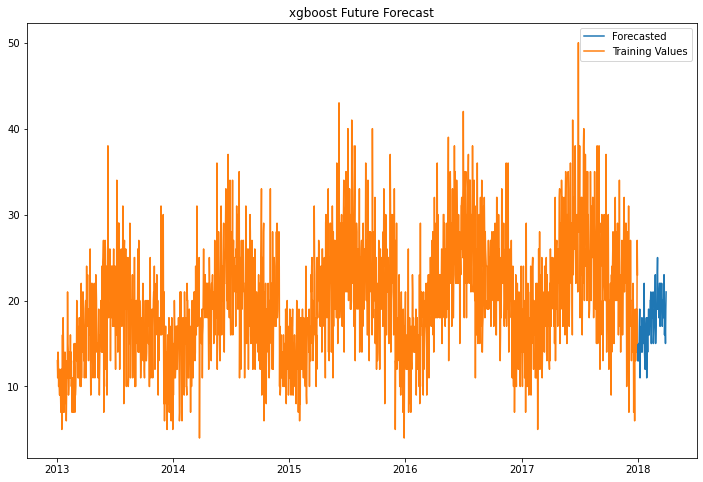

In [386]:
yhat = xgboost_forecast([1], [1], future=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost Future Forecast")

In [238]:
xgboost_future_df = xgboost_forecast(items=range(1, 6), future=True, **xgboost_optimized_parameters)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


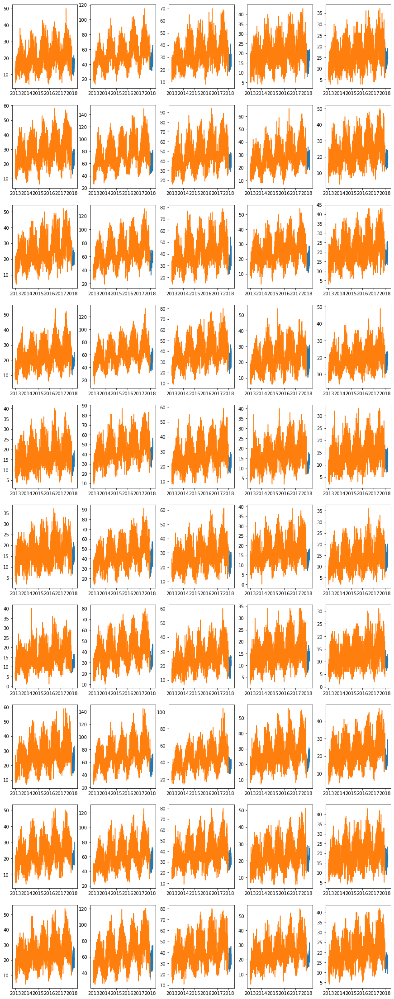

In [239]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset = df[df["item"] == (col + 1)]
        subset = subset[subset["store"] == (row + 1)]
        subset = subset[["sales"]]
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = xgboost_future_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

### xgboost Forecasted Values and Error

In [17]:
results_xgboost = xgboost_forecast(items=range(1, 3), log=True, **xgboost_optimized_parameters)
xgboost_forecast = results_xgboost[0]
xgboost_error = results_xgboost[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [18]:
xgboost_forecast

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-03,21.0,59.0,29.0,83.0,25.0,73.0,27.0,70.0,20.0,48.0,18.0,50.0,17.0,45.0,30.0,78.0,26.0,68.0,26.0,73.0
2017-10-04,24.0,61.0,29.0,84.0,27.0,70.0,26.0,73.0,20.0,51.0,18.0,51.0,17.0,49.0,32.0,76.0,27.0,71.0,25.0,76.0
2017-10-05,24.0,60.0,32.0,88.0,29.0,76.0,28.0,75.0,21.0,53.0,19.0,54.0,16.0,48.0,32.0,74.0,27.0,72.0,25.0,75.0
2017-10-06,25.0,62.0,32.0,86.0,28.0,79.0,28.0,75.0,20.0,56.0,19.0,54.0,17.0,48.0,30.0,81.0,28.0,72.0,26.0,78.0
2017-10-07,26.0,68.0,33.0,93.0,29.0,80.0,27.0,78.0,21.0,54.0,20.0,56.0,17.0,47.0,31.0,89.0,30.0,78.0,28.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,15.0,39.0,22.0,53.0,19.0,45.0,18.0,45.0,14.0,32.0,16.0,33.0,12.0,29.0,20.0,50.0,17.0,44.0,18.0,47.0
2017-12-28,15.0,39.0,23.0,53.0,19.0,45.0,18.0,47.0,14.0,32.0,16.0,34.0,12.0,29.0,21.0,51.0,17.0,44.0,18.0,47.0
2017-12-29,15.0,39.0,23.0,53.0,19.0,45.0,18.0,44.0,14.0,32.0,16.0,33.0,12.0,29.0,21.0,51.0,17.0,43.0,18.0,47.0


In [19]:
xgboost_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,4.122222,3.0,26.588889,5.156441,21.451446
1,8.944444,7.0,123.566667,11.116054,14.956675
2,5.822222,4.0,54.822222,7.404203,19.971434
3,11.611111,10.0,194.655556,13.951902,14.492492
4,4.766667,3.0,35.388889,5.948856,16.131556
5,10.455556,9.5,171.188889,13.083917,14.553888
6,4.955556,4.0,35.377778,5.947922,21.260963
7,8.311111,7.0,111.933333,10.579855,12.688522
8,3.611111,3.0,20.477778,4.525238,21.767112
9,7.188889,5.0,101.011111,10.050428,14.665273


Text(0, 0.5, 'Avg Values')

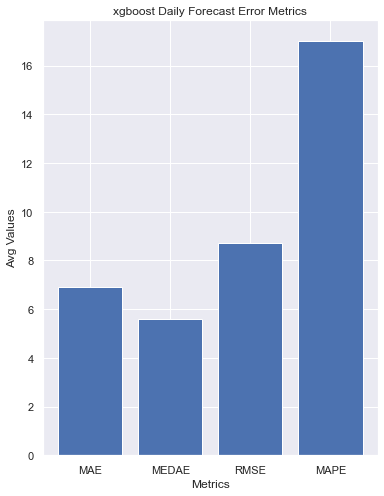

In [356]:
x_values = [x for x in xgboost_error.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(xgboost_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("xgboost Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### xgboost with optimized parameters

<BarContainer object of 4 artists>

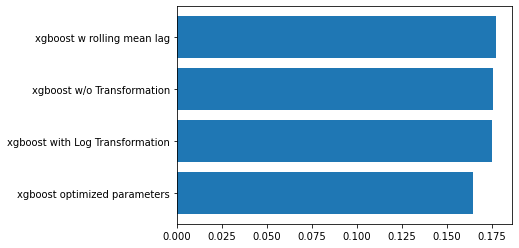

In [472]:
x = ["xgboost w/o Transformation", "xgboost with Log Transformation", "xgboost w rolling mean lag", "xgboost optimized parameters"]
y = [xgboost_error["MAPE"].mean(), xgboost_error_log["MAPE"].mean(), xgboost_error_lag["MAPE"].mean(), xgboost_error_optimized["MAPE"].mean()]
error_df = pd.DataFrame({"Models": x, "MAPE_avg": y})
error_df.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.barh(y=error_df["Models"], width=error_df["MAPE_avg"])

## xgboost Weekly Period Forecasting

### Weekly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost weekly')

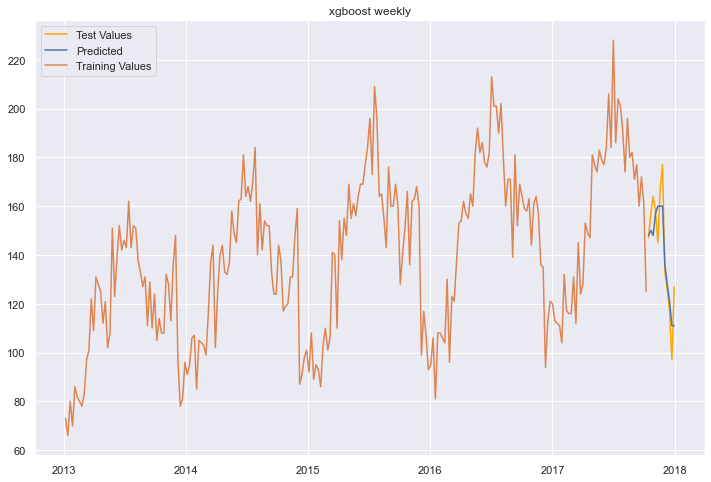

In [130]:
yhat = xgboost_forecast([1], [1], weekly=True, log=True, **xgboost_optimized_parameters_weekly)[0]
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost weekly")

### xgboost Weekly Forecasted Values and Error Metrics

In [131]:
results_xgboost_weekly = xgboost_forecast(items=range(1, 3), weekly=True, log=True, **xgboost_optimized_parameters_weekly)
xgboost_forecast_weekly = results_xgboost_weekly[0]
xgboost_error_weekly = results_xgboost_weekly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [132]:
xgboost_forecast_weekly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-15,148.0,410.0,231.0,613.0,189.0,537.0,202.0,525.0,135.0,358.0,135.0,348.0,119.0,345.0,228.0,569.0,187.0,496.0,206.0,532.0
2017-10-22,150.0,443.0,218.0,613.0,189.0,537.0,205.0,534.0,145.0,358.0,135.0,341.0,121.0,329.0,223.0,578.0,184.0,496.0,196.0,532.0
2017-10-29,148.0,433.0,231.0,585.0,179.0,488.0,205.0,501.0,135.0,358.0,135.0,331.0,123.0,329.0,223.0,578.0,175.0,496.0,203.0,532.0
2017-11-05,157.0,426.0,231.0,613.0,183.0,488.0,205.0,525.0,143.0,358.0,135.0,331.0,121.0,345.0,223.0,578.0,168.0,496.0,206.0,502.0
2017-11-12,160.0,417.0,231.0,613.0,183.0,488.0,205.0,534.0,135.0,358.0,135.0,331.0,109.0,345.0,223.0,578.0,168.0,496.0,206.0,532.0
2017-11-19,160.0,443.0,218.0,613.0,183.0,488.0,205.0,501.0,143.0,358.0,135.0,331.0,119.0,345.0,223.0,578.0,168.0,496.0,206.0,532.0
2017-11-26,160.0,459.0,231.0,613.0,183.0,488.0,205.0,525.0,135.0,358.0,135.0,331.0,121.0,345.0,223.0,578.0,155.0,496.0,206.0,532.0
2017-12-03,136.0,394.0,204.0,559.0,166.0,456.0,185.0,493.0,123.0,317.0,118.0,296.0,110.0,314.0,191.0,529.0,134.0,459.0,176.0,467.0
2017-12-10,128.0,373.0,204.0,534.0,158.0,456.0,180.0,455.0,113.0,317.0,113.0,296.0,108.0,314.0,191.0,521.0,121.0,459.0,164.0,486.0


In [133]:
xgboost_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,8.583333,8.0,117.750000,10.851267,6.038030
1,34.750000,32.0,1553.916667,39.419750,9.431423
2,16.666667,12.5,541.166667,23.262989,9.778827
3,29.833333,26.0,1324.833333,36.398260,6.015306
4,17.333333,18.0,371.333333,19.270011,9.293590
5,43.666667,49.5,2256.833333,47.506140,9.429374
6,25.000000,23.0,886.166667,29.768552,16.120317
7,51.916667,59.0,3860.083333,62.129569,12.761407
8,6.000000,4.0,82.500000,9.082951,4.975332
9,23.000000,17.0,777.833333,27.889664,7.367601


Text(0, 0.5, 'Avg Values')

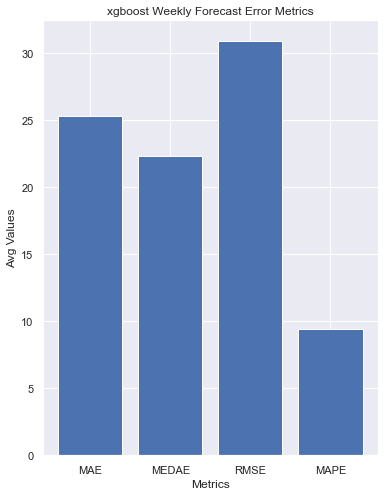

In [359]:
x_values = [x for x in xgboost_error_weekly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(xgboost_error_weekly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("xgboost Weekly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### xgboost Weekly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost Future Forecast')

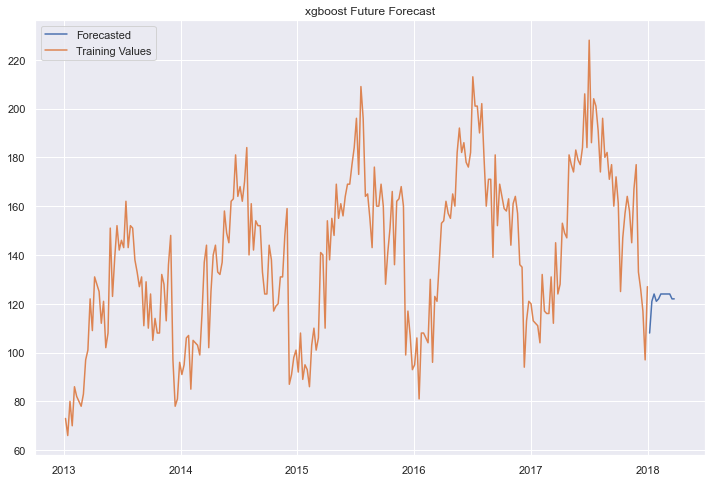

In [134]:
yhat = xgboost_forecast([1], [1], future=True, weekly=True, log=True, **xgboost_optimized_parameters_weekly)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost Future Forecast")

In [147]:
xgboost_future_df_weekly = xgboost_forecast(items=range(1, 6), future=True, weekly=True, 
                                            log=True, **xgboost_optimized_parameters_weekly)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


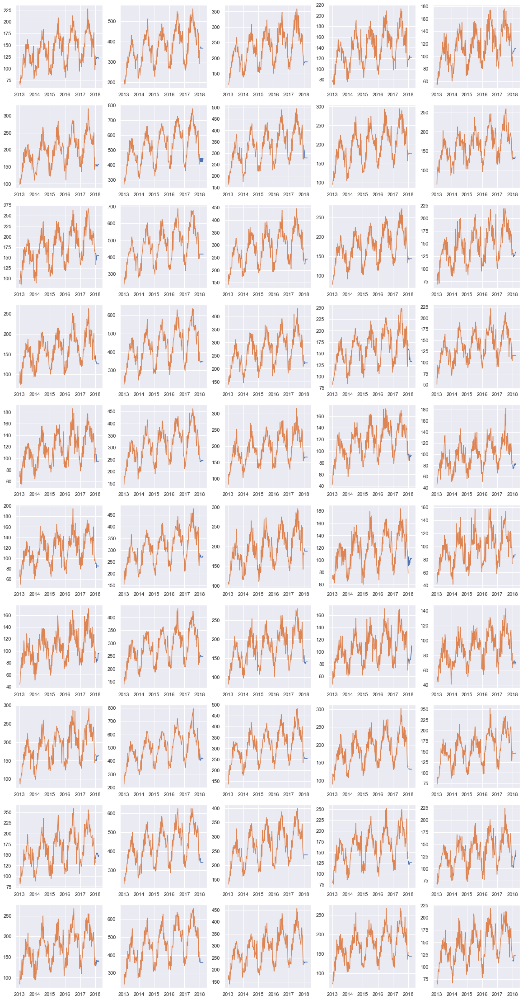

In [148]:
fig, axs = plt.subplots(10, 5, figsize=(20, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset, a, b = preprocess_weekly(row+1, col+1)
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = xgboost_future_df_weekly["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

## xgboost Monthly Period Forecasting

### Monthly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost Monthly')

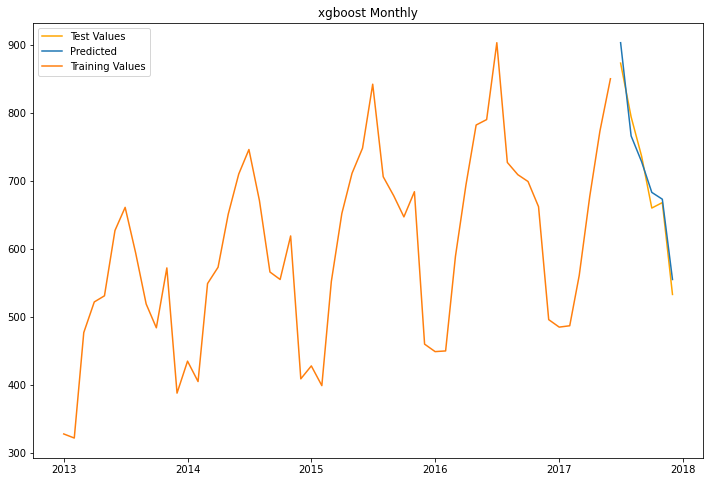

In [379]:
yhat = xgboost_forecast([1], [1], monthly=True)[0]
a, train, test = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost Monthly")

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("xgboost Monthly")

### xgboost Monthly Forecasted Values and Error Metrics

In [22]:
results_xgboost_monthly = xgboost_forecast(items=range(1, 3), monthly=True)
xgboost_forecast_monthly = results_xgboost_monthly[0]
xgboost_error_monthly = results_xgboost_monthly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [23]:
xgboost_forecast_monthly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-07-01,903.0,2387.0,1211.0,3153.0,1082.0,2909.0,1036.0,2682.0,691.0,1828.0,724.0,1866.0,659.0,1747.0,1083.0,3039.0,1085.0,2687.0,1136.0,2775.0
2017-08-01,766.0,2016.0,1073.0,3145.0,976.0,2630.0,833.0,2377.0,619.0,1660.0,606.0,1684.0,563.0,1477.0,1057.0,2723.0,845.0,2263.0,930.0,2616.0
2017-09-01,728.0,1960.0,998.0,2825.0,844.0,2433.0,807.0,2276.0,566.0,1552.0,560.0,1617.0,575.0,1455.0,1010.0,2600.0,761.0,2209.0,858.0,2424.0
2017-10-01,683.0,1938.0,870.0,2743.0,863.0,2344.0,810.0,2082.0,554.0,1542.0,568.0,1599.0,571.0,1475.0,901.0,2662.0,758.0,2132.0,911.0,2327.0
2017-11-01,673.0,1819.0,963.0,2578.0,849.0,2343.0,702.0,2331.0,568.0,1531.0,588.0,1588.0,551.0,1433.0,968.0,2627.0,806.0,2192.0,882.0,2383.0
2017-12-01,555.0,1588.0,838.0,1839.0,707.0,1966.0,737.0,1770.0,434.0,1366.0,588.0,1359.0,490.0,1142.0,822.0,2150.0,662.0,1811.0,780.0,1914.0


In [24]:
xgboost_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,19.333333,22.5,464.333333,21.548395,2.735127
1,95.500000,93.0,12717.500000,112.771894,5.325822
2,77.333333,81.0,8670.333333,93.114625,8.169883
3,161.166667,169.5,30139.166667,173.606355,6.012040
4,27.666667,25.0,1060.666667,32.567878,2.861434
5,80.500000,64.0,9228.833333,96.066817,3.745154
6,58.000000,45.5,4484.333333,66.965165,7.468721
7,74.166667,62.0,9452.166667,97.222254,3.528583
8,37.333333,37.0,1493.666667,38.647984,6.141012
9,101.500000,98.5,12628.833333,112.378082,6.486135


Text(0, 0.5, 'Avg Values')

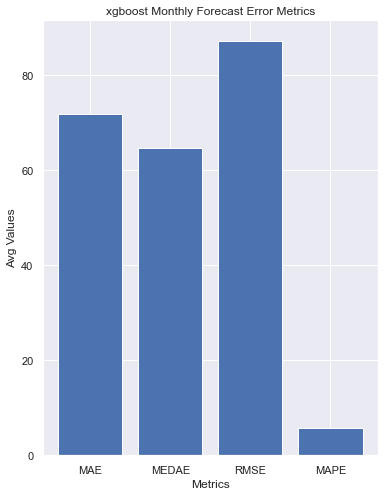

In [358]:
x_values = [x for x in xgboost_error_monthly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(xgboost_error_monthly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("xgboost Monthly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### xgboost Monthly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'xgboost Future Forecast')

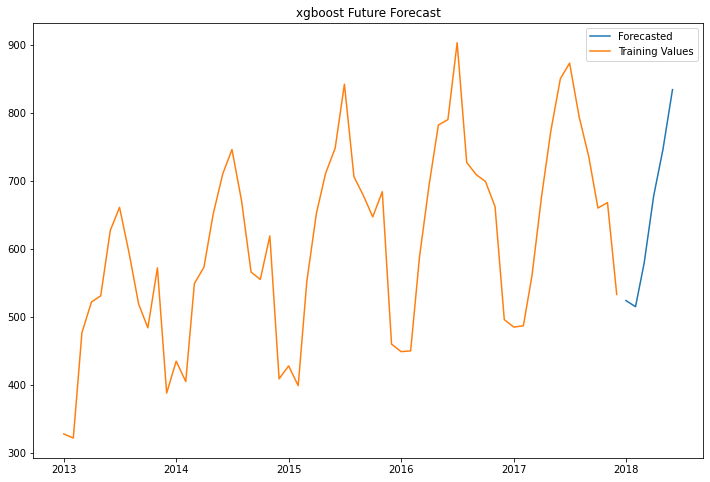

In [383]:
yhat = xgboost_forecast([1], [1], future=True, monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("xgboost Future Forecast")

In [145]:
xgboost_future_df_monthly = xgboost_forecast(items=range(1, 6), future=True, monthly=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


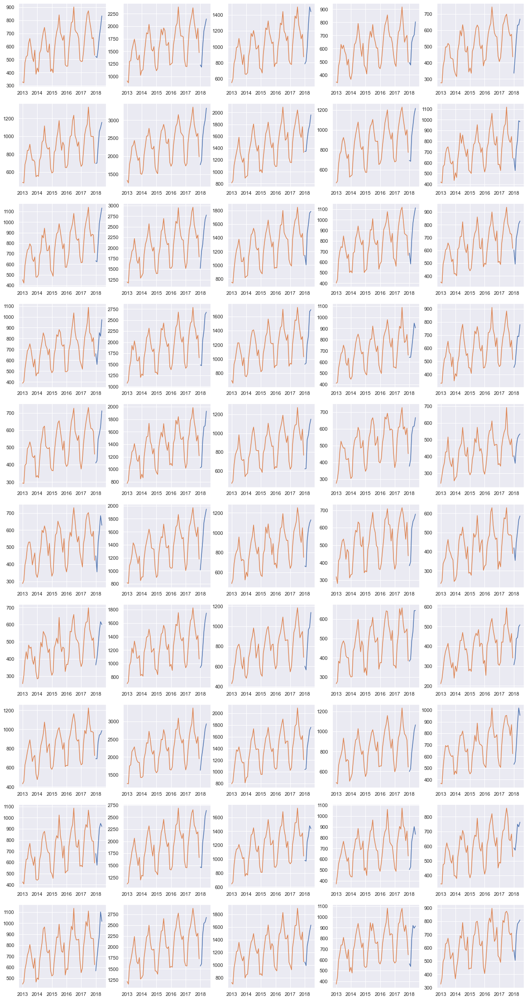

In [146]:
fig, axs = plt.subplots(10, 5, figsize=(20, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset, a, b = preprocess_monthly(row+1, col+1)
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = xgboost_future_df_monthly["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

### xgboost Feature Importance

In [390]:
xgboost_feature_df = xgboost_forecast([1], [1], log=True, features=True, 
                                      **xgboost_optimized_parameters)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<BarContainer object of 30 artists>

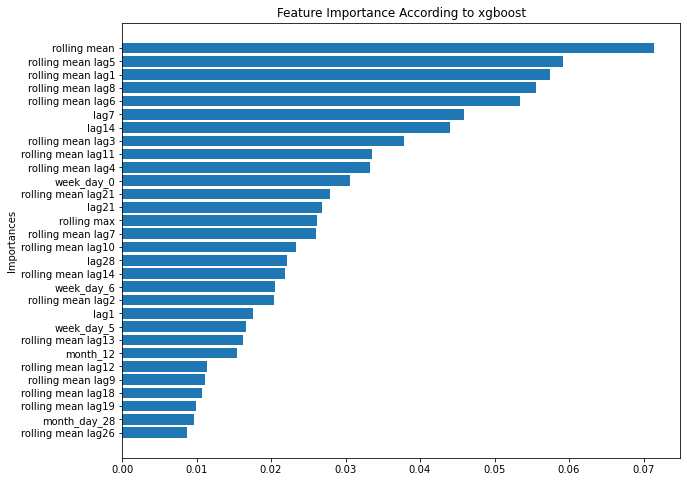

In [392]:
xgboost_feature_df.sort_values(by='coefs', ascending=True, inplace=True)
xgboost_feature_df = xgboost_feature_df.iloc[-30:, :]
plt.figure(figsize=(10, 8))
plt.title("Feature Importance According to xgboost")
plt.ylabel("Importances")
plt.barh(xgboost_feature_df["features"], xgboost_feature_df["coefs"])

# gluonTS Models

In [ ]:
def xgboost_forecast(stores=range(1, 11), items=range(1, 51), features=False, with_year=False, future=False, 
                     log=False, weekly=False, monthly=False, **args):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            if monthly:
                subset, d, e = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, d, e = preprocess_weekly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, d, e = preprocess(store, item, logged=True)
                else:
                    subset, f, g = preprocess(store, item, logged=False)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
                
            #Adding regressors and making test/train split
            if monthly:
                further_preprocess = regression_preprocess_monthly(subset, p=6)
            elif weekly:
                further_preprocess = regression_preprocess_weekly(subset, p=12)
            else:
                further_preprocess = regression_preprocess(subset, with_year=False, p=90)
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
        
            #Model + Prediction
            trained_model = xgb.XGBRegressor(**args).fit(
                finaldf_train_x, finaldf_train_y)
            
            if monthly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=True)
            elif weekly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, weekly=True)
            else:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=False)
            y_pred = pd.DataFrame(predicted_values)
            
            
            
            #Appending forecasted values and error metrics to respective dfs
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred["sales"]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred["sales"].round()
            
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.values).round(), 
                                                 np.exp(test_y.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), 
                                                 test_y.values)
                errors.append(error_dict)
            
            if features:
                #Feature Importance Matrix
                features = finaldf_train_x.columns
                coefs = trained_model.feature_importances_
                importance = pd.DataFrame({'features': features, 'coefs': coefs})
                return importance
                
   
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df
    
    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

In [149]:
def gluonts_forecast(stores=range(1, 11), items=range(1, 51), model="sff", future=False, log=False, monthly=False, weekly=True):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            if monthly:
                subset, train, test = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, train, test = preprocess_weekly(store, item, logged=True)
                else:
                    subset, train, test = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, train, test = preprocess(store, item, logged=True)
                else:
                    subset, train, test = preprocess(store, item, logged=False)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                    test_length=6
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                    test_length=12
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                    test_length = 90
                subset = subset.reindex(extended)
                end_point = len(subset)
                x = end_point - test_length
                train = subset.iloc[:x, :]
                test = subset.iloc[x:, :]
            
            fr = '1D'
            if monthly:
                fr = '1M'
            if weekly:
                fr = '1W'
            
            pred_length = 90
            if monthly:
                pred_length = 6
            if weekly:
                pred_length = 12
            
            #Preprocessing
            train_ds = ListDataset(
                [{'target': train['sales'], 'start': train.index[0]}],
                freq=fr
            )
            test_ds = ListDataset(
                [{'target': subset['sales'], 'start': train.index[0]}],
                freq=fr
            )
            
            #Model Training
            if model == 'sff':
                estimator = SimpleFeedForwardEstimator(
                    num_hidden_dimensions=[10],
                    prediction_length=pred_length,
                    context_length=100,
                    freq=fr,
                    trainer=Trainer(ctx="cpu", 
                                    epochs=3, 
                                    learning_rate=1e-3, 
                                    num_batches_per_epoch=100
                                   )
                )
                
            elif model == 'AR':
                estimator = DeepAREstimator(freq='1D', context_length=100,
                                           prediction_length=pred_length,
                                           num_layers=2,
                                           num_cells=40,
                                           cell_type='lstm',
                                           trainer=Trainer(epochs=3))
            elif model == "transformer":
                estimator = TransformerEstimator(freq='1D', 
                                                 prediction_length=pred_length, 
                                                 context_length=100,
                                                 trainer=Trainer(epochs=3))
                
            #Look at documentation for other models, try create_predictor
            predictor = estimator.train(train_ds)
            
            forecast_it, ts_it = make_evaluation_predictions(
                dataset=test_ds,  # test dataset
                predictor=predictor,  # predictor
                num_samples=100,  # number of sample paths we want for evaluation
            )
    
            forecasts = list(forecast_it)
            forecast_entry = forecasts[0]
                    
            y_pred = pd.DataFrame(forecast_entry.mean, index=test.index)
            
            
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred[0]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred[0].round()
    
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.values).round(), 
                                                 np.exp(test.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), test.values)
                errors.append(error_dict)


    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df
    
    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

## gluonTS Transformer

### gluonTS Transformer Visualizations

In [341]:
y_hat_transformer = gluonts_forecast([1], [1], model="transformer", log=False)

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:45<00:00,  1.10it/s, epoch=1/3, avg_epoch_loss=3.96]
INFO:gluonts.trainer:Epoch[0] Elapsed time 45.406 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=3.963923
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:45<00:00,  1.09it/s, epoch=2/3, avg_epoch_loss=3.39]
INFO:gluonts.trainer:Epoch[1] Elapsed time 45.710 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=3.385600
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:45<00:00,  1.10it/s, epoch=3/3, avg_epoch_loss=3.18]
INFO:gluonts.trainer:Epoch[2] Elapsed time 45.552 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=3.180334
INFO:root:Computing averaged parameters.
INFO:root:Load

Text(0.5, 1.0, 'Transformer')

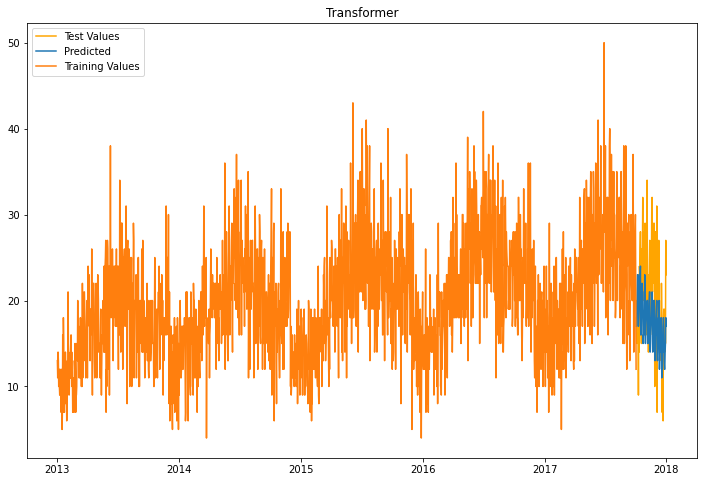

In [342]:
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_transformer[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer")

Text(0.5, 1.0, 'Transformer')

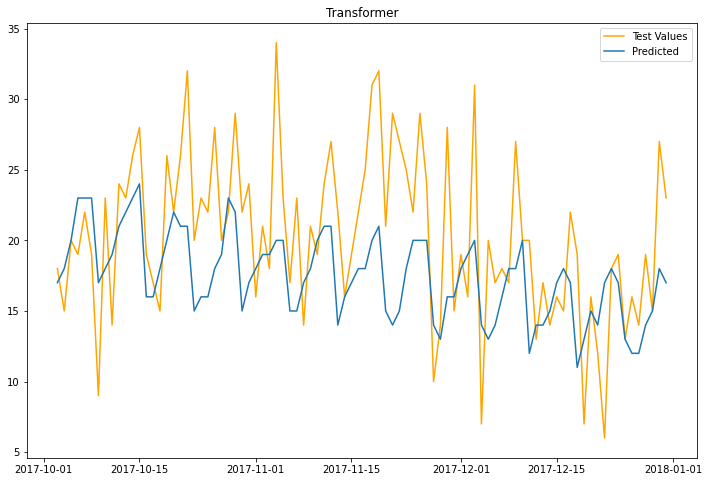

In [343]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_transformer[0], label="Predicted")
plt.legend()
plt.title("Transformer")

### gluonTS Transformer Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.20it/s, epoch=1/3, avg_epoch_loss=3.73]
INFO:gluonts.trainer:Epoch[0] Elapsed time 41.751 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=3.728504
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:42<00:00,  1.19it/s, epoch=2/3, avg_epoch_loss=3.25]
INFO:gluonts.trainer:Epoch[1] Elapsed time 42.048 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=3.254475
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.19it/s, epoch=3/3, avg_epoch_loss=3.09]
INFO:gluonts.trainer:Epoch[2] Elapsed time 41.926 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=3.086204
INFO:root:Computing averaged parameters.
INFO:root:Load

Text(0.5, 1.0, 'Transformer Future Forecast')

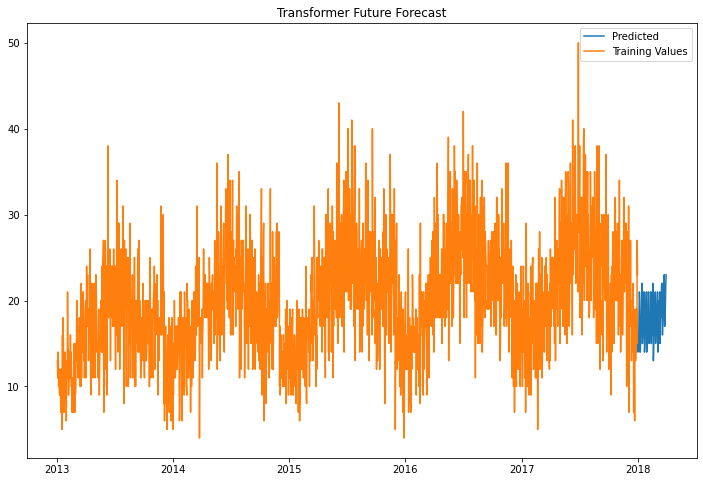

In [412]:
future_transformer = gluonts_forecast([1], [1], model="transformer", future=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(future_transformer, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer Future Forecast")

### gluonTS Transformer Forecasted Values and Error Metrics

In [26]:
results_transformer = gluonts_forecast(items=[1], model="transformer", log=False)
transformer_forecast = results_transformer[0]
transformer_error = results_transformer[1]

100%|██████████████████████████████████████████████████| 50/50 [00:24<00:00,  2.06it/s, epoch=3/3, avg_epoch_loss=3.35]


In [27]:
transformer_forecast

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-03,16.0,25.0,23.0,24.0,16.0,18.0,14.0,28.0,22.0,26.0
2017-10-04,18.0,26.0,25.0,25.0,18.0,17.0,15.0,28.0,24.0,26.0
2017-10-05,21.0,26.0,28.0,29.0,19.0,18.0,13.0,29.0,28.0,24.0
2017-10-06,24.0,32.0,30.0,27.0,21.0,21.0,15.0,32.0,28.0,27.0
2017-10-07,26.0,35.0,31.0,29.0,22.0,21.0,18.0,33.0,32.0,31.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,10.0,17.0,23.0,19.0,17.0,15.0,14.0,26.0,20.0,21.0
2017-12-28,11.0,21.0,25.0,22.0,19.0,16.0,14.0,27.0,23.0,22.0
2017-12-29,15.0,22.0,26.0,22.0,20.0,17.0,16.0,28.0,24.0,22.0


In [28]:
transformer_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,4.811111,4.0,36.344444,6.028635,24.411064
1,6.288889,5.0,64.622222,8.038795,21.146638
2,4.022222,3.0,25.377778,5.037636,15.856358
3,4.488889,4.0,30.466667,5.519662,21.202115
4,4.011111,3.0,23.944444,4.893306,28.970110
5,3.688889,3.0,20.644444,4.543616,27.904352
6,3.344444,3.0,19.255556,4.388115,23.422519
7,5.100000,4.0,41.255556,6.423049,19.986324
8,4.022222,3.0,26.400000,5.138093,19.497405
9,4.011111,3.0,24.900000,4.989990,17.853259


In [399]:
transformer_forecast

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-03,20.0,26.0,22.0,26.0,15.0,17.0,14.0,24.0,20.0,26.0
2017-10-04,21.0,26.0,27.0,29.0,19.0,17.0,15.0,27.0,20.0,24.0
2017-10-05,22.0,31.0,27.0,28.0,19.0,20.0,16.0,26.0,25.0,24.0
2017-10-06,25.0,35.0,30.0,28.0,20.0,20.0,18.0,27.0,25.0,28.0
2017-10-07,27.0,36.0,31.0,31.0,20.0,21.0,19.0,29.0,26.0,26.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,18.0,23.0,22.0,23.0,10.0,16.0,13.0,17.0,15.0,17.0
2017-12-28,20.0,24.0,22.0,24.0,13.0,17.0,12.0,16.0,16.0,20.0
2017-12-29,22.0,25.0,23.0,24.0,14.0,17.0,15.0,19.0,19.0,19.0


## gluonTS Transformer Weekly Forecast

### Weekly Forecast Visualizations

100%|██████████████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s, epoch=3/3, avg_epoch_loss=4.58]


Text(0.5, 1.0, 'Transformer Weekly')

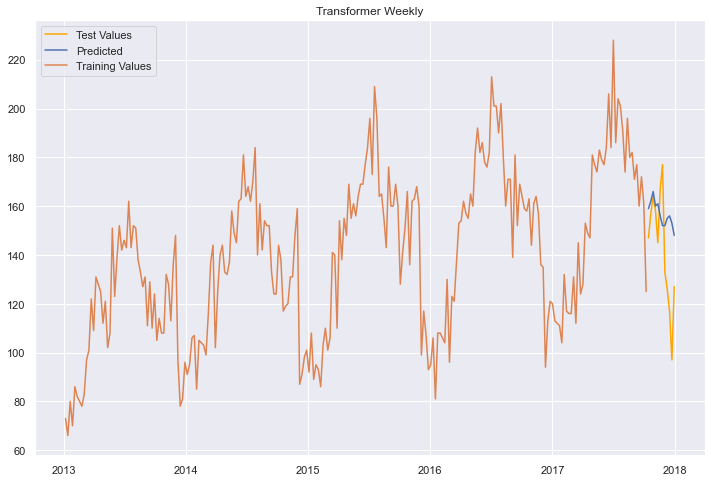

In [153]:
y_hat_transformer_weekly = gluonts_forecast([1], [1], model="transformer", weekly=True)
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_transformer_weekly[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer Weekly")

### Weekly Forecasted Values and Error Metrics

In [154]:
results_transformer_weekly = gluonts_forecast(items=range(1, 2), model="transformer", weekly=True)
transformer_forecast_weekly = results_transformer_weekly[0]
transformer_error_weekly = results_transformer_weekly[1]

100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s, epoch=3/3, avg_epoch_loss=4.84]


In [284]:
transformer_forecast_weekly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-15,156.0,248.0,215.0,189.0,150.0,134.0,125.0,230.0,184.0,187.0
2017-10-22,161.0,246.0,209.0,189.0,154.0,132.0,121.0,226.0,184.0,202.0
2017-10-29,157.0,236.0,211.0,179.0,152.0,130.0,118.0,221.0,185.0,186.0
2017-11-05,151.0,253.0,207.0,177.0,152.0,132.0,117.0,213.0,182.0,187.0
2017-11-12,152.0,249.0,204.0,172.0,155.0,127.0,118.0,216.0,186.0,185.0
2017-11-19,151.0,240.0,199.0,167.0,148.0,125.0,121.0,221.0,184.0,178.0
2017-11-26,148.0,244.0,199.0,169.0,151.0,128.0,119.0,214.0,186.0,177.0
2017-12-03,144.0,234.0,192.0,169.0,147.0,124.0,117.0,220.0,177.0,172.0
2017-12-10,147.0,249.0,191.0,164.0,152.0,125.0,115.0,215.0,173.0,176.0


In [285]:
transformer_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,17.666667,13.5,487.333333,22.075628,13.924241
1,45.500000,32.0,3537.166667,59.474084,27.133833
2,18.000000,10.0,575.833333,23.996528,10.996472
3,15.583333,12.5,378.083333,19.444365,9.939271
4,27.083333,23.5,1006.583333,31.726697,24.101462
5,18.333333,19.0,486.333333,22.052967,17.019268
6,13.750000,10.5,261.083333,16.158073,13.988843
7,26.833333,21.0,1119.000000,33.451457,15.425542
8,22.083333,12.5,820.916667,28.651643,15.573988
9,19.250000,14.0,569.250000,23.858961,12.340515


### Weekly Future Forecast

100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s, epoch=3/3, avg_epoch_loss=4.61]


Text(0.5, 1.0, 'Transformer Weekly Future Forecast')

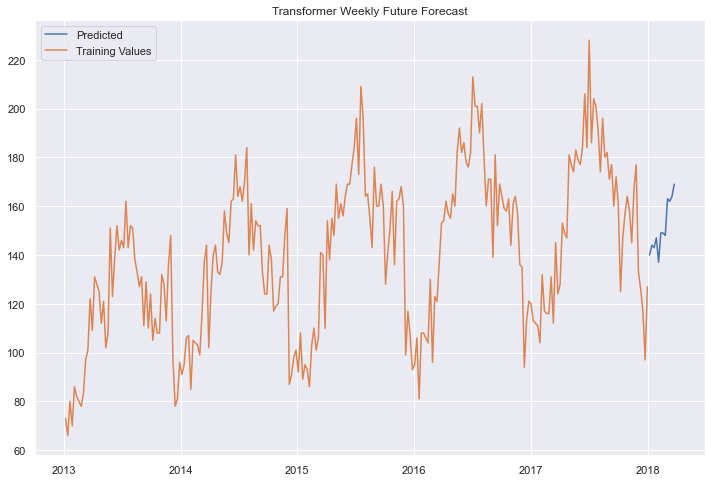

In [155]:
future_transformer_weekly = gluonts_forecast([1], [1], 
                                              model="transformer", 
                                              future=True,
                                             weekly=True)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_transformer_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer Weekly Future Forecast")

## gluonTS Transformer Monthly Forecast

### Monthly Forecast Visualizations

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 79.05it/s, epoch=1/3, avg_epoch_loss=8.49]
INFO:gluonts.trainer:Epoch[0] Elapsed time 1.268 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=8.485994
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 74.72it/s, epoch=2/3, avg_epoch_loss=6.46]
INFO:gluonts.trainer:Epoch[1] Elapsed time 1.341 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=6.456594
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|█████████████████████████████████████████████████| 100/100 [00:01<00:00, 75.50it/s, epoch=3/3, avg_epoch_loss=6.2]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.327 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=6.198917
INFO:root:Computing averaged parameters.
INFO:root:Loading

Text(0.5, 1.0, 'Transformer Monthly')

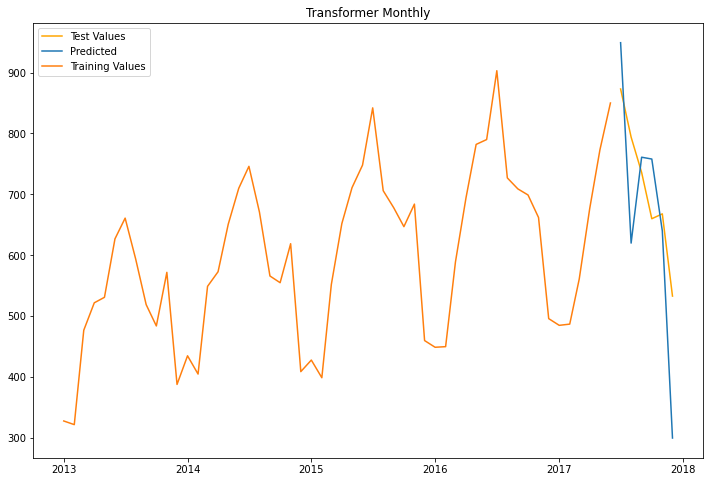

In [400]:
y_hat_transformer = gluonts_forecast([1], [1], monthly=True)
a, train, test = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_transformer[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer Monthly")

### Monthly Forecasted Values and Error Metrics

In [29]:
results_transformer_monthly = gluonts_forecast(items=range(1, 2), model="transformer", monthly=True)
transformer_forecast_monthly = results_transformer_monthly[0]
transformer_error_monthly = results_transformer_monthly[1]

100%|██████████████████████████████████████████████████| 50/50 [00:09<00:00,  5.02it/s, epoch=3/3, avg_epoch_loss=6.54]


In [30]:
transformer_forecast_monthly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-07-01,779.0,1210.0,1069.0,940.0,718.0,627.0,608.0,1050.0,1010.0,1072.0
2017-08-01,791.0,1225.0,1087.0,991.0,742.0,670.0,601.0,1103.0,978.0,1088.0
2017-09-01,747.0,1194.0,1026.0,946.0,687.0,628.0,602.0,1044.0,949.0,1062.0
2017-10-01,707.0,1096.0,992.0,900.0,654.0,573.0,581.0,1025.0,868.0,980.0
2017-11-01,670.0,1049.0,927.0,836.0,623.0,519.0,546.0,988.0,825.0,964.0
2017-12-01,635.0,962.0,880.0,782.0,600.0,517.0,541.0,971.0,810.0,933.0


In [31]:
transformer_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,43.166667,29.0,3597.166667,59.976384,6.532907
1,137.833333,110.5,23844.833333,154.417724,14.997829
2,117.666667,126.5,15906.000000,126.118991,13.705382
3,116.333333,133.0,15237.666667,123.440944,14.337957
4,65.666667,61.5,6059.333333,77.841720,11.801232
5,55.000000,61.5,3870.333333,62.212003,9.997557
6,68.666667,67.5,6216.666667,78.845841,13.626329
7,99.666667,58.0,16579.666667,128.762054,10.994196
8,85.666667,67.0,11662.000000,107.990740,11.845736
9,152.000000,131.0,30309.333333,174.095759,19.515097


### Monthly Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:18<00:00,  2.68it/s, epoch=1/3, avg_epoch_loss=7.53]
INFO:gluonts.trainer:Epoch[0] Elapsed time 18.685 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=7.534565
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:18<00:00,  2.67it/s, epoch=2/3, avg_epoch_loss=6.73]
INFO:gluonts.trainer:Epoch[1] Elapsed time 18.759 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=6.729444
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|███████████████████████████████████████████████| 50/50 [3:17:17<00:00, 236.74s/it, epoch=3/3, avg_epoch_loss=6.45]
INFO:gluonts.trainer:Epoch[2] Elapsed time 11837.158 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=6.446638
INFO:root:Computing averaged parameters.
INFO:root:L

Text(0.5, 1.0, 'Transformer Future Forecast')

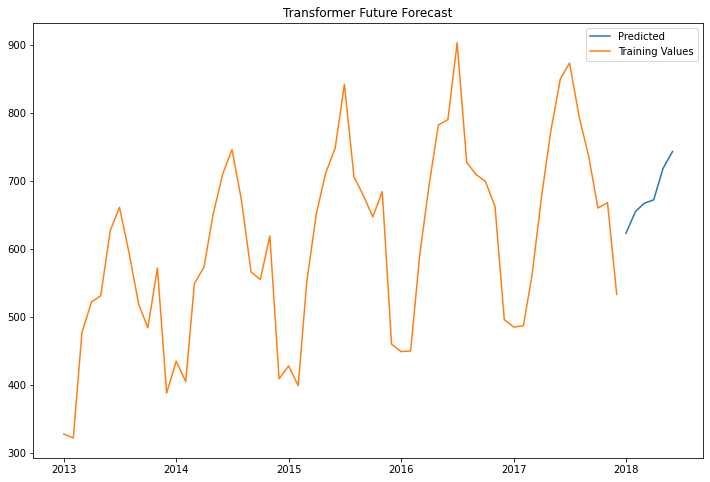

In [403]:
future_transformer_monthly = gluonts_forecast([1], [1], 
                                              model="transformer", 
                                              future=True,
                                             monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_transformer_monthly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Transformer Future Forecast")

## gluonTS DeepAR

### gluonTS DeepAR Visualizations

In [361]:
y_hat_ar = gluonts_forecast([1], [1], model="AR", log=False)

100%|██████████████████████████████████████████████████| 50/50 [00:32<00:00,  1.54it/s, epoch=3/3, avg_epoch_loss=4.14]


Text(0.5, 1.0, 'deepAR Daily Forecast')

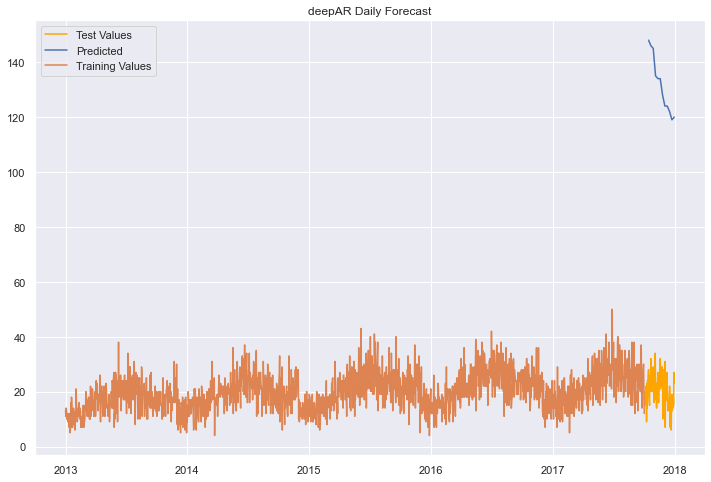

In [362]:
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_ar[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR Daily Forecast")

Text(0.5, 1.0, 'deepAR Daily Forecast')

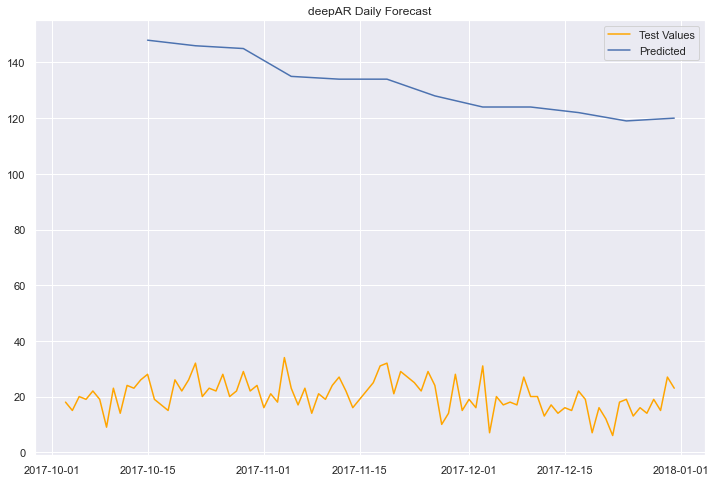

In [363]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_ar[0], label="Predicted")
plt.legend()
plt.title("deepAR Daily Forecast")

### deepAR Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [01:05<00:00,  1.31s/it, epoch=1/3, avg_epoch_loss=3.48]
INFO:gluonts.trainer:Epoch[0] Elapsed time 65.429 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=3.479053
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [01:01<00:00,  1.23s/it, epoch=2/3, avg_epoch_loss=3.02]
INFO:gluonts.trainer:Epoch[1] Elapsed time 61.314 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=3.019360
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [01:00<00:00,  1.20s/it, epoch=3/3, avg_epoch_loss=2.97]
INFO:gluonts.trainer:Epoch[2] Elapsed time 60.046 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=2.969196
INFO:root:Computing averaged parameters.
INFO:root:Load

Text(0.5, 1.0, 'deepAR Future Forecast')

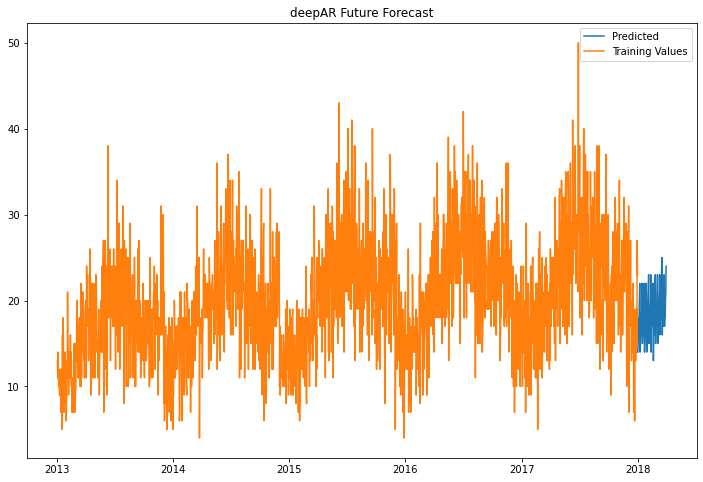

In [407]:
future_deepAR = gluonts_forecast([1], [1], model="AR", future=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(future_deepAR, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR Future Forecast")

### deepAR Forecasted Values and Error Metrics

In [32]:
results_deepAR = gluonts_forecast(items=[1], model="AR", log=False)
deepAR_forecast = results_deepAR[0]
deepAR_error = results_deepAR[1]

100%|███████████████████████████████████████████████████| 50/50 [00:10<00:00,  4.58it/s, epoch=3/3, avg_epoch_loss=3.1]


In [33]:
deepAR_forecast

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-03,20.0,25.0,24.0,24.0,17.0,16.0,15.0,28.0,23.0,24.0
2017-10-04,19.0,29.0,26.0,24.0,18.0,16.0,17.0,30.0,24.0,25.0
2017-10-05,23.0,32.0,28.0,28.0,20.0,18.0,16.0,30.0,27.0,26.0
2017-10-06,23.0,35.0,28.0,27.0,21.0,19.0,17.0,32.0,29.0,29.0
2017-10-07,26.0,36.0,32.0,30.0,21.0,20.0,19.0,32.0,30.0,32.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,17.0,24.0,19.0,17.0,9.0,15.0,11.0,22.0,19.0,21.0
2017-12-28,18.0,27.0,22.0,19.0,10.0,16.0,13.0,22.0,20.0,21.0
2017-12-29,20.0,28.0,23.0,19.0,12.0,18.0,15.0,26.0,22.0,23.0


In [34]:
deepAR_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,3.955556,4.0,22.711111,4.765618,23.915495
1,5.522222,4.5,46.677778,6.832114,21.237101
2,3.888889,3.0,23.933333,4.892171,14.762858
3,4.255556,4.0,28.055556,5.296750,19.111531
4,4.055556,4.0,25.144444,5.014424,23.385735
5,3.744444,3.0,22.788889,4.773771,28.194894
6,3.211111,3.0,17.766667,4.215052,22.236229
7,4.811111,3.0,41.522222,6.443774,16.535712
8,3.588889,2.5,22.744444,4.769114,16.286860
9,3.922222,4.0,23.833333,4.881940,17.401955


Text(0, 0.5, 'Avg Values')

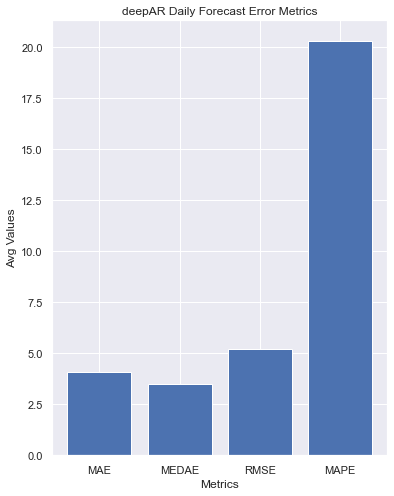

In [364]:
x_values = [x for x in deepAR_error.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(deepAR_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("deepAR Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

## gluonTS deepAR Weekly Forecast

### Weekly Visualizations

100%|███████████████████████████████████████████████████| 50/50 [00:32<00:00,  1.55it/s, epoch=3/3, avg_epoch_loss=4.1]


Text(0.5, 1.0, 'deepAR Weekly Forecast')

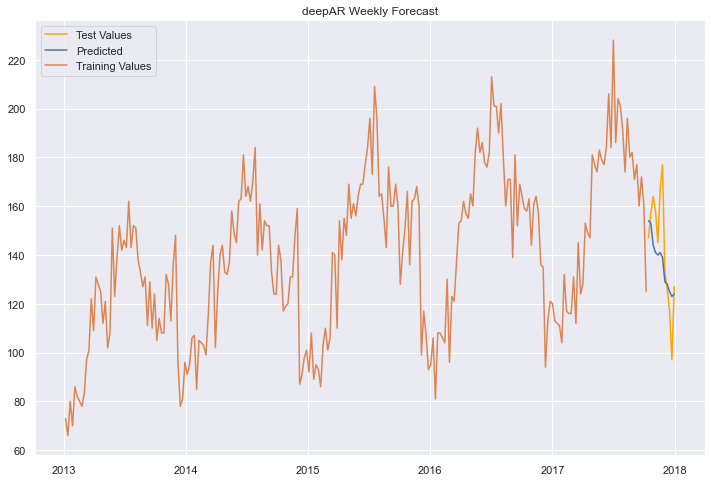

In [159]:
y_hat_ar_weekly = gluonts_forecast([1], [1], model="AR", weekly=True)
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_ar_weekly[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR Weekly Forecast")

### Weekly Forecasted Values and Error Metrics

In [160]:
results_deepAR_weekly = gluonts_forecast(items=[1], model="AR", weekly=True)
deepAR_forecast_weekly = results_deepAR_weekly[0]
deepAR_error_weekly = results_deepAR_weekly[1]

100%|███████████████████████████████████████████████████| 50/50 [00:30<00:00,  1.63it/s, epoch=3/3, avg_epoch_loss=4.3]


In [161]:
deepAR_forecast_weekly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-15,152.0,206.0,187.0,179.0,135.0,124.0,116.0,208.0,178.0,192.0
2017-10-22,148.0,204.0,184.0,168.0,130.0,127.0,114.0,216.0,169.0,181.0
2017-10-29,141.0,192.0,185.0,167.0,129.0,123.0,111.0,208.0,169.0,181.0
2017-11-05,131.0,200.0,172.0,157.0,130.0,118.0,109.0,203.0,163.0,181.0
2017-11-12,130.0,184.0,171.0,152.0,126.0,116.0,105.0,208.0,159.0,179.0
2017-11-19,125.0,180.0,165.0,144.0,120.0,112.0,103.0,197.0,154.0,173.0
2017-11-26,121.0,176.0,164.0,139.0,119.0,115.0,99.0,191.0,156.0,160.0
2017-12-03,108.0,182.0,153.0,129.0,116.0,113.0,96.0,194.0,152.0,159.0
2017-12-10,108.0,169.0,145.0,127.0,112.0,114.0,100.0,199.0,151.0,155.0


In [162]:
deepAR_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,22.166667,20.5,728.166667,26.984563,14.790880
1,27.916667,24.0,1138.583333,33.742900,13.129176
2,24.333333,22.0,746.166667,27.316051,12.714246
3,28.583333,29.0,1038.750000,32.229645,17.389503
4,9.833333,9.5,144.000000,12.000000,7.983084
5,17.500000,16.5,421.666667,20.534524,14.511881
6,12.500000,12.0,233.833333,15.291610,11.175952
7,23.250000,22.5,725.750000,26.939748,12.170773
8,15.833333,16.5,354.666667,18.832596,9.988723
9,15.416667,11.5,348.583333,18.670387,8.788431


Text(0, 0.5, 'Avg Values')

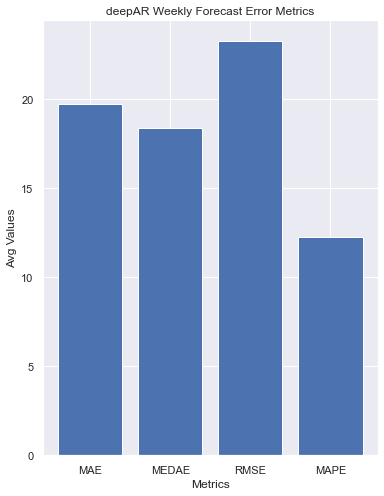

In [365]:
x_values = [x for x in deepAR_error_weekly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(deepAR_error_weekly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("deepAR Weekly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Weekly Future Forecast

100%|██████████████████████████████████████████████████| 50/50 [00:29<00:00,  1.72it/s, epoch=3/3, avg_epoch_loss=4.12]


Text(0.5, 1.0, 'deepAR Future Forecast Weekly')

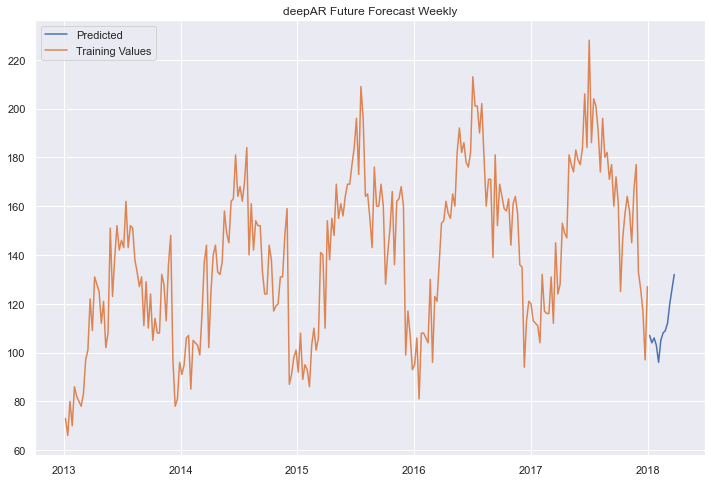

In [163]:
future_deepAR_weekly = gluonts_forecast([1], [1], model="AR", future=True, 
                                         weekly=True)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_deepAR_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR Future Forecast Weekly")

## gluonTS deepAR Monthly Forecast

### Visualizations

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s, epoch=1/3, avg_epoch_loss=6.38]
INFO:gluonts.trainer:Epoch[0] Elapsed time 13.362 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=6.378947
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s, epoch=2/3, avg_epoch_loss=5.63]
INFO:gluonts.trainer:Epoch[1] Elapsed time 12.448 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=5.627000
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s, epoch=3/3, avg_epoch_loss=5.35]
INFO:gluonts.trainer:Epoch[2] Elapsed time 12.388 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=5.351548
INFO:root:Computing averaged parameters.
INFO:root:Load

Text(0.5, 1.0, 'deepAR')

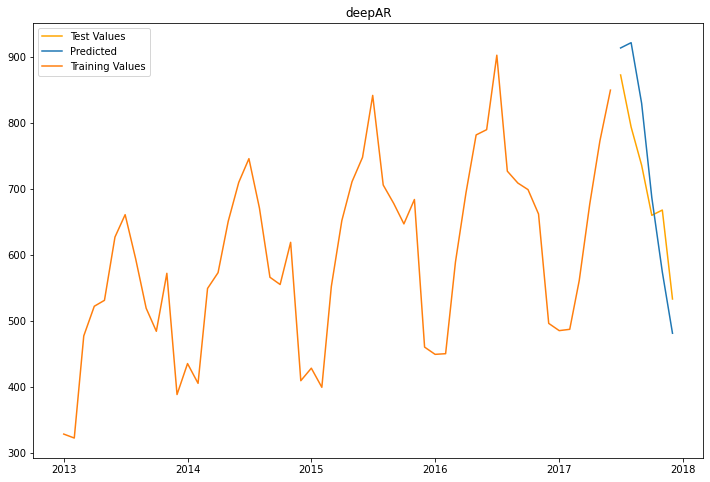

In [336]:
y_hat_ar = gluonts_forecast([1], [1], model="AR", monthly=True)
a, train, test = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_ar[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR")

### Monthly Forecasted Values and Error Metrics

In [35]:
results_deepAR_monthly = gluonts_forecast(items=[1], model="AR", monthly=True)
deepAR_forecast_monthly = results_deepAR_monthly[0]
deepAR_error_monthly = results_deepAR_monthly[1]

100%|██████████████████████████████████████████████████| 50/50 [00:06<00:00,  7.23it/s, epoch=3/3, avg_epoch_loss=5.64]


In [36]:
deepAR_forecast_monthly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-07-01,882.0,1202.0,1072.0,1046.0,730.0,730.0,631.0,1167.0,952.0,1026.0
2017-08-01,870.0,1185.0,1079.0,1030.0,700.0,718.0,597.0,1185.0,921.0,1034.0
2017-09-01,780.0,1103.0,988.0,974.0,616.0,663.0,553.0,1068.0,778.0,964.0
2017-10-01,656.0,902.0,827.0,870.0,516.0,551.0,467.0,933.0,649.0,799.0
2017-11-01,568.0,814.0,732.0,792.0,443.0,466.0,396.0,851.0,565.0,690.0
2017-12-01,480.0,738.0,651.0,703.0,370.0,417.0,371.0,788.0,546.0,618.0


In [37]:
deepAR_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,47.666667,48.5,3436.333333,58.620247,7.016802
1,101.500000,99.5,12393.166667,111.324600,9.809647
2,98.333333,96.0,11098.000000,105.347046,11.011284
3,89.666667,83.5,11062.000000,105.176043,11.064699
4,64.500000,69.0,6915.166667,83.157481,11.414057
5,55.500000,52.0,4987.500000,70.622234,9.216798
6,50.666667,37.0,4014.333333,63.358767,9.422566
7,82.833333,77.0,7801.166667,88.324213,8.500975
8,104.833333,87.0,15111.166667,122.927485,12.753416
9,85.000000,87.0,9619.333333,98.078200,9.380797


Text(0, 0.5, 'Avg Values')

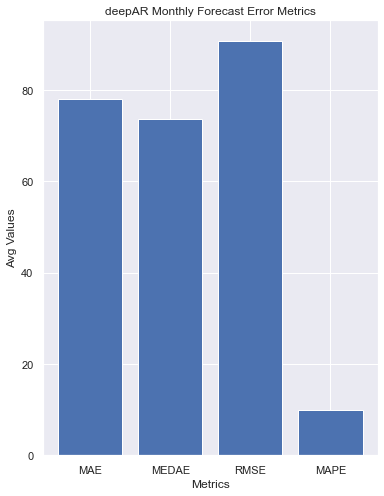

In [366]:
x_values = [x for x in deepAR_error_monthly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(deepAR_error_monthly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("deepAR Monthly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Monthly Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s, epoch=1/3, avg_epoch_loss=6.73]
INFO:gluonts.trainer:Epoch[0] Elapsed time 13.144 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=6.733824
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s, epoch=2/3, avg_epoch_loss=5.85]
INFO:gluonts.trainer:Epoch[1] Elapsed time 12.409 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=5.854935
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████████| 50/50 [00:12<00:00,  4.11it/s, epoch=3/3, avg_epoch_loss=5.55]
INFO:gluonts.trainer:Epoch[2] Elapsed time 12.171 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=5.547229
INFO:root:Computing averaged parameters.
INFO:root:Load

Text(0.5, 1.0, 'deepAR Future Forecast Monthly')

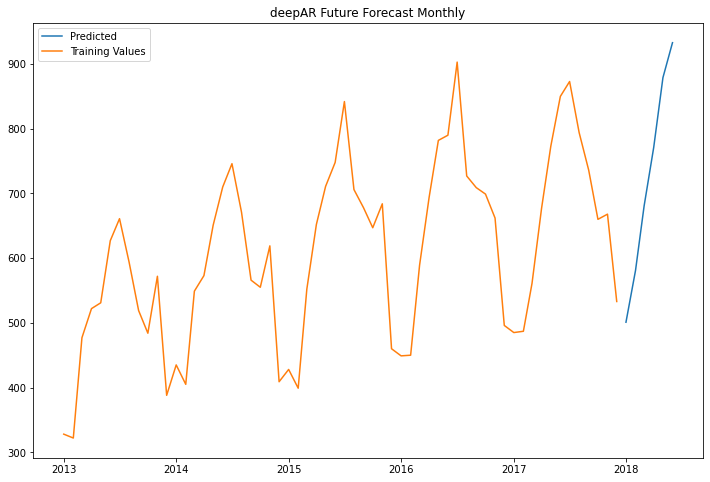

In [340]:
future_deepAR_monthly = gluonts_forecast([1], [1], model="AR", future=True, 
                                         monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_deepAR_monthly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("deepAR Future Forecast Monthly")

## gluonTS Simple Feed Forward

### gluonTS SFF Visualizations

In [274]:
yhat = gluonts_forecast([1], [1], model="sff", log=False)[0]

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 58.03it/s, epoch=1/3, avg_epoch_loss=3.63]
INFO:gluonts.trainer:Epoch[0] Elapsed time 1.729 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=3.631429
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 72.24it/s, epoch=2/3, avg_epoch_loss=3.37]
INFO:gluonts.trainer:Epoch[1] Elapsed time 1.386 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=3.370384
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 73.73it/s, epoch=3/3, avg_epoch_loss=3.32]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.359 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=3.315509
INFO:root:Computing averaged parameters.
INFO:root:Loading

Text(0.5, 1.0, 'SimpleFeedForward')

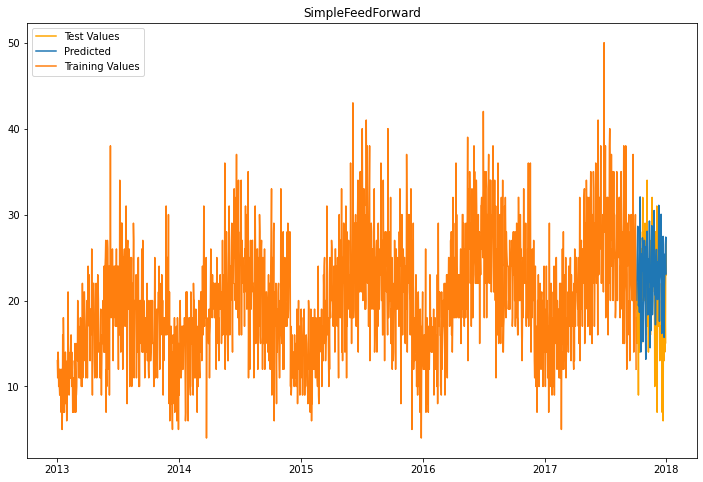

In [275]:
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("SimpleFeedForward")

Text(0.5, 1.0, 'SimpleFeedForward')

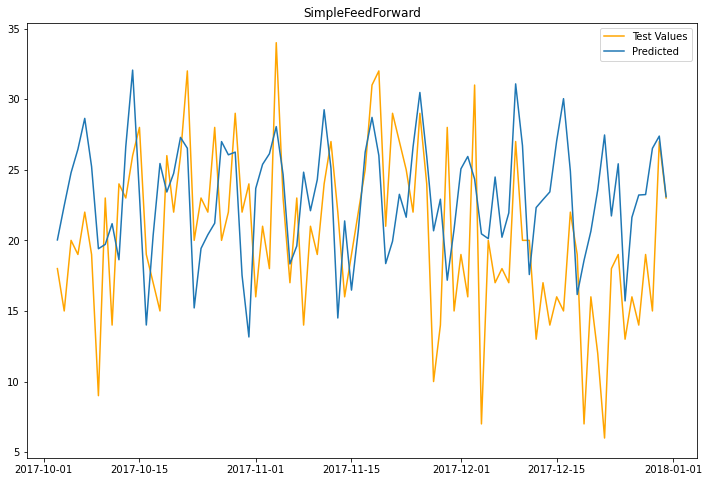

In [276]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("SimpleFeedForward")

### SFF Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|█████████████████████████████████████████████████| 100/100 [00:01<00:00, 75.29it/s, epoch=1/3, avg_epoch_loss=3.6]
INFO:gluonts.trainer:Epoch[0] Elapsed time 1.330 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=3.596573
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 73.94it/s, epoch=2/3, avg_epoch_loss=3.37]
INFO:gluonts.trainer:Epoch[1] Elapsed time 1.355 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=3.373403
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 72.87it/s, epoch=3/3, avg_epoch_loss=3.31]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.375 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=3.309249
INFO:root:Computing averaged parameters.
INFO:root:Loading

Text(0.5, 1.0, 'Simple Feed Forward Future Forecast')

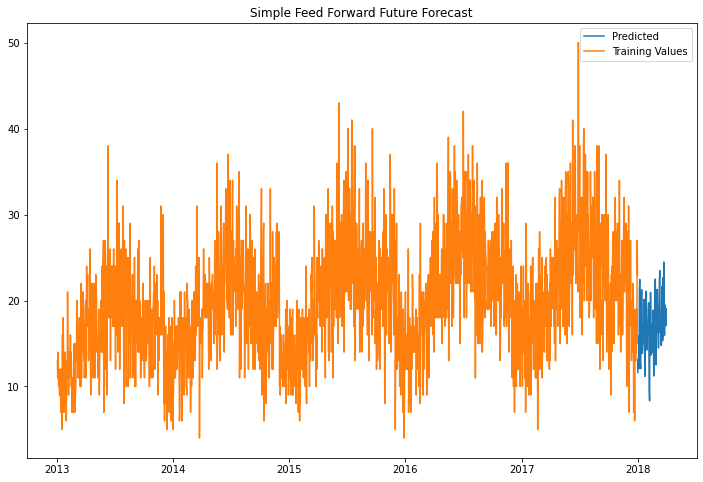

In [277]:
future_sff = gluonts_forecast([1], [1], model="sff", future=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(future_sff, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Simple Feed Forward Future Forecast")

### gluonTS SFF Forecasted Values and Error Metrics

In [38]:
results_gluonts_ssf = gluonts_forecast(range(1, 11), range(1, 2), model="sff",
                                      log=False)
gluonts_ssf_forecast = results_gluonts_ssf[0]
gluonts_ssf_error = results_gluonts_ssf[1]

100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 136.67it/s, epoch=3/3, avg_epoch_loss=3.48]


In [39]:
gluonts_ssf_forecast

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
date,,,,,,,,,,
2017-10-03,16.0,27.0,23.0,27.0,19.0,19.0,18.0,32.0,31.0,19.0
2017-10-04,20.0,27.0,23.0,28.0,18.0,19.0,17.0,30.0,25.0,27.0
2017-10-05,21.0,30.0,23.0,27.0,22.0,19.0,20.0,30.0,28.0,23.0
2017-10-06,28.0,32.0,29.0,29.0,22.0,21.0,18.0,35.0,25.0,32.0
2017-10-07,29.0,35.0,25.0,24.0,19.0,22.0,20.0,37.0,29.0,30.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,24.0,32.0,20.0,24.0,19.0,19.0,16.0,29.0,27.0,22.0
2017-12-28,21.0,30.0,28.0,27.0,18.0,17.0,22.0,34.0,25.0,26.0
2017-12-29,27.0,31.0,26.0,26.0,17.0,20.0,17.0,29.0,32.0,27.0


In [40]:
gluonts_ssf_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,5.833333,5.0,52.388889,7.238017,37.408724
1,6.977778,6.0,67.777778,8.232726,27.835876
2,5.122222,4.0,44.255556,6.652485,19.294794
3,5.188889,4.0,43.300000,6.580274,26.280502
4,4.066667,3.0,26.333333,5.131601,29.700677
5,5.411111,4.0,44.655556,6.682481,43.353360
6,3.988889,3.0,26.588889,5.156441,29.579102
7,5.677778,5.0,54.566667,7.386925,22.156759
8,5.811111,5.0,53.833333,7.337120,29.585148
9,5.833333,4.0,57.922222,7.610665,28.606717


### gluonTS SFF Forecasted Values and Error Metrics With Log Transformation

In [485]:
results_gluonts_ssf_log = gluonts_forecast(range(1, 11), range(1, 3), model="sff", log=True)
sff_log_forecast = results_gluonts_ssf_log[0]
sff_log_error = results_gluonts_ssf_log[1]

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 103.58it/s, epoch=1/3, avg_epoch_loss=0.938]
INFO:gluonts.trainer:Epoch[0] Elapsed time 0.967 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=0.938242
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 102.63it/s, epoch=2/3, avg_epoch_loss=0.572]
INFO:gluonts.trainer:Epoch[1] Elapsed time 0.976 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=0.571993
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|███████████████████████████████████████████████| 100/100 [00:01<00:00, 99.67it/s, epoch=3/3, avg_epoch_loss=0.535]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.006 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=0.535258
INFO:root:Computing averaged parameters.
INFO:root:Loading

100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 106.44it/s, epoch=2/3, avg_epoch_loss=0.624]
INFO:gluonts.trainer:Epoch[1] Elapsed time 0.941 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=0.623609
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|███████████████████████████████████████████████| 100/100 [00:01<00:00, 95.04it/s, epoch=3/3, avg_epoch_loss=0.524]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.056 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=0.523829
INFO:root:Computing averaged parameters.
INFO:root:Loading averaged parameters.
INFO:gluonts.trainer:End model training
INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 102.42it/s, epoch=1/3, avg_epoch_loss=0.928]
INFO:gluonts.trainer:Epoch[0] Elapsed time 0.980 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=

INFO:gluonts.trainer:End model training
INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 107.47it/s, epoch=1/3, avg_epoch_loss=0.995]
INFO:gluonts.trainer:Epoch[0] Elapsed time 0.934 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=0.995449
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 109.10it/s, epoch=2/3, avg_epoch_loss=0.511]
INFO:gluonts.trainer:Epoch[1] Elapsed time 0.918 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=0.511484
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 104.45it/s, epoch=3/3, avg_epoch_loss=0.441]
INFO:gluonts.trainer:Epoch[2] Elapsed time 0.961 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=0.440546
INFO:root:Computin

100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 101.18it/s, epoch=2/3, avg_epoch_loss=0.461]
INFO:gluonts.trainer:Epoch[1] Elapsed time 0.991 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=0.461118
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|██████████████████████████████████████████████| 100/100 [00:00<00:00, 106.33it/s, epoch=3/3, avg_epoch_loss=0.354]
INFO:gluonts.trainer:Epoch[2] Elapsed time 0.943 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=0.353754
INFO:root:Computing averaged parameters.
INFO:root:Loading averaged parameters.
INFO:gluonts.trainer:End model training


In [489]:
sff_log_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,5.101226,4.507173,38.394133,6.196300,0.327733
1,18.062712,14.569588,518.525008,22.771144,0.362787
2,10.037968,9.013216,154.255604,12.419968,0.441261
3,31.213635,26.892269,1559.912794,39.495731,0.468379
4,6.655017,5.532183,67.279367,8.202400,0.264482
5,12.769119,10.369675,264.351860,16.258901,0.198944
6,8.738165,7.461160,121.004326,11.000197,0.436802
7,16.816714,16.530371,390.973351,19.773046,0.296322
8,4.451578,3.537590,30.276609,5.502418,0.281627
9,12.868204,10.973497,251.361224,15.854376,0.327787


### Comparison of log tranformation vs no transformation for SFF

In [507]:
print("With Log: {}".format(sff_log_error["MAPE"].mean()))
print("Without Transformation: {}".format(gluonts_ssf_error["MAPE"].mean()))

With Log: 0.3286153856635353
Without Transformation: 0.27581313115458783


## SFF Weekly Forecasting

### SFF Weekly Forecasting Visualizations

100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 128.55it/s, epoch=3/3, avg_epoch_loss=4.74]


Text(0.5, 1.0, 'SimpleFeedForward Weekly Forecast')

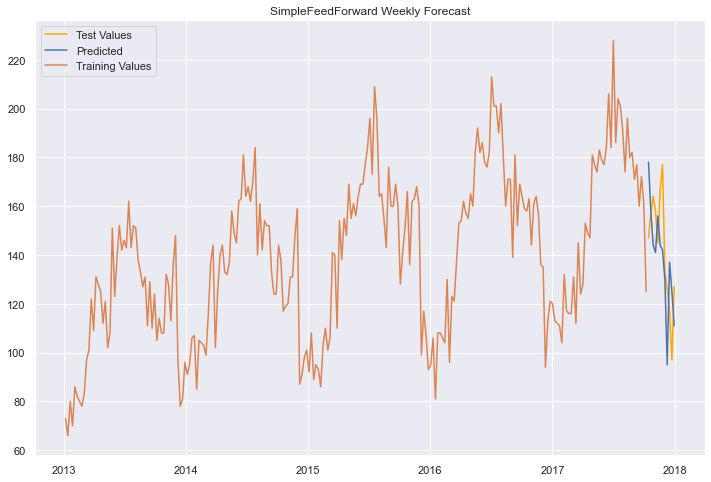

In [164]:
y_hat_SFF_weekly = gluonts_forecast([1], [1], model="sff", weekly=True)
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_SFF_weekly[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("SimpleFeedForward Weekly Forecast")

### SFF Weekly Forecasted Values and Error Metrics

In [165]:
results_gluonts_ssf_weekly = gluonts_forecast(range(1, 11), range(1, 3), 
                                               model="sff", 
                                               weekly=True)
gluonts_ssf_forecast_weekly = results_gluonts_ssf_weekly[0]
gluonts_ssf_error_weekly = results_gluonts_ssf_weekly[1]

100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 123.03it/s, epoch=3/3, avg_epoch_loss=5.71]


In [166]:
gluonts_ssf_forecast_weekly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-15,167.0,462.0,239.0,675.0,212.0,488.0,209.0,474.0,150.0,319.0,112.0,300.0,100.0,294.0,230.0,569.0,162.0,542.0,203.0,533.0
2017-10-22,162.0,374.0,241.0,565.0,237.0,564.0,196.0,468.0,132.0,386.0,145.0,385.0,124.0,341.0,172.0,575.0,147.0,385.0,196.0,513.0
2017-10-29,143.0,378.0,240.0,603.0,188.0,548.0,196.0,474.0,163.0,341.0,91.0,373.0,90.0,253.0,220.0,412.0,201.0,473.0,199.0,464.0
2017-11-05,169.0,381.0,215.0,521.0,179.0,460.0,137.0,490.0,121.0,342.0,126.0,363.0,131.0,287.0,247.0,567.0,153.0,484.0,184.0,561.0
2017-11-12,152.0,418.0,202.0,592.0,222.0,466.0,181.0,421.0,130.0,359.0,152.0,312.0,113.0,307.0,208.0,503.0,187.0,453.0,189.0,508.0
2017-11-19,170.0,374.0,224.0,562.0,206.0,504.0,132.0,476.0,117.0,338.0,125.0,327.0,92.0,295.0,186.0,403.0,175.0,442.0,175.0,488.0
2017-11-26,142.0,333.0,196.0,613.0,176.0,358.0,168.0,403.0,111.0,359.0,154.0,351.0,87.0,281.0,189.0,554.0,187.0,416.0,164.0,526.0
2017-12-03,149.0,415.0,231.0,491.0,174.0,433.0,128.0,436.0,109.0,282.0,136.0,310.0,118.0,276.0,174.0,507.0,151.0,393.0,194.0,480.0
2017-12-10,124.0,311.0,210.0,583.0,157.0,439.0,117.0,411.0,87.0,306.0,88.0,357.0,95.0,235.0,199.0,558.0,137.0,336.0,168.0,375.0


In [167]:
gluonts_ssf_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,14.000000,9.0,354.000000,18.814888,10.396341
1,52.416667,55.5,3930.416667,62.693035,13.476671
2,28.583333,27.0,1168.750000,34.186986,15.678440
3,48.500000,33.5,3383.000000,58.163562,9.285490
4,20.250000,20.5,522.750000,22.863727,11.058048
5,65.000000,55.0,5802.000000,76.170861,13.451042
6,28.250000,31.0,1144.750000,33.834154,17.566403
7,40.333333,24.0,2664.333333,51.617181,9.289322
8,15.416667,12.0,338.416667,18.396105,12.265236
9,30.083333,27.0,1259.083333,35.483564,9.673132


### SFF Weekly Future Forecast

100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 120.66it/s, epoch=3/3, avg_epoch_loss=4.75]


Text(0.5, 1.0, 'Simple Feed Forward Weekly Future Forecast')

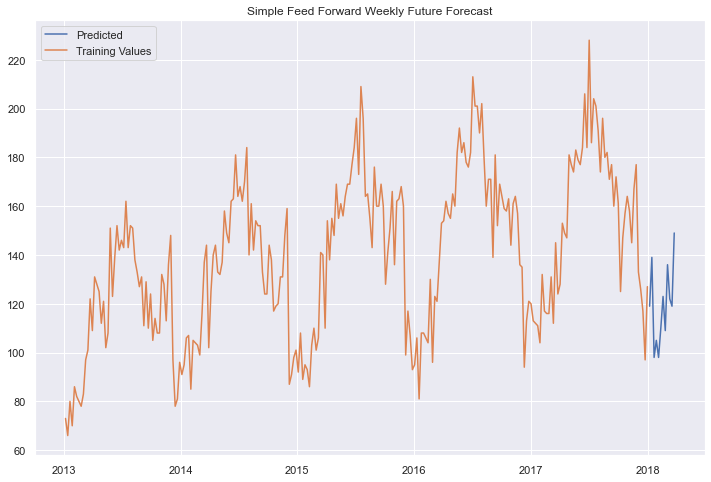

In [168]:
future_sff_weekly = gluonts_forecast([1], [1], model="sff", future=True,
                                     weekly=True)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_sff_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Simple Feed Forward Weekly Future Forecast")

## SFF Monthly Forecasting

### SFF Monthly Forecasting Visualizations

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 97.04it/s, epoch=1/3, avg_epoch_loss=9.34]
INFO:gluonts.trainer:Epoch[0] Elapsed time 1.032 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=9.340999
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 92.40it/s, epoch=2/3, avg_epoch_loss=6.85]
INFO:gluonts.trainer:Epoch[1] Elapsed time 1.085 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=6.850947
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 96.20it/s, epoch=3/3, avg_epoch_loss=6.34]
INFO:gluonts.trainer:Epoch[2] Elapsed time 1.041 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=6.342550
INFO:root:Computing averaged parameters.
INFO:root:Loading

Text(0.5, 1.0, 'SimpleFeedForward Monthly Forecast')

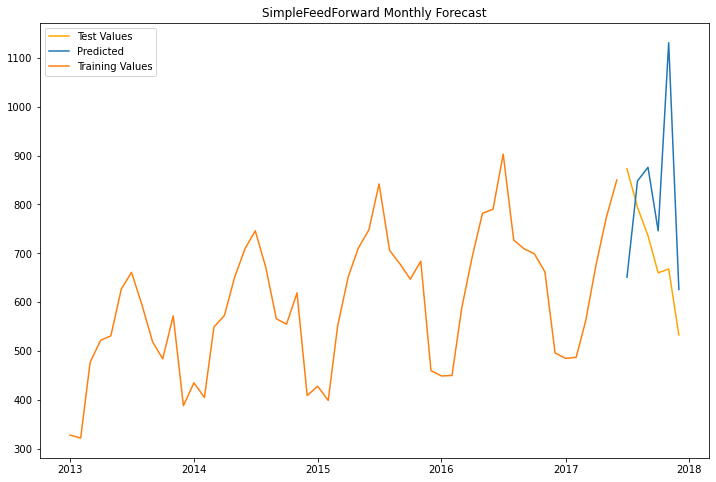

In [319]:
y_hat_SFF_monthly = gluonts_forecast([1], [1], model="sff", monthly=True)
a, train, test = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(y_hat_SFF_monthly[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("SimpleFeedForward Monthly Forecast")

### SFF Monthly Forecasted Values and Error Metrics

In [41]:
results_gluonts_ssf_monthly = gluonts_forecast(range(1, 11), range(1, 3), 
                                               model="sff", 
                                               monthly=True)
gluonts_ssf_forecast_monthly = results_gluonts_ssf_monthly[0]
gluonts_ssf_error_monthly = results_gluonts_ssf_monthly[1]

100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 157.16it/s, epoch=3/3, avg_epoch_loss=7.42]


In [42]:
gluonts_ssf_forecast_monthly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-07-01,1335.0,2119.0,1413.0,2987.0,1132.0,4144.0,1116.0,1382.0,555.0,1476.0,869.0,1128.0,704.0,2006.0,1524.0,3452.0,1633.0,1861.0,1005.0,3087.0
2017-08-01,934.0,3169.0,1065.0,3107.0,983.0,2425.0,910.0,3279.0,919.0,1864.0,757.0,2458.0,964.0,1651.0,1564.0,3776.0,1229.0,2153.0,379.0,2135.0
2017-09-01,1222.0,1689.0,1052.0,4318.0,972.0,1783.0,1132.0,1952.0,608.0,2053.0,636.0,2004.0,668.0,1749.0,1603.0,3032.0,664.0,3054.0,686.0,2920.0
2017-10-01,1231.0,2573.0,1581.0,5448.0,1475.0,2554.0,1332.0,4157.0,735.0,1052.0,901.0,1728.0,862.0,2123.0,798.0,3062.0,940.0,2322.0,875.0,3071.0
2017-11-01,816.0,2650.0,821.0,3731.0,1451.0,2682.0,1290.0,2722.0,870.0,1104.0,605.0,1072.0,542.0,1666.0,1044.0,3781.0,369.0,2293.0,974.0,2340.0
2017-12-01,840.0,1739.0,309.0,1219.0,689.0,1535.0,476.0,1704.0,817.0,917.0,647.0,1265.0,299.0,1159.0,603.0,1980.0,801.0,2268.0,841.0,2036.0


In [43]:
gluonts_ssf_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,352.333333,384.5,1.519057e+05,389.750775,50.475859
1,557.000000,476.0,4.179703e+05,646.506252,29.103324
2,224.000000,131.5,8.950733e+04,299.177762,24.766456
3,1159.000000,932.0,2.157721e+06,1468.918310,45.250845
4,223.500000,74.0,1.152035e+05,339.416411,25.408200
5,482.166667,351.0,3.527865e+05,593.958332,19.347477
6,264.166667,228.5,1.109738e+05,333.127353,33.744536
7,890.500000,726.0,1.259858e+06,1122.433740,38.805462
8,200.666667,221.0,5.355500e+04,231.419532,34.993794
9,359.666667,403.0,1.465843e+05,382.863335,22.797063


### SFF Monthly Future Forecast

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 94.41it/s, epoch=1/3, avg_epoch_loss=8.82]
INFO:gluonts.trainer:Epoch[0] Elapsed time 1.060 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=8.823102
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|████████████████████████████████████████████████| 100/100 [00:01<00:00, 91.74it/s, epoch=2/3, avg_epoch_loss=6.69]
INFO:gluonts.trainer:Epoch[1] Elapsed time 1.093 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=6.688306
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|███████████████████████████████████████████████| 100/100 [00:00<00:00, 104.33it/s, epoch=3/3, avg_epoch_loss=6.16]
INFO:gluonts.trainer:Epoch[2] Elapsed time 0.961 seconds
INFO:gluonts.trainer:Epoch[2] Evaluation metric 'epoch_loss'=6.155837
INFO:root:Computing averaged parameters.
INFO:root:Loading

Text(0.5, 1.0, 'Simple Feed Forward Monthly Future Forecast')

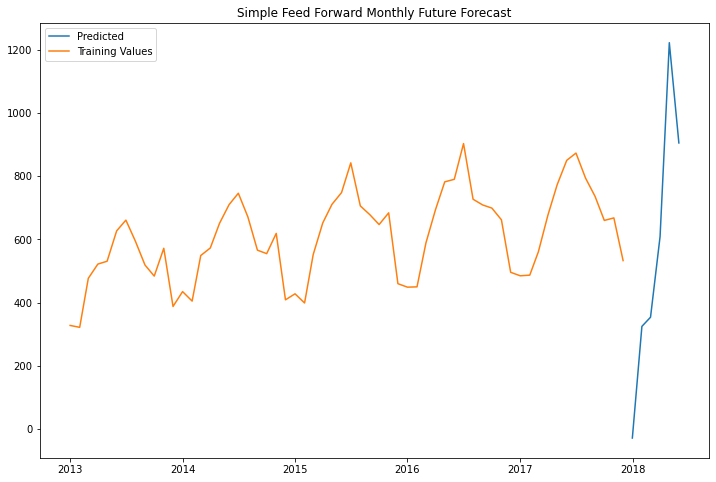

In [325]:
future_sff_monthly = gluonts_forecast([1], [1], model="sff", future=True,
                                     monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(future_sff_monthly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Simple Feed Forward Monthly Future Forecast")

# Facebook Prophet Model

In [339]:
def regression_preprocess_monthly(subset, p=6, future_forecast=False, date_col="date", sales_col="sales"):
    #Adding Dummy Variables
    subset = subset.reset_index()
    subset['month'] = subset[date_col].dt.month
    months = pd.get_dummies(subset["month"], prefix="month")
    subset = subset.drop("month", axis = 1)
    subset = subset.join(months)
    
    #lag1-12 variables
    for i in range(1, 5):
        subset["lag{}".format(i)] = subset[sales_col].shift(i)
    
    #rolling mean
    subset["rolling mean"] = subset["lag1"].rolling(3, min_periods=1).mean()
    
    #Lag Variables for rolling mean
    for i in range(1, 8):
        subset["rolling mean lag{}".format(i)] = subset["rolling mean"].shift(i)
        
    #rolling max
    subset["rolling max"] = subset["lag1"].rolling(3, min_periods=1).max()
    
    #Test/Train Split
    finaldf = subset.set_index(date_col)
    
    if future_forecast == True:
        return finaldf
    
    test_length=p
    end_point = len(finaldf)
    x = end_point - test_length
    finaldf_train = finaldf.iloc[:x, :]
    
    #Remove rows with Null values introduced by lag variables
    finaldf_train.dropna(inplace=True)
    
    finaldf_test = finaldf.iloc[x:, :]
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != sales_col]
    finaldf_test_y = finaldf_test[sales_col]
    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != sales_col]
    finaldf_train_y = finaldf_train[sales_col]
    
    return [finaldf_test_x, finaldf_test_y, finaldf_train_x, finaldf_train_y]

In [340]:
def prophet_forecast(stores=range(1, 11), items=range(1, 51), future=False, log=False, monthly=False, weekly=False,
                     monthly_iterations=250, **kwargs):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            
            if monthly:
                if log:
                    subset, d, e = preprocess_monthly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, d, e = preprocess_weekly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, d, e = preprocess(store, item, logged=True)
                else:
                    subset, f, g = preprocess(store, item, logged=False)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
             
            #Pre-processing
            subset = subset.reset_index()
            subset.columns = ['ds', 'y']
            subset = subset.set_index('ds')
            
            #Adding regressors and making test/train split
            if monthly:
                further_preprocess = regression_preprocess_monthly(subset, p=6, date_col='ds', sales_col='y')
            elif weekly:
                further_preprocess = regression_preprocess_weekly(subset, p=12, date_col='ds', sales_col='y')
            else:
                further_preprocess = regression_preprocess(subset, with_year=False, p=90, date_col='ds', sales_col='y')
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1].to_frame(name="y")
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3].to_frame(name="y")
        
            #Model Training
            model = Prophet(**kwargs)
            for col in finaldf_train_x.columns:
                model.add_regressor(col)
            
            train_data = pd.concat([finaldf_train_x, finaldf_train_y], axis=1).reset_index()
            if monthly:
                trained_model = model.fit(train_data, iter=monthly_iterations)
            elif weekly:
                trained_model = model.fit(train_data, iter=50)
            else:
                trained_model = model.fit(train_data)
            
            if monthly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, date_col='ds',
                                                  sales_col='y', monthly=True, proph=True)
            elif weekly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, date_col='ds',
                                                  sales_col='y', weekly=True, proph=True)
            else:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, date_col='ds',
                                                  sales_col='y', monthly=False, proph=True)
            y_pred = pd.DataFrame(predicted_values)
            
            #Appending forecasted values and error metrics to respective dfs
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred["y"]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred["y"].round()
            
            
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.values).round(), np.exp(test_y.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), test_y.values)
                errors.append(error_dict)
            
    
    #Converting to DataFrames
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df
    
    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

In [177]:
yhatt = prophet_forecast([1], [8], weekly=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [178]:
y_hat_log = prophet_forecast([1], [8], weekly=True, log=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [179]:
yhatt

[            store: 1, item: 8
 ds                           
 2017-10-15              546.0
 2017-10-22              553.0
 2017-10-29              554.0
 2017-11-05              555.0
 2017-11-12              560.0
 2017-11-19              581.0
 2017-11-26              576.0
 2017-12-03              489.0
 2017-12-10              447.0
 2017-12-17              438.0
 2017-12-24              431.0
 2017-12-31              438.0,
     MAE  MEDAE         MSE       RMSE      MAPE
 0  19.0   19.5  538.666667  23.209194  3.844952]

In [180]:
y_hat_log

[            store: 1, item: 8
 ds                           
 2017-10-15              536.0
 2017-10-22              547.0
 2017-10-29              546.0
 2017-11-05              552.0
 2017-11-12              562.0
 2017-11-19              582.0
 2017-11-26              575.0
 2017-12-03              469.0
 2017-12-10              428.0
 2017-12-17              419.0
 2017-12-24              407.0
 2017-12-31              411.0,
          MAE  MEDAE         MSE       RMSE      MAPE
 0  16.833333   17.0  401.666667  20.041623  3.282754]

## Prophet Visualization

In [347]:
yhatt = prophet_forecast([1], [1], log=True, **prophet_optimized_parameters_daily)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [348]:
yhatt[0]

,"store: 1, item: 1"
ds,
2017-10-03,20.0
2017-10-04,20.0
2017-10-05,21.0
2017-10-06,23.0
2017-10-07,25.0
...,...
2017-12-27,15.0
2017-12-28,15.0
2017-12-29,16.0


In [349]:
yhatt[1]

,MAE,MEDAE,MSE,RMSE,MAPE
0,3.855556,3.0,22.766667,4.771443,20.517912


Text(0.5, 1.0, 'Prophet')

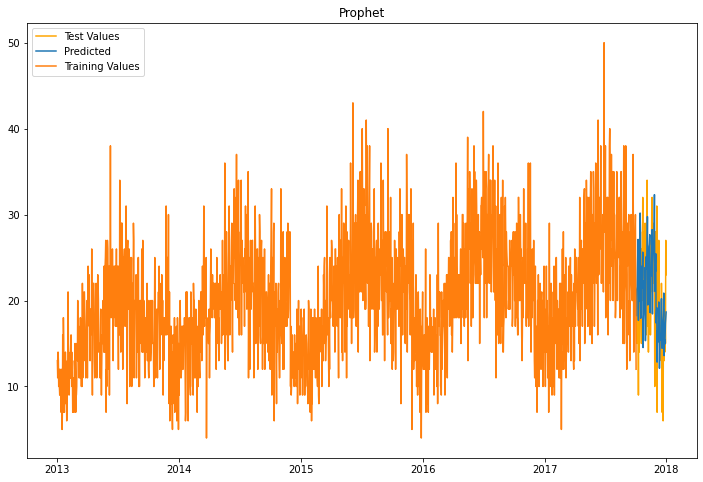

In [74]:
yhat_optimized = prophet_forecast([1], [1], log=True, **prophet_optimized_parameters)
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_optimized[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Prophet")

Text(0.5, 1.0, 'Prophet')

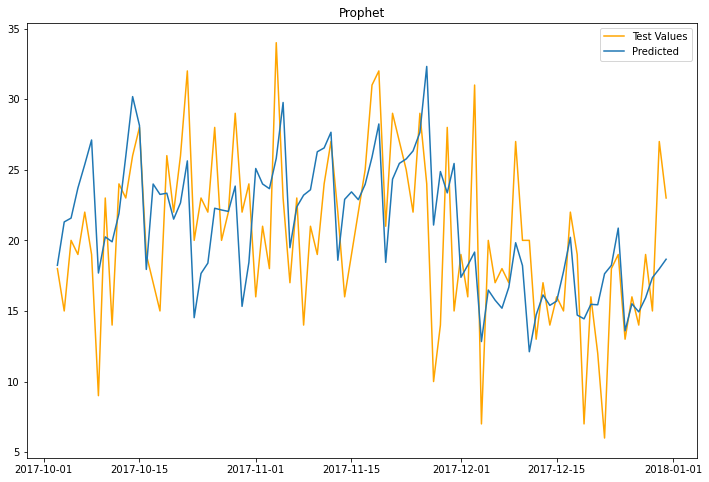

In [75]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_optimized[0], label="Predicted")
plt.legend()
plt.title("Prophet")

### Prophet Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Text(0.5, 1.0, 'Prophet')

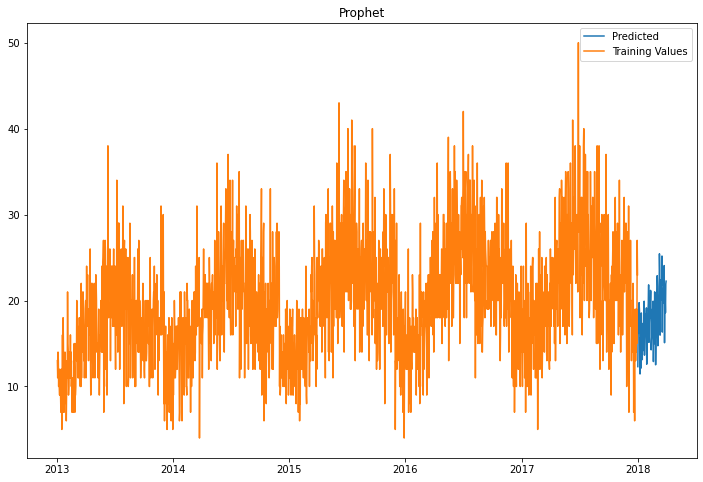

In [77]:
yhat = prophet_forecast([1], [1], log=True, future=True, **prophet_optimized_parameters)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Prophet")

In [279]:
prophet_future_df = prophet_forecast(items=range(1, 6), log=True, future=True, **prophet_optimized_parameters)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality

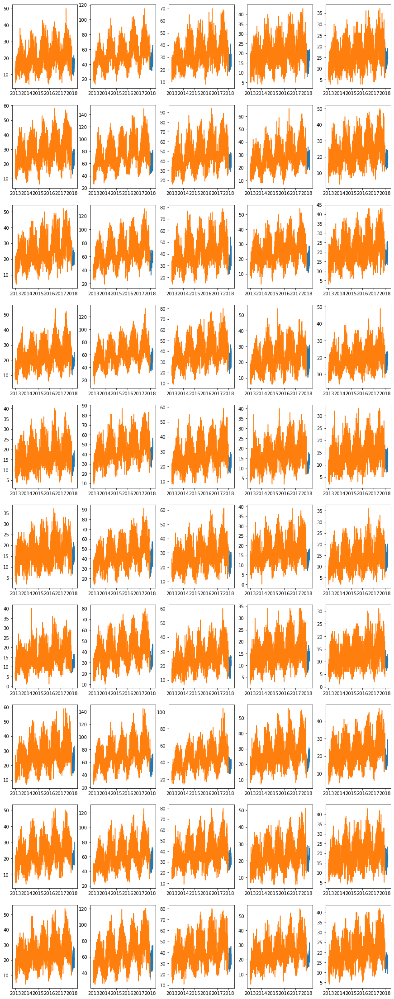

In [280]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset = df[df["item"] == (col + 1)]
        subset = subset[subset["store"] == (row + 1)]
        subset = subset[["sales"]]
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = xgboost_future_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

### Prophet Forecasted Values and Error

In [47]:
results_prophet = prophet_forecast(items=range(1, 2), log=True, **prophet_optimized_parameters_daily)
prophet_forecast = results_prophet[0]
prophet_error = results_prophet[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [48]:
prophet_forecast

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
ds,,,,,,,,,,
2017-10-03,20.0,30.0,26.0,23.0,17.0,15.0,18.0,27.0,23.0,24.0
2017-10-04,20.0,31.0,26.0,24.0,18.0,16.0,17.0,28.0,23.0,26.0
2017-10-05,21.0,33.0,27.0,26.0,18.0,17.0,18.0,29.0,25.0,28.0
2017-10-06,23.0,37.0,29.0,28.0,23.0,18.0,17.0,31.0,26.0,28.0
2017-10-07,25.0,38.0,33.0,28.0,21.0,18.0,19.0,30.0,28.0,30.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,15.0,23.0,21.0,18.0,13.0,13.0,12.0,21.0,19.0,18.0
2017-12-28,15.0,26.0,22.0,19.0,15.0,15.0,14.0,23.0,20.0,21.0
2017-12-29,16.0,28.0,22.0,20.0,17.0,15.0,13.0,25.0,22.0,23.0


In [49]:
prophet_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,3.855556,3.0,22.766667,4.771443,20.517912
1,4.633333,4.0,34.255556,5.852825,17.275813
2,3.788889,3.0,22.966667,4.792355,13.551790
3,4.122222,3.0,25.900000,5.089204,17.495042
4,3.577778,3.0,19.666667,4.434712,20.571897
5,3.433333,3.0,18.522222,4.303745,21.127746
6,3.088889,2.0,16.066667,4.008325,19.624606
7,4.555556,4.0,36.955556,6.079108,14.748535
8,3.377778,2.0,20.688889,4.548504,14.304660
9,3.288889,3.0,17.400000,4.171331,13.502226


Text(0, 0.5, 'Avg Values')

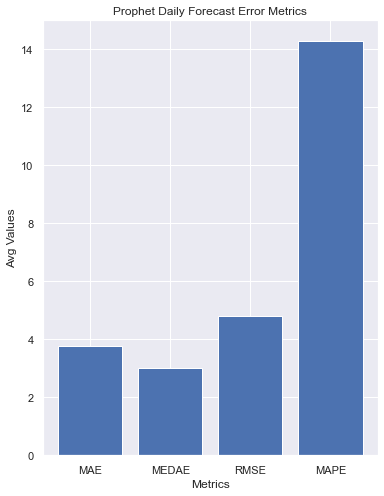

In [368]:
x_values = [x for x in prophet_error.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(prophet_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Prophet Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Comparison of Prophet Models

In [ ]:
x = ["Prophet w/o Transformation", "Prophet with Log Transformation", "Prophet Optimized Parameters"]
y = [prophet_error["MAPE"].mean(), forest_forecast_error["MAPE"].mean(), prophet_error_optimized["MAPE"].mean()]
error_df = pd.DataFrame({"Models": x, "MAPE_avg": y})
error_df.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.barh(y=error_df["Models"], width=error_df["MAPE_avg"])

## Hyperparameter Tuning (Prophet)

In [31]:
changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday, 
                        interval_width=0.95)

IndentationError: unexpected indent (<ipython-input-31-17ebb5e182bf>, line 2)

In [297]:
param_types = {'changepoint_prior_scale': 'float', 
               'seasonality_prior_scale': 'float',
              'seasonality_mode': 'int'}

bounds = {'changepoint_prior_scale': [0.001, 0.5],
          'seasonality_prior_scale': [0.01, 10],
          'seasonality_mode': [0, 1]}

In [299]:
def objective(trial):
    '''Train a prophet model and return the rmse'''
    # sampling
    params = {'yearly_seasonality': True, 'daily_seasonality': False, 
                            'weekly_seasonality': True}
    for param in ['changepoint_prior_scale', 'seasonality_prior_scale']:
        params[param] = trial.suggest_uniform(param, bounds[param][0], bounds[param][1])
        
    estacionality = ['additive', 'multiplicative']
    params['seasonality_mode'] = estacionality[trial.suggest_int('seasonality_mode', 
                                                                  bounds['seasonality_mode'][0], 
                                                                  bounds['seasonality_mode'][1])]

    # modeling
    results = prophet_forecast([1], [1], weekly=True, log=True, **params)
    errors = results[1]["MAPE"]
    
    return errors.mean()
    
    


In [301]:
study_prophet = optuna.create_study()
study_prophet.optimize(objective, n_trials=10)
prophet_optimized_parameters = study_prophet.best_params
prophet_optimized_parameters

[I 2021-12-08 08:09:05,509] A new study created in memory with name: no-name-ccba5716-b871-4a66-8617-326bee1ccddf
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-08 08:09:34,223] Trial 0 finished with value: 7.591654597177798 and parameters: {'changepoint_prior_scale': 0.24676418244553452, 'seasonality_prior_scale': 2.5740691830219755, 'seasonality_mode': 0}. Best is trial 0 with value: 7.591654597177798.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-

{'changepoint_prior_scale': 0.009618469357176501,
 'seasonality_prior_scale': 5.70715771140412,
 'seasonality_mode': 1}

In [302]:
prophet_optimized_parameters_daily = {'changepoint_prior_scale': 0.19569232297455164,
 'seasonality_prior_scale': 3.8666270808758667,
 'seasonality_mode': 'additive', 'weekly_seasonality': True, 
                                      'daily_seasonality': False, 
                                      'yearly_seasonality': True}


prophet_optimized_parameters_monthly = {'changepoint_prior_scale': 0.042474518440939364, 
 'seasonality_prior_scale': 0.5804254339320214, 
                                        'seasonality_mode': 'multiplicative', 
                                        'yearly_seasonality': True, 
                                        'daily_seasonality': False, 
                            'weekly_seasonality':False}

prophet_optimized_parameters_weekly = {'changepoint_prior_scale': 0.009618469357176501,
 'seasonality_prior_scale': 5.70715771140412,
 'seasonality_mode': "additive"}


## Prophet Weekly Forecasting

### Prophet Weekly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Text(0.5, 1.0, 'prophet Weekly')

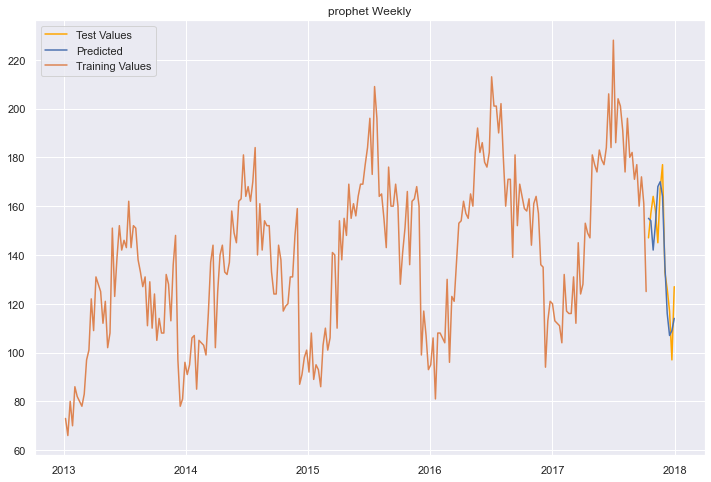

In [181]:
yhat_weekly = prophet_forecast([1], [1], weekly=True, log=True)
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_weekly[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("prophet Weekly")

### Prophet Weekly Forecast Values and Error Metrics

In [303]:
results_prophet_weekly = prophet_forecast(items=[1], weekly=True, log=True, 
                                          **prophet_optimized_parameters_weekly)
prophet_forecast_weekly = results_prophet_weekly[0]
prophet_error_weekly = results_prophet_weekly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_sea

In [350]:
prophet_error_weekly = results_prophet_weekly[1]

In [351]:
prophet_forecast_weekly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
ds,,,,,,,,,,
2017-10-15,158.0,237.0,211.0,178.0,133.0,119.0,124.0,212.0,179.0,203.0
2017-10-22,157.0,223.0,193.0,173.0,130.0,124.0,120.0,212.0,176.0,185.0
2017-10-29,145.0,203.0,176.0,179.0,126.0,134.0,112.0,208.0,173.0,177.0
2017-11-05,156.0,236.0,211.0,180.0,137.0,135.0,120.0,223.0,195.0,198.0
2017-11-12,173.0,236.0,214.0,194.0,143.0,143.0,130.0,235.0,201.0,208.0
2017-11-19,174.0,240.0,218.0,199.0,148.0,144.0,130.0,231.0,200.0,219.0
2017-11-26,168.0,232.0,215.0,189.0,140.0,137.0,118.0,217.0,194.0,216.0
2017-12-03,140.0,177.0,168.0,157.0,118.0,122.0,104.0,180.0,159.0,170.0
2017-12-10,119.0,174.0,160.0,138.0,107.0,112.0,94.0,163.0,142.0,151.0


In [352]:
prophet_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,10.416667,9.0,156.583333,12.513326,7.524786
1,15.500000,15.5,312.666667,17.682383,8.015977
2,14.416667,13.0,260.916667,16.152915,7.991921
3,11.333333,10.0,246.833333,15.710930,7.156795
4,6.916667,6.5,63.750000,7.984360,5.703803
5,10.500000,8.5,149.500000,12.227019,8.703648
6,9.166667,9.5,101.666667,10.082989,8.509853
7,7.333333,8.0,86.166667,9.282600,3.615018
8,11.250000,10.0,184.250000,13.573872,6.818119
9,9.750000,8.5,134.916667,11.615363,5.768767


Text(0, 0.5, 'Avg Values')

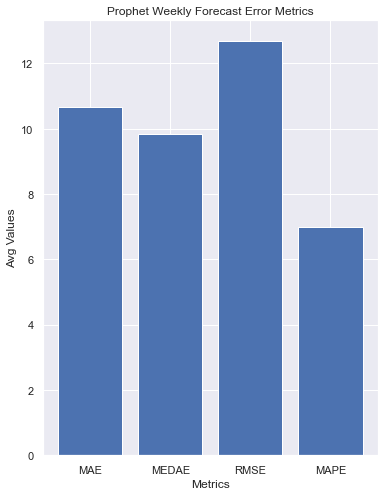

In [353]:
x_values = [x for x in prophet_error_weekly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(prophet_error_weekly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Prophet Weekly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Prophet Weekly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Text(0.5, 1.0, 'Prophet Weekly')

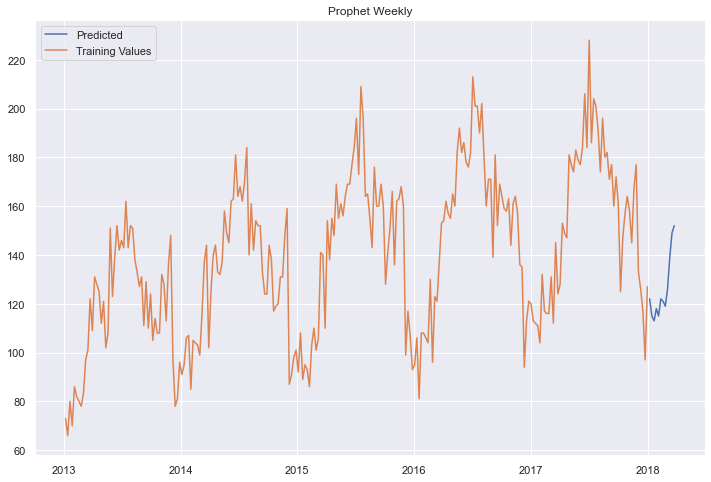

In [311]:
yhat_weekly = prophet_forecast([1], [1], future=True, weekly=True, log=True)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Prophet Weekly")

## Prophet Monthly Forecasting

### Prophet Monthly Forecasting Visualizations

In [ ]:
monthly_optimal_params = {"iter": 200}

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Text(0.5, 1.0, 'prophet Monthly')

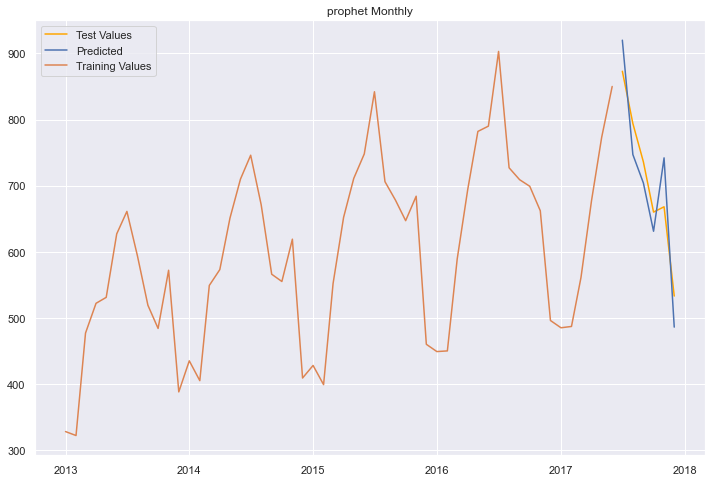

In [348]:
yhat = prophet_forecast([1], [1], monthly=True, log=True)
a, train, test = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat[0], label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("prophet Monthly")

### Prophet Monthly Forecast Values and Error Metrics

In [172]:
results_prophet_monthly = prophet_forecast(items=[1], monthly=True)
prophet_forecast_monthly = results_prophet_monthly[0]
prophet_error_monthly = results_prophet_monthly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_sea

In [173]:
prophet_forecast_monthly

,"store: 1, item: 1","store: 2, item: 1","store: 3, item: 1","store: 4, item: 1","store: 5, item: 1","store: 6, item: 1","store: 7, item: 1","store: 8, item: 1","store: 9, item: 1","store: 10, item: 1"
ds,,,,,,,,,,
2017-07-01,954.0,1222.0,1113.0,1034.0,692.0,730.0,725.0,1054.0,1051.0,1026.0
2017-08-01,643.0,1015.0,1027.0,871.0,612.0,677.0,562.0,1016.0,907.0,1096.0
2017-09-01,764.0,959.0,931.0,842.0,607.0,592.0,531.0,769.0,802.0,937.0
2017-10-01,721.0,913.0,932.0,803.0,555.0,548.0,557.0,679.0,756.0,942.0
2017-11-01,713.0,946.0,930.0,804.0,555.0,601.0,510.0,640.0,797.0,799.0
2017-12-01,510.0,744.0,686.0,581.0,532.0,496.0,446.0,379.0,576.0,505.0


In [349]:
prophet_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,64.833333,53.0,6070.166667,77.911274,8.732413
1,71.666667,68.0,5880.666667,76.685505,6.872705
2,50.333333,50.0,2983.666667,54.622950,5.617304
3,28.000000,24.5,1207.333333,34.746702,3.502339
4,40.833333,40.0,2084.166667,45.652674,7.105363
5,28.666667,21.5,1299.333333,36.046267,5.492770
6,25.333333,20.0,881.333333,29.687259,5.025470
7,232.333333,252.5,65080.333333,255.108474,25.238471
8,28.166667,26.5,1041.166667,32.267114,3.348918
9,94.666667,83.0,9902.666667,99.512143,11.232433


In [347]:
prophet_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,64.833333,53.0,6070.166667,77.911274,8.732413
1,71.666667,68.0,5880.666667,76.685505,6.872705
2,50.333333,50.0,2983.666667,54.622950,5.617304
3,28.000000,24.5,1207.333333,34.746702,3.502339
4,40.833333,40.0,2084.166667,45.652674,7.105363
5,28.666667,21.5,1299.333333,36.046267,5.492770
6,25.333333,20.0,881.333333,29.687259,5.025470
7,232.333333,252.5,65080.333333,255.108474,25.238471
8,28.166667,26.5,1041.166667,32.267114,3.348918
9,94.666667,83.0,9902.666667,99.512143,11.232433


Text(0, 0.5, 'Avg Values')

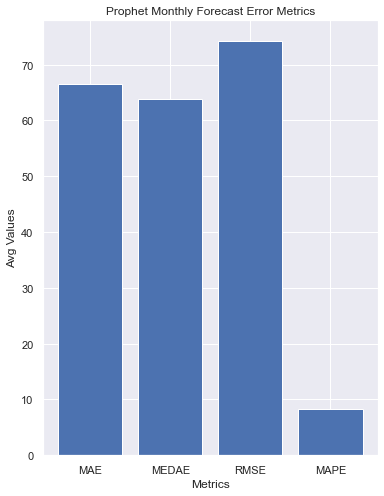

In [346]:
x_values = [x for x in prophet_error_monthly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(prophet_error_monthly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Prophet Monthly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Prophet Monthly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Text(0.5, 1.0, 'Prophet Monthly')

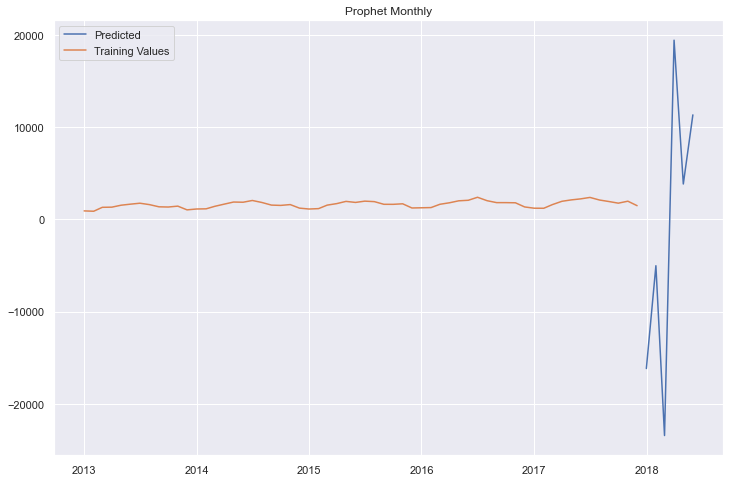

In [342]:
yhat = prophet_forecast([1], [2], future=True, monthly=True)
train, b, c = preprocess_monthly(1, 2)
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Prophet Monthly")

# Exponential Smoothing Models

In [25]:
def exponential_forecast(stores=range(1, 11), items=range(1, 51)):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            subset, train, test = preprocess(store, item)
            
            #Model Training and Forecasting
            trained_model = ExponentialSmoothing(train, trend="mul", 
                                                 seasonal='mul', 
                                      seasonal_periods=365).fit()
            predicted_array = trained_model.predict(start=1736, end=1825)
            y_pred = pd.DataFrame(predicted_array, index=test.index)
            
            #Appending forecasted values and error metrics to respective dfs
            error_dict = forecast_errors(y_pred.values, test.values)
            errors.append(error_dict)
            forecasted_values["store: {}, item: {}".format(store, item)] = y_pred[0]
    
    #Converting to DataFrames
    errors_df = pd.DataFrame(errors)
    forecast_df = pd.DataFrame(forecasted_values)
    
    return [forecast_df, errors_df]

In [26]:
#Creating a subset of data for visualization purposes (store-1, item-1)
subset = df[["sales"]][:1826]
train = subset[:1736]
test = subset[1736:]

## Single Exponential Smoothing

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


Text(0.5, 1.0, 'Single Exponential Smoothing')

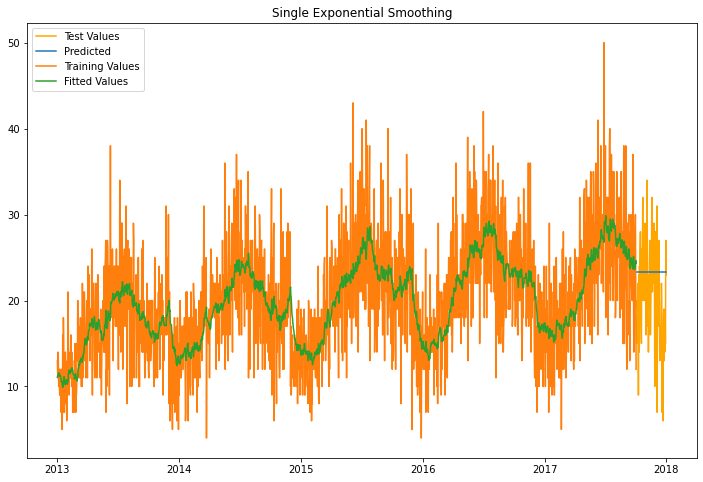

In [27]:
#Single Exponential Smoothing
plt.figure(figsize=(12,8))
fit1 = SimpleExpSmoothing(train).fit()
yhat = fit1.predict(start=1736, end=1825)
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.plot(fit1.fittedvalues, label="Fitted Values")
plt.legend()
plt.title("Single Exponential Smoothing")

## Double Exponential Smoothing (Holt's Method Additive)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\statsmodels\tsa\holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


Text(0.5, 1.0, "Holt's Method Additive")

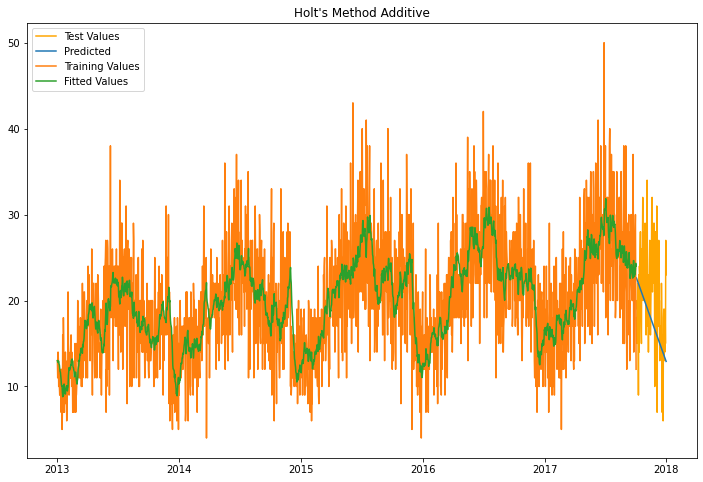

In [28]:
#Holt's Method Additive
plt.figure(figsize=(12,8))
fit_holt = Holt(train).fit()
yhat_holt = fit_holt.predict(start=1736, end=1825)
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_holt, label="Predicted")
plt.plot(train, label="Training Values")
plt.plot(fit_holt.fittedvalues, label="Fitted Values")
plt.legend()
plt.title("Holt's Method Additive")

## Double Exponential Smoothing (Holt's Method Multiplicative)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


Text(0.5, 1.0, "Holt's Method Multiplicative")

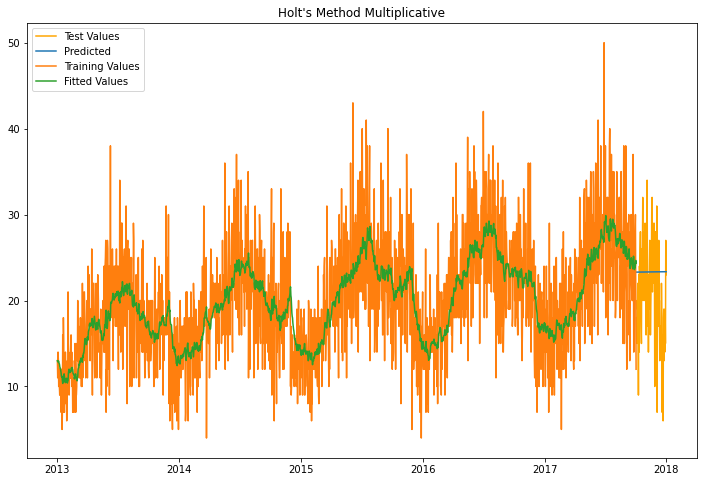

In [29]:
#Holt's Method Multiplicative
plt.figure(figsize=(12,8))
fit_holt = Holt(train, exponential=True).fit()
yhat_holt = fit_holt.predict(start=1736, end=1825)
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_holt, label="Predicted")
plt.plot(train, label="Training Values")
plt.plot(fit_holt.fittedvalues, label="Fitted Values")
plt.legend()
plt.title("Holt's Method Multiplicative")

## Triple Exponential Smoothing

### Yearly Seasonality

In [ ]:
#Triple Exponential Smoothing
fit_triple = ExponentialSmoothing(train, trend="mul", seasonal='mul', 
                                  seasonal_periods=365).fit()

plt.figure(figsize=(12,8))
yhat_triple = fit_triple.predict(start=1736, end=1825)
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_triple, label="Predicted")
plt.plot(train, label="Training Values")
plt.plot(fit_triple.fittedvalues, label="Fitted Values")
plt.legend()
plt.title("Holt Winters Method Multiplicative (Yearly Seasonality)")

## Compare Smoothing Model Errors

### MAPE Comparison

In [ ]:
#Compare Smoothing Model Errors
smoothing_models = ["Single Smoothing", "Double Smoothing", "Triple Smoothing"]
MAPE_avg = [summary_exponential_forecast["Single MAPE"].mean(), summary_exponential_forecast["Double MAPE"].mean(), summary_exponential_forecast["Triple MAPE"].mean()]
plt.figure(figsize=(8, 5))
plt.bar(smoothing_models, MAPE_avg)
plt.title("Comparison of MAPE Between Exponential Smoothing Models (Avg)")
plt.ylabel("MAPE Average")


### MAPE Comparison Continued

In [ ]:
smoothing_models = ["Single Smoothing", "Double Smoothing", "Triple Smoothing"]
single = len(summary_exponential_forecast[(summary_exponential_forecast["Single MAPE"] < summary_exponential_forecast["Double MAPE"]) & (summary_exponential_forecast["Single MAPE"] < summary_exponential_forecast["Triple MAPE"])])
double = len(summary_exponential_forecast[(summary_exponential_forecast["Double MAPE"] < summary_exponential_forecast["Single MAPE"]) & (summary_exponential_forecast["Double MAPE"] < summary_exponential_forecast["Triple MAPE"])])
triple = len(summary_exponential_forecast[(summary_exponential_forecast["Triple MAPE"] < summary_exponential_forecast["Single MAPE"]) & (summary_exponential_forecast["Triple MAPE"] < summary_exponential_forecast["Double MAPE"])])

plt.figure(figsize=(8, 5))
plt.bar(smoothing_models, [single, double, triple])
plt.title("Frequency With Which Each Model Performed Best (MAPE)")

Triple smoothing is indusputably the best forecasting model between the three, followed by single smoothing, and worst appears to be double smoothing.

## Exponential Smoothing Forecasted Values

In [ ]:
triple_smoothing = forecast(5, 50, 'triple smoothing')

In [ ]:
triple_smoothing

## Exponential Smoothing Error Tables

In [ ]:
triple_smoothing_error = forecast(10, 3, 'triple smoothing', error_data=True)
triple_smoothing_error

# Arima Model 

In [ ]:
def arima_forecast(stores=range(1, 11), items=range(1, 51), future=False):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            subset, train, test = preprocess(store, item)
            print(subset)
            
            further_preprocess = regression_preprocess(subset, with_year=False)
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
            print("finaldf_test_x: {}".format(finaldf_test_x))
            print("finaldf_test_y: {}".format(finaldf_test_y))
            print("finaldf_train_x: {}".format(finaldf_train_x))
            print("finaldf_train_y: {}".format(finaldf_train_y))
            
            arima_model = auto_arima(y=finaldf_train_y, X=finaldf_train_x, 
                                     m=7, seasonal = True)
            predicted_values = arima_model.predict(n_periods=len(finaldf_test_y), X=finaldf_test_x)
            y_pred = pd.DataFrame(predicted_values, finaldf_test_y.index)

            

            #Appending forecasted values and error metrics to respective dfs
            forecasted_values["store: {}, item: {}".format(store, 
                                                           item)] = y_pred[0]
            if future == False:
                error_dict = forecast_errors(y_pred.values, 
                                             finaldf_test_y.values)
                errors.append(error_dict)
            
    
    #Converting to DataFrames
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df
    
    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

## Arima Visualization

In [ ]:
subset = df[df["store"] == 1]
subset = subset[subset["item"] == 1][["sales"]]
train = subset[:1736]
test = subset[1736:]
predicted = arima_forecast([1], [1])[0]

plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(predicted, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Arima Store 1, Item 1")

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(predicted, label="Predicted")
#plt.plot(train, label="Training Values")
plt.legend()
plt.title("Arima Store 1, Item 1")

## Arima Forecasted and Error

In [ ]:
results_arima = arima_forecast(stores=range(1, 6), items=[1])
arima_forecast = results_arima[0]
arima_error = results_arima[1]

In [ ]:
arima_forecast

In [ ]:
arima_error

# SVR

In [558]:
testing = svr_forecast([1], [1])

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


            week_day_0  week_day_1  week_day_2  week_day_3  week_day_4  \
date                                                                     
2013-01-29           0           1           0           0           0   
2013-01-30           0           0           1           0           0   
2013-01-31           0           0           0           1           0   
2013-02-01           0           0           0           0           1   
2013-02-02           0           0           0           0           0   
...                ...         ...         ...         ...         ...   
2017-12-27           0           0           1           0           0   
2017-12-28           0           0           0           1           0   
2017-12-29           0           0           0           0           1   
2017-12-30           0           0           0           0           0   
2017-12-31           0           0           0           0           0   

            week_day_5  week_day_6  m

In [557]:
def svr_forecast(stores=range(1, 11), items=range(1, 51), future=False):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            subset, train, test = preprocess(store, item)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
            
            #Adding regressors and making test/train split
            further_preprocess = regression_preprocess(subset, with_year=False, p=90)
            
            #finaldf_test_x = further_preprocess[0].values
            #finaldf_test_y = further_preprocess[1].values.reshape(-1, 1)
            #finaldf_train_x = further_preprocess[2].values
            #finaldf_train_y = further_preprocess[3].values.reshape(-1, 1)
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
            
                    
            #Model + Prediction
            trained_model = SVR(kernel='rbf').fit(finaldf_train_x, 
                                                  finaldf_train_y)

            predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model)
            
            
            #predicted_values = trained_model.predict(finaldf_test_x)
            y_pred = pd.DataFrame(predicted_values)
            print(y_pred.tail(30))
           
            forecasted_values["store: {}, item: {}"
                              .format(store, item)] = y_pred["sales"]
    
            if future == False:
                error_dict = forecast_errors(y_pred.values, test_y.values)
                errors.append(error_dict)
                
   
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df

    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

## SVR Visualization

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'SVR')

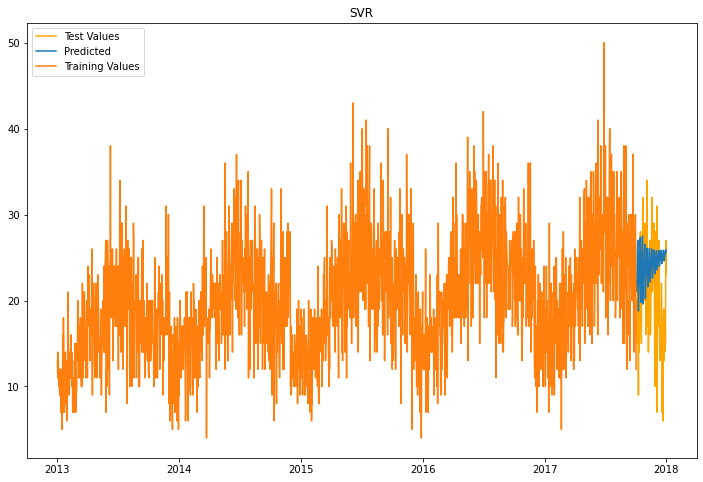

In [359]:
yhat = svr_forecast([1], [1])[0]
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("SVR")

Text(0.5, 1.0, 'SVR')

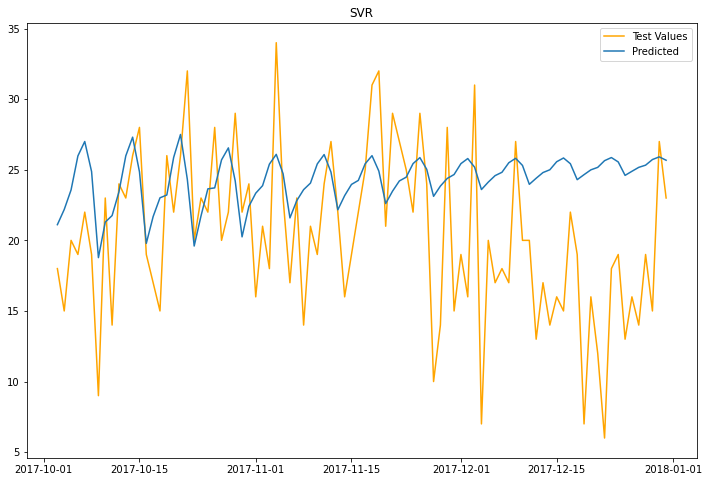

In [360]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("SVR")

### SVR Future Forecasting

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'SVR Future Forecast')

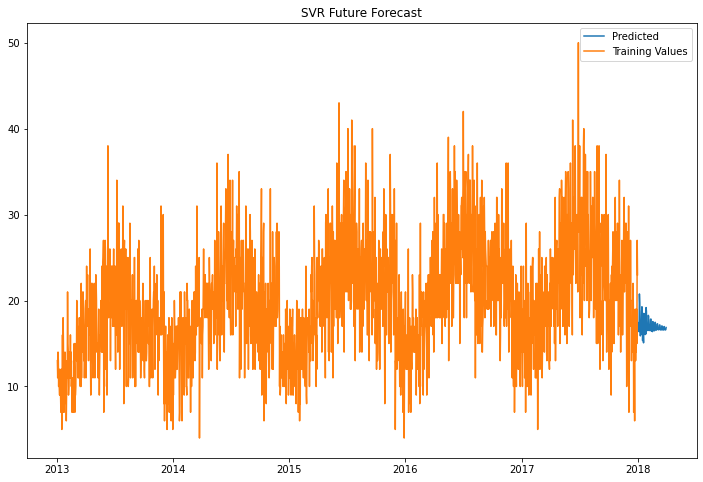

In [361]:
yhat = svr_forecast([1], [1], future=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("SVR Future Forecast")

### SVR Forecasted Values and Error

In [354]:
results_svr = svr_forecast(items=range(1, 6))
svr_forecast = results_svr[0]
svr_error = results_svr[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [355]:
svr_forecast

,"store: 1, item: 1","store: 1, item: 2","store: 1, item: 3","store: 1, item: 4","store: 1, item: 5","store: 2, item: 1","store: 2, item: 2","store: 2, item: 3","store: 2, item: 4","store: 2, item: 5",...,"store: 9, item: 1","store: 9, item: 2","store: 9, item: 3","store: 9, item: 4","store: 9, item: 5","store: 10, item: 1","store: 10, item: 2","store: 10, item: 3","store: 10, item: 4","store: 10, item: 5"
date,,,,,,,,,,,,,,,,,,,,,
2017-10-03,21.111201,59.811430,36.606362,21.684001,16.194141,28.531606,85.850907,52.484147,31.833372,24.777996,...,27.373808,68.996930,40.073636,25.174702,23.036198,26.189944,74.418040,42.280491,28.475027,22.354288
2017-10-04,22.185591,60.200887,38.008661,22.274105,18.487331,28.442427,86.574105,46.565842,28.866344,26.370655,...,28.799270,74.008650,43.060805,29.109949,21.094350,25.723454,77.863941,45.010406,27.419665,21.305765
2017-10-05,23.572114,62.234982,38.413756,22.071160,19.164849,31.936443,90.153358,52.774390,31.935092,26.351084,...,28.657172,75.272895,41.789208,28.891007,21.048436,25.310134,77.625075,47.692807,30.116126,23.233197
2017-10-06,25.980726,65.182978,41.926354,20.664902,17.615005,33.094642,89.702115,56.743881,35.808579,28.838956,...,30.809309,74.903079,45.787665,30.135597,24.372602,27.752261,81.124641,49.954318,32.443095,23.825212
2017-10-07,27.001168,71.795845,43.010073,21.212841,21.175533,34.964394,95.104554,57.955567,34.336887,29.244045,...,30.137949,82.234159,43.018312,31.708246,24.338073,29.854148,83.470798,52.691856,31.313001,24.315668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,25.170733,61.609095,41.711002,20.428844,20.341226,30.458035,88.735714,54.147773,33.325351,28.943614,...,30.381351,76.461428,42.983566,29.631407,23.996193,28.340348,81.216125,48.635361,30.306982,26.095934
2017-12-28,25.325544,62.188913,41.977686,20.378828,20.486903,30.762365,89.476687,54.796494,33.656666,29.212378,...,30.405631,76.788699,43.059289,29.725830,24.058604,28.542397,81.448488,49.246514,30.378903,26.278792
2017-12-29,25.724311,63.087475,42.362748,20.190442,20.404550,31.151379,89.842474,55.479883,34.045685,29.574027,...,30.582981,77.310579,43.662180,29.793019,24.333458,28.852519,81.895436,49.640456,30.832720,26.409017


In [356]:
svr_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,5.936911,5.297599,48.806118,6.986138,0.389436
1,10.875871,9.843258,149.511100,12.227473,0.208774
2,8.493291,7.260642,110.914216,10.531582,0.310968
3,4.612190,4.180058,29.713866,5.451043,0.258409
4,4.975235,4.398082,34.423498,5.867154,0.378199
5,7.199999,6.118881,68.157351,8.255747,0.288351
6,16.676871,14.292494,347.951797,18.653466,0.231211
7,10.175854,8.965721,138.078847,11.750696,0.216882
8,6.160501,5.249322,56.476404,7.515078,0.238265
9,6.093207,5.370655,51.125223,7.150190,0.279367


# Multiple Linear Regression

In [185]:
def linear_regression_forecast(stores=range(1, 11), items=range(1, 51), future=False, log=False, monthly=False, weekly=False):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            if monthly:
                if log:
                    subset, d, e = preprocess_monthly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, d, e = preprocess_weekly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, d, e = preprocess(store, item, logged=True)
                else:
                    subset, f, g = preprocess(store, item, logged=False)
            
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
            
            #Adding regressors and making test/train split
            if monthly:
                further_preprocess = regression_preprocess_monthly(subset, p=6)
            elif weekly:
                further_preprocess = regression_preprocess_weekly(subset, p=12)
            else:
                further_preprocess = regression_preprocess(subset, with_year=False, p=90)
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
            trained_model = linear_model.LinearRegression().fit(
                            finaldf_train_x, finaldf_train_y)
            
            if monthly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=True)
            elif weekly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, weekly=True)
            else:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=False)
            y_pred = pd.DataFrame(predicted_values)
            
            #Appending forecasted values and error metrics to respective dfs
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred["sales"]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred["sales"].round()
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.values).round(), 
                                                 np.exp(test_y.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), 
                                                 test_y.values)
                errors.append(error_dict)
                
   
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df

    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df]

### Regression Visualization

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression')

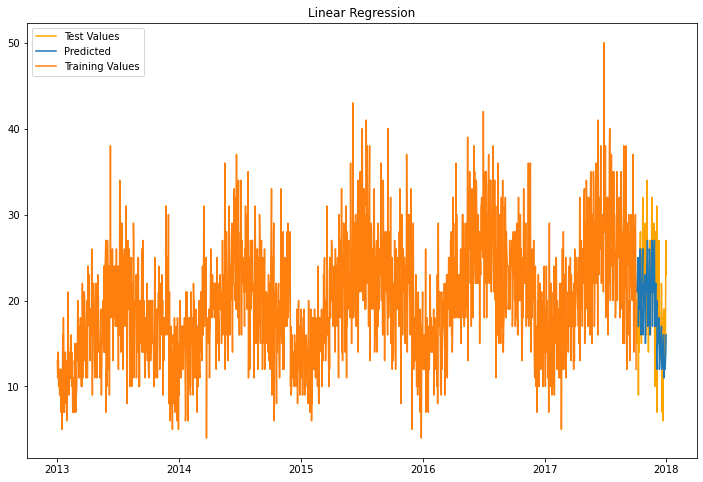

In [255]:
yhat = linear_regression_forecast([1], [1], log=True)[0]
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression")

Text(0.5, 1.0, 'Linear Regression')

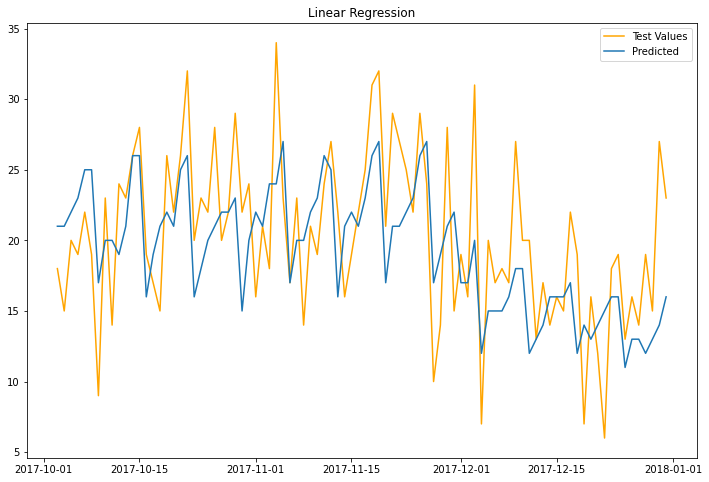

In [170]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("Linear Regression")

### Regression Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression Future Forecast')

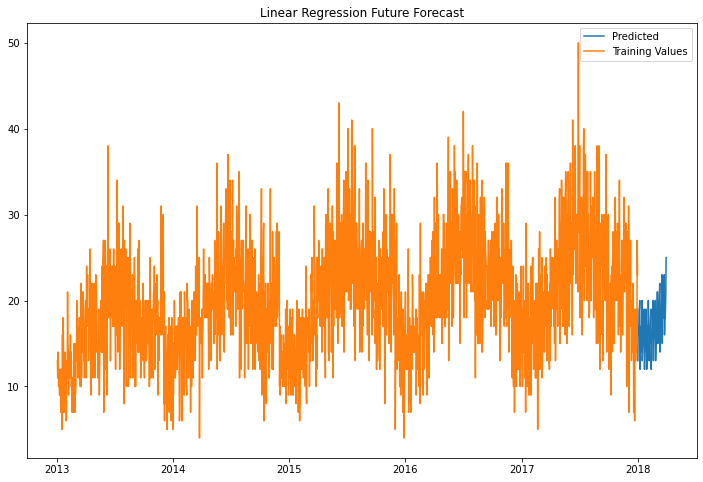

In [173]:
future_regression_example = linear_regression_forecast([1], [1], future=True, 
                                                   log=True)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(future_regression_example, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression Future Forecast")

In [204]:
regression_future = linear_regression_forecast(items=range(1, 6), log=True, 
                                               future=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

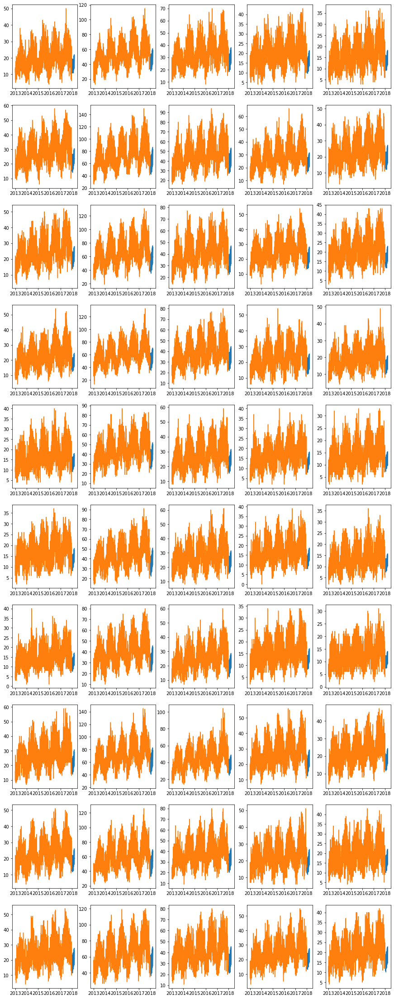

In [205]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset = df[df["item"] == (col + 1)]
        subset = subset[subset["store"] == (row + 1)]
        subset = subset[["sales"]]
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = regression_future["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

### Linear Regression Forecasted Values and Errors

In [86]:
results_regression = linear_regression_forecast(items=range(1, 3), log=True)
regression_forecast = results_regression[0]
regression_error = results_regression[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [87]:
regression_forecast

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-03,21.0,56.0,30.0,80.0,25.0,71.0,24.0,70.0,17.0,48.0,16.0,52.0,17.0,43.0,29.0,74.0,25.0,63.0,24.0,72.0
2017-10-04,21.0,58.0,30.0,77.0,25.0,68.0,24.0,63.0,18.0,48.0,17.0,47.0,16.0,41.0,31.0,75.0,24.0,60.0,26.0,67.0
2017-10-05,22.0,61.0,32.0,86.0,26.0,78.0,26.0,69.0,17.0,52.0,18.0,50.0,16.0,45.0,32.0,77.0,27.0,67.0,28.0,72.0
2017-10-06,23.0,65.0,36.0,91.0,28.0,75.0,28.0,76.0,23.0,53.0,19.0,50.0,15.0,46.0,34.0,79.0,28.0,69.0,28.0,79.0
2017-10-07,25.0,67.0,37.0,94.0,31.0,79.0,28.0,81.0,20.0,56.0,19.0,53.0,17.0,52.0,32.0,85.0,29.0,78.0,30.0,83.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,13.0,39.0,20.0,55.0,19.0,46.0,16.0,43.0,11.0,33.0,11.0,34.0,10.0,29.0,19.0,52.0,16.0,44.0,16.0,49.0
2017-12-28,12.0,39.0,22.0,58.0,20.0,51.0,17.0,48.0,12.0,34.0,13.0,35.0,12.0,31.0,21.0,54.0,16.0,48.0,18.0,52.0
2017-12-29,13.0,41.0,23.0,61.0,20.0,53.0,18.0,48.0,14.0,34.0,13.0,37.0,11.0,33.0,22.0,58.0,18.0,47.0,20.0,55.0


In [266]:
fitted = regression_forecast.iloc[:, 0].values
a, b, test = preprocess(1, 1)
test['fitted'] = fitted
test.head(15)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales,fitted
date,,
2017-10-03,18,21.0
2017-10-04,15,21.0
2017-10-05,20,22.0
2017-10-06,19,23.0
2017-10-07,22,25.0
2017-10-08,19,25.0
2017-10-09,9,17.0
2017-10-10,23,20.0
2017-10-11,14,20.0


In [88]:
regression_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,4.322222,4.0,26.633333,5.160749,21.820703
1,6.433333,5.0,68.388889,8.269757,10.975596
2,4.688889,3.5,37.511111,6.124632,16.467729
3,6.877778,6.0,77.277778,8.790778,9.370649
4,4.022222,3.0,26.600000,5.157519,13.883209
5,6.433333,6.0,64.922222,8.057433,9.283691
6,4.422222,4.0,29.200000,5.403702,18.377813
7,7.188889,6.5,73.611111,8.579692,11.355069
8,3.966667,4.0,24.122222,4.911438,21.366203
9,5.911111,4.0,57.555556,7.586538,12.688618


Text(0, 0.5, 'Avg Values')

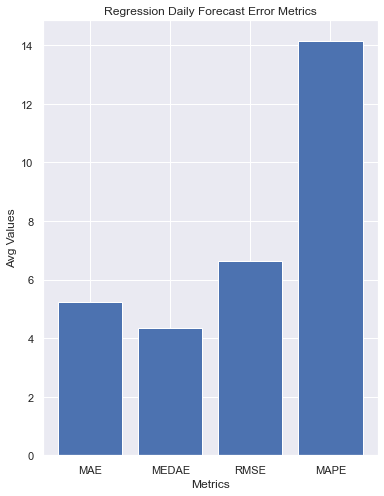

In [269]:
x_values = [x for x in regression_error.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(regression_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Regression Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Linear Regression Future Forecasting and Visualizations

In [ ]:
future_regression_df = linear_regression_forecast(items=range(1, 6), future=True)

In [ ]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset = df[df["item"] == (col + 1)]
        subset = subset[subset["store"] == (row + 1)]
        subset = subset[["sales"]]
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = future_regression_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

## Linear Regression Weekly Forecasting

### Linear Regression Weekly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression Weekly')

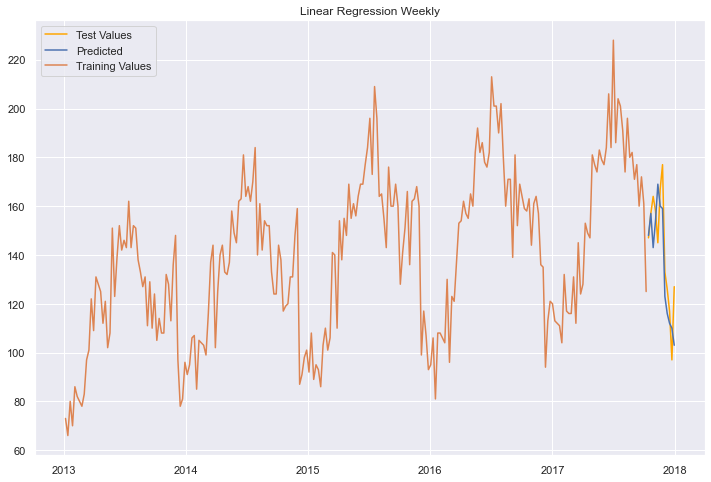

In [189]:
yhat_weekly = linear_regression_forecast([1], [1], weekly=True, log=True)[0]
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression Weekly")

### Linear Regression Weekly Forecasting Values and Error Metrics

In [190]:
results_regression_weekly = linear_regression_forecast(items=range(1, 3), weekly=True, log=True)
regression_forecast_weekly = results_regression_weekly[0]
regression_error_weekly = results_regression_weekly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [191]:
regression_forecast_weekly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-15,148.0,409.0,221.0,573.0,183.0,517.0,188.0,482.0,135.0,332.0,124.0,358.0,113.0,315.0,218.0,551.0,177.0,476.0,189.0,503.0
2017-10-22,157.0,422.0,215.0,581.0,176.0,517.0,189.0,475.0,132.0,337.0,121.0,361.0,115.0,317.0,219.0,552.0,170.0,470.0,177.0,499.0
2017-10-29,143.0,410.0,214.0,569.0,173.0,505.0,187.0,466.0,128.0,332.0,120.0,343.0,110.0,311.0,212.0,552.0,169.0,463.0,173.0,502.0
2017-11-05,154.0,433.0,231.0,588.0,188.0,534.0,204.0,500.0,140.0,362.0,132.0,348.0,112.0,322.0,228.0,583.0,192.0,518.0,189.0,528.0
2017-11-12,169.0,440.0,229.0,586.0,188.0,546.0,204.0,503.0,139.0,365.0,132.0,367.0,114.0,326.0,230.0,587.0,193.0,522.0,187.0,521.0
2017-11-19,160.0,441.0,230.0,597.0,186.0,537.0,197.0,500.0,138.0,366.0,133.0,368.0,112.0,324.0,226.0,583.0,191.0,514.0,190.0,520.0
2017-11-26,159.0,440.0,225.0,591.0,184.0,537.0,199.0,505.0,137.0,364.0,135.0,359.0,111.0,331.0,232.0,590.0,191.0,513.0,193.0,525.0
2017-12-03,123.0,345.0,169.0,463.0,138.0,429.0,157.0,396.0,105.0,282.0,102.0,286.0,88.0,256.0,177.0,467.0,143.0,384.0,143.0,416.0
2017-12-10,116.0,330.0,166.0,446.0,134.0,398.0,149.0,368.0,103.0,269.0,99.0,278.0,86.0,246.0,167.0,444.0,133.0,374.0,130.0,394.0


In [192]:
regression_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,11.916667,11.0,209.250000,14.465476,8.502638
1,27.083333,19.5,1402.750000,37.453304,6.941085
2,13.750000,12.0,254.250000,15.945219,7.070039
3,26.833333,18.5,1437.333333,37.912179,5.064928
4,25.666667,27.0,824.833333,28.719912,13.934218
5,19.500000,11.5,811.000000,28.478062,4.268547
6,12.333333,10.5,332.833333,18.243720,7.834794
7,25.583333,25.5,944.416667,30.731363,6.177297
8,8.250000,5.5,113.750000,10.665365,6.712902
9,17.583333,14.5,490.416667,22.145353,5.632016


Text(0, 0.5, 'Avg Values')

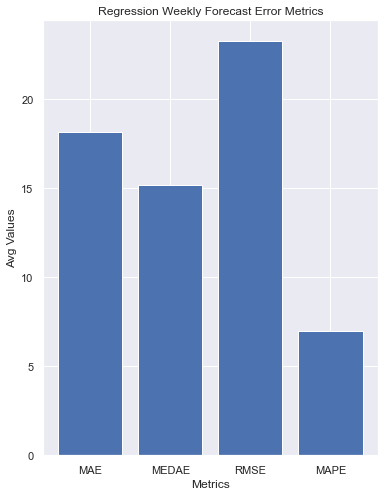

In [270]:
x_values = [x for x in regression_error_weekly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(regression_error_weekly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Regression Weekly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

In [267]:
fitted = regression_forecast_weekly.iloc[:, 0].values
a, b, test = preprocess_weekly(1, 1)
test['fitted'] = fitted
test.head(15)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales,fitted
date,,
2017-10-15,147,148.0
2017-10-22,157,157.0
2017-10-29,164,143.0
2017-11-05,158,154.0
2017-11-12,145,169.0
2017-11-19,167,160.0
2017-11-26,177,159.0
2017-12-03,133,123.0
2017-12-10,126,116.0


### Linear Regression Weekly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression Weekly Future Forecast')

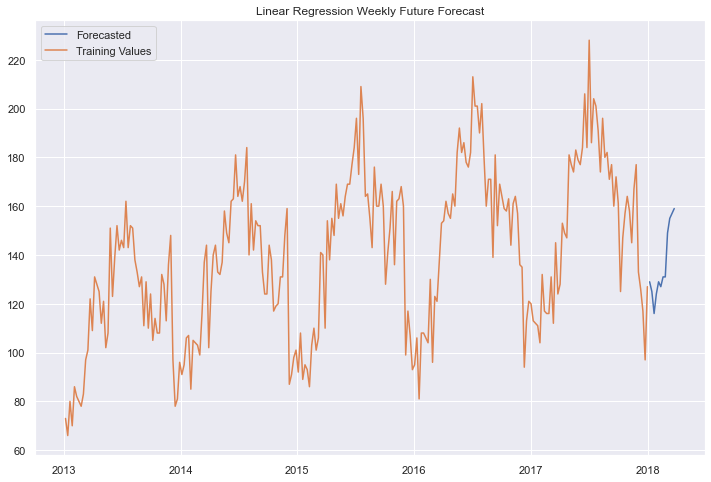

In [193]:
yhat_future_weekly = linear_regression_forecast([1], [1], future=True, weekly=True, log=True)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat_future_weekly, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression Weekly Future Forecast")

In [197]:
future_weekly_regression_df = linear_regression_forecast(items=range(1, 6), future=True, weekly=True, log=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

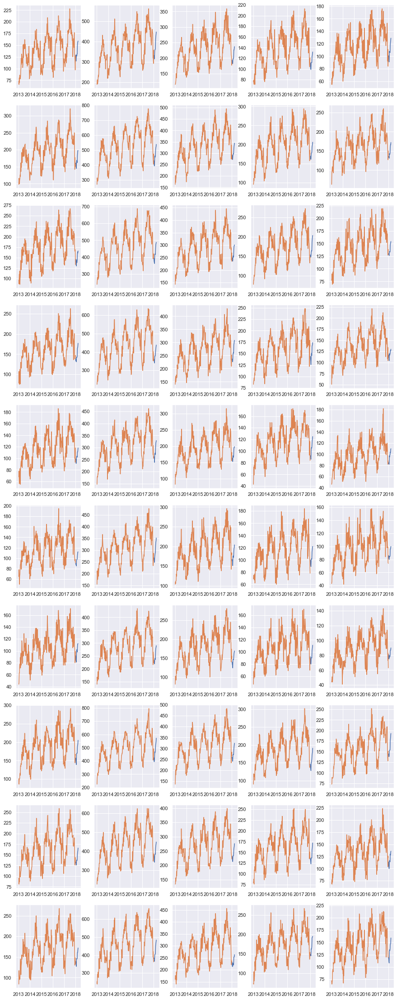

In [198]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset, a, b = preprocess_weekly(row+1, col+1)
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = future_weekly_regression_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

## Linear Regression Monthly Forecasting

### Monthly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression Monthly')

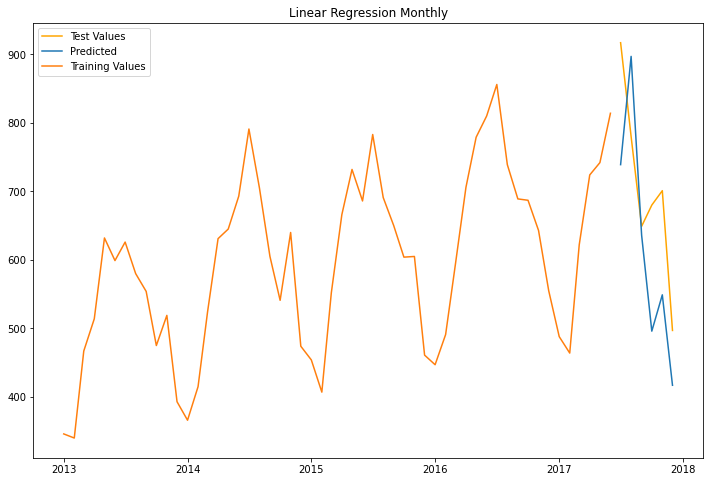

In [265]:
yhat = linear_regression_forecast([1], [4], monthly=True)[0]
a, train, test = preprocess_monthly(1, 4)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression Monthly")

### Linear Regression Monthly Forecasting Values and Error Metrics

In [89]:
results_regression_monthly = linear_regression_forecast(items=range(1, 3), monthly=True)
regression_forecast_monthly = results_regression_monthly[0]
regression_error_monthly = results_regression_monthly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [90]:
regression_forecast_monthly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-07-01,871.0,2271.0,1336.0,3214.0,1056.0,3132.0,992.0,2859.0,713.0,1896.0,655.0,2000.0,627.0,1645.0,1120.0,2580.0,1058.0,3074.0,769.0,2287.0
2017-08-01,716.0,2293.0,1152.0,3131.0,1087.0,2845.0,808.0,2530.0,646.0,1824.0,533.0,1802.0,1024.0,2047.0,1039.0,2815.0,940.0,3056.0,1210.0,2502.0
2017-09-01,668.0,2037.0,1143.0,2815.0,911.0,2889.0,856.0,2206.0,602.0,1408.0,538.0,1566.0,-49.0,1193.0,918.0,2553.0,965.0,3237.0,727.0,2354.0
2017-10-01,651.0,1824.0,1050.0,2590.0,952.0,2602.0,764.0,2008.0,540.0,1310.0,521.0,1458.0,-392.0,1062.0,900.0,2902.0,912.0,3408.0,906.0,2308.0
2017-11-01,589.0,1859.0,1217.0,2683.0,988.0,2853.0,839.0,2212.0,565.0,1154.0,532.0,1504.0,-445.0,59.0,948.0,3167.0,1017.0,3348.0,1013.0,2579.0
2017-12-01,425.0,1294.0,836.0,1985.0,704.0,1968.0,660.0,1742.0,474.0,1163.0,419.0,1180.0,-1241.0,-825.0,655.0,1757.0,794.0,2205.0,131.0,907.0


In [91]:
regression_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,57.333333,73.0,4783.000000,69.159237,8.790758
1,129.500000,108.5,18926.500000,137.573617,6.956608
2,98.833333,94.0,15195.500000,123.270029,10.769414
3,96.000000,75.5,15400.000000,124.096736,3.298438
4,76.500000,76.5,7852.500000,88.614333,8.181051
5,340.166667,332.5,135857.166667,368.588072,14.596038
6,37.333333,27.5,2208.000000,46.989360,4.190189
7,84.666667,79.5,7950.333333,89.164642,3.899593
8,23.666667,15.5,1002.333333,31.659648,3.928625
9,162.833333,117.0,40620.500000,201.545280,10.334421


Text(0, 0.5, 'Avg Values')

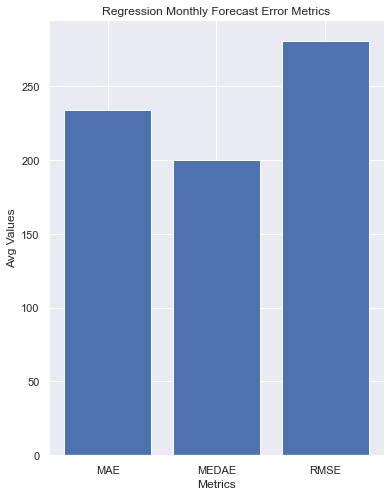

In [273]:
x_values = [x for x in regression_error_monthly.columns if (x != 'MSE') and (x != 'MAPE')]
y_values = []
for err in x_values:
    y_values.append(regression_error_monthly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Regression Monthly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

<BarContainer object of 1 artists>

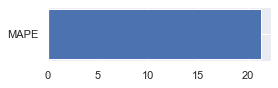

In [278]:
plt.figure(figsize=(4,1))
plt.barh(["MAPE"], regression_error_monthly["MAPE"].mean())

In [268]:
fitted = regression_forecast_monthly.iloc[:, 0].values
a, b, test = preprocess_monthly(1, 1)
test['fitted'] = fitted
test.head(15)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales,fitted
date,,
2017-07-01,873,871.0
2017-08-01,794,716.0
2017-09-01,736,668.0
2017-10-01,660,651.0
2017-11-01,668,589.0
2017-12-01,533,425.0


### Linear Regression Monthly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Linear Regression Future Forecast')

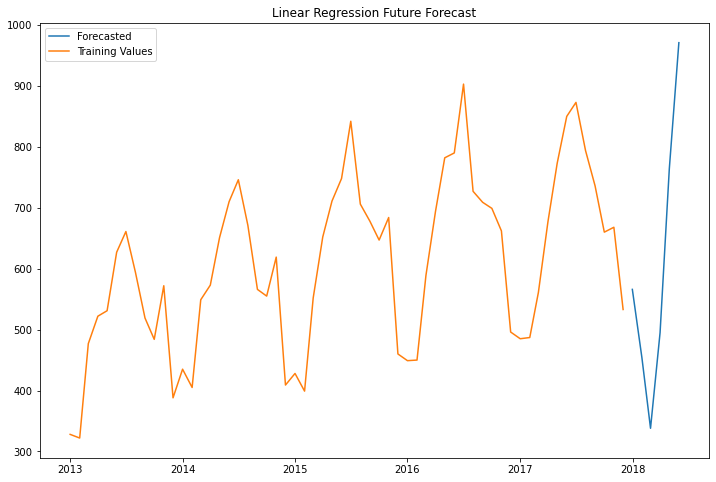

In [260]:
yhat = linear_regression_forecast([1], [1], future=True, monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Linear Regression Monthly Future Forecast")

In [195]:
future_monthly_regression_df = linear_regression_forecast(items=range(1, 6),
                                                          future=True,
                                                         monthly=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

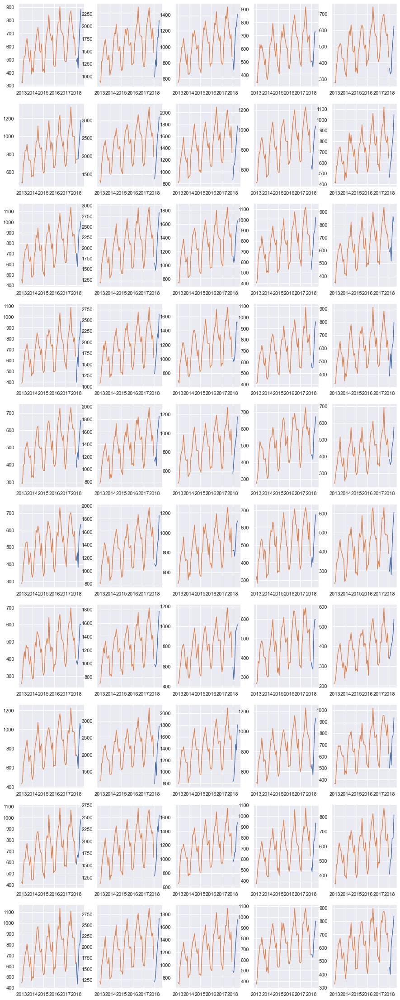

In [196]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset, a, b = preprocess_monthly(row+1, col+1)
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = future_monthly_regression_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

# Random Forest Model

In [200]:
def random_forest_forecast(stores=range(1, 11), items=range(1, 51), future=False, log=False, monthly=False, weekly=False, **args):
    #Storage for forecasted values and error values between forecasted and test data
    errors = []
    forecasted_values = {}
    
    for store in stores:
        for item in items:
            if monthly:
                if log:
                    subset, d, e = preprocess_monthly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_monthly(store, item, logged=False)
            elif weekly:
                if log:
                    subset, d, e = preprocess_weekly(store, item, logged=True)
                else:
                    subset, f, g = preprocess_weekly(store, item, logged=False)
            else:
                if log:
                    subset, d, e = preprocess(store, item, logged=True)
                else:
                    subset, f, g = preprocess(store, item, logged=False)
            #Adding future dates beyond test values
            if future == True:
                dates = subset.index
                if monthly:
                    extended = dates.union(dates.shift(6, freq='M')[-6:])
                elif weekly:
                    extended = dates.union(dates.shift(12, freq='W')[-12:])
                else:
                    extended = dates.union(dates.shift(90, freq='D')[-90:])
                subset = subset.reindex(extended)
            #Adding regressors and making test/train split
            if monthly:
                further_preprocess = regression_preprocess_monthly(subset, p=6)
            elif weekly:
                further_preprocess = regression_preprocess_weekly(subset, p=12)
            else:
                further_preprocess = regression_preprocess(subset, with_year=False, p=90)
            
            finaldf_test_x = further_preprocess[0]
            finaldf_test_y = further_preprocess[1]
            test_y = finaldf_test_y.copy()
            finaldf_train_x = further_preprocess[2]
            finaldf_train_y = further_preprocess[3]
            
            #Model + Prediction
            trained_model = RandomForestRegressor(**args).fit(
                finaldf_train_x, finaldf_train_y
            )
            
            if monthly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=True)
            elif weekly:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, weekly=True)
            else:
                predicted_values = rolling_predictions(finaldf_train_x, 
                                                  finaldf_train_y,
                                                  finaldf_test_x,
                                                  finaldf_test_y,
                                                  trained_model, monthly=False)
    
            y_pred = pd.DataFrame(predicted_values, index=finaldf_test_y.index)
            
            if log:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = np.exp(y_pred["sales"]).round()
            else:
                forecasted_values["store: {}, item: {}"
                                  .format(store, item)] = y_pred["sales"].round()
            
            if future == False:
                if log:
                    error_dict = forecast_errors(np.exp(y_pred.iloc[:, 0].values).round(), 
                                                 np.exp(test_y.values))
                else:
                    error_dict = forecast_errors(y_pred.values.round(), 
                                                 test_y.values.round())
                errors.append(error_dict)
                
                #Feature Importance Matrix
                features = finaldf_train_x.columns
                coefs = trained_model.feature_importances_
                importance = pd.DataFrame({'features': features, 'coefs': coefs})
            
    
    forecast_df = pd.DataFrame(forecasted_values)
    if future == True:
        return forecast_df

    errors_df = pd.DataFrame(errors)
    return [forecast_df, errors_df, importance]

### Hyperparamter Tuning

In [209]:
def objective(trial):
    param = {}
    param["min_samples_leaf"] = trial.suggest_int("min_samples_leaf", 1, 60)
    param["max_features"] = trial.suggest_loguniform("max_features", 0.1, 1.0)
    param["max_depth"] = trial.suggest_int("max_depth", 6, 20)
    param["n_estimators"] = trial.suggest_int("n_estimators", 10, 200)
    
    # modeling
    results = random_forest_forecast(stores=[1], items=[1],
                               future=False, weekly=True,
                               log=True,
                               **param)
    errors = results[1]["MAPE"]
    
    return errors.mean()

In [210]:
study_forest = optuna.create_study()
study_forest.optimize(objective, n_trials=100)
forest_optimized_parameters = study_forest.best_params
forest_optimized_parameters

[I 2021-12-07 18:34:34,694] A new study created in memory with name: no-name-6b5a2910-00a8-4cdb-b210-768c3cfb2594
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:34:35,101] Trial 0 finished with value: 12.916947627722216 and parameters: {'min_samples_leaf': 7, 'max_features': 0.24003557990678634, 'max_depth': 9, 'n_estimators': 93}. Best is trial 0 with value: 12.916947627722216.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:34:35,451] 

[I 2021-12-07 18:34:41,203] Trial 14 finished with value: 12.894283628214854 and parameters: {'min_samples_leaf': 19, 'max_features': 0.21302224736052774, 'max_depth': 6, 'n_estimators': 135}. Best is trial 12 with value: 10.263621618395542.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:34:41,690] Trial 15 finished with value: 12.324292012964195 and parameters: {'min_samples_leaf': 20, 'max_features': 0.1555494199224838, 'max_depth': 7, 'n_estimators': 127}. Best is trial 12 with value: 10.263621618395542.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

[I 2021-12-07 18:34:48,132] Trial 29 finished with value: 9.763922495187694 and parameters: {'min_samples_leaf': 6, 'max_features': 0.24260128030782044, 'max_depth': 10, 'n_estimators': 100}. Best is trial 29 with value: 9.763922495187694.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:34:48,514] Trial 30 finished with value: 12.288350885241371 and parameters: {'min_samples_leaf': 7, 'max_features': 0.2323819817309122, 'max_depth': 10, 'n_estimators': 74}. Best is trial 29 with value: 9.763922495187694.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: ht

[I 2021-12-07 18:34:55,763] Trial 44 finished with value: 8.308262695584778 and parameters: {'min_samples_leaf': 4, 'max_features': 0.41371318551324476, 'max_depth': 13, 'n_estimators': 200}. Best is trial 44 with value: 8.308262695584778.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:34:56,410] Trial 45 finished with value: 13.788158347445847 and parameters: {'min_samples_leaf': 8, 'max_features': 0.6587548902806082, 'max_depth': 15, 'n_estimators': 193}. Best is trial 44 with value: 8.308262695584778.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: h

[I 2021-12-07 18:35:03,618] Trial 59 finished with value: 15.421605920861497 and parameters: {'min_samples_leaf': 43, 'max_features': 0.40788345307481977, 'max_depth': 11, 'n_estimators': 110}. Best is trial 44 with value: 8.308262695584778.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:35:04,157] Trial 60 finished with value: 17.313548688594327 and parameters: {'min_samples_leaf': 59, 'max_features': 0.36357911020083805, 'max_depth': 14, 'n_estimators': 162}. Best is trial 44 with value: 8.308262695584778.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

[I 2021-12-07 18:35:10,917] Trial 74 finished with value: 8.55358104992469 and parameters: {'min_samples_leaf': 1, 'max_features': 0.270064123710167, 'max_depth': 10, 'n_estimators': 100}. Best is trial 71 with value: 7.891870809352174.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:35:11,301] Trial 75 finished with value: 9.495321782652887 and parameters: {'min_samples_leaf': 4, 'max_features': 0.27581804992955683, 'max_depth': 10, 'n_estimators': 75}. Best is trial 71 with value: 7.891870809352174.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https

[I 2021-12-07 18:35:16,604] Trial 89 finished with value: 9.58440470947726 and parameters: {'min_samples_leaf': 4, 'max_features': 0.18399746689180543, 'max_depth': 10, 'n_estimators': 91}. Best is trial 71 with value: 7.891870809352174.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
[I 2021-12-07 18:35:16,946] Trial 90 finished with value: 7.899562811176166 and parameters: {'min_samples_leaf': 1, 'max_features': 0.21647570623234516, 'max_depth': 12, 'n_estimators': 53}. Best is trial 71 with value: 7.891870809352174.
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http

{'min_samples_leaf': 3,
 'max_features': 0.3586748997593132,
 'max_depth': 12,
 'n_estimators': 79}

In [217]:
forest_optimized_parameters = {'min_samples_leaf': 1,
 'max_features': 0.6629053197819518,
 'max_depth': 10,
 'n_estimators': 166}

forest_optimized_parameters_weekly = {'min_samples_leaf': 3,
 'max_features': 0.3586748997593132,
 'max_depth': 12,
 'n_estimators': 79}

## Random Forest Visualization

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest')

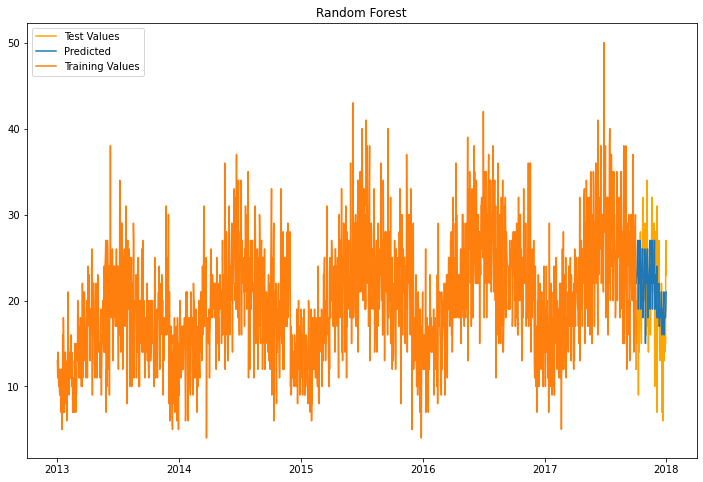

In [62]:
yhat_forest = random_forest_forecast([1], [1], log=True, 
                              **forest_optimized_parameters)[0]
train = df[["sales"]][:1736]
test = df[["sales"]][1736:1826]
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_forest, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest")

Text(0.5, 1.0, 'Random Forest')

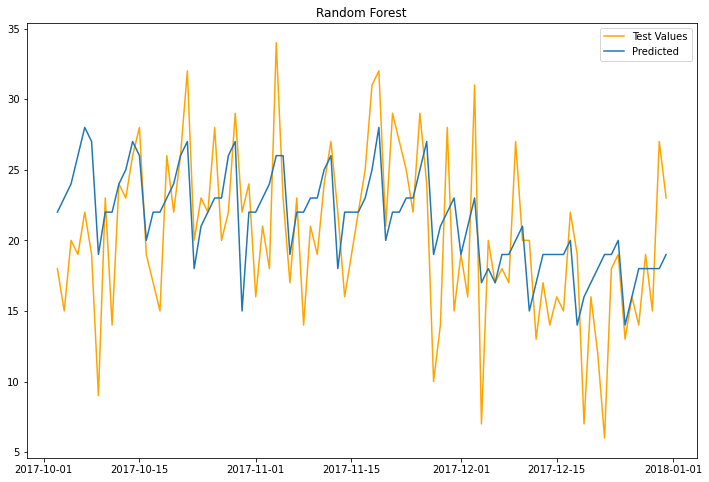

In [63]:
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.legend()
plt.title("Random Forest")

### Future Forecast Visualization

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest Future Forecast')

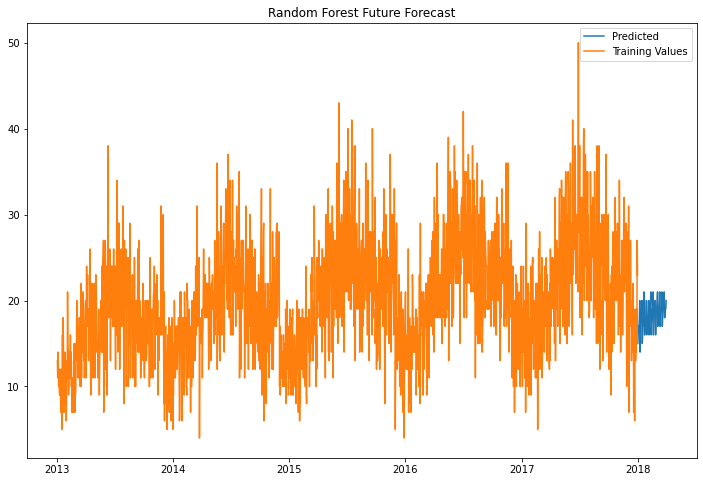

In [150]:
future_forest_example = random_forest_forecast([1], [1], future=True, log=True,                                           
                                               **forest_optimized_parameters)
train = df[["sales"]][:1826]
plt.figure(figsize=(12,8))
plt.plot(future_forest_example, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest Future Forecast")

In [209]:
future_forest_df = random_forest_forecast(items=range(1, 6), future=True, log=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

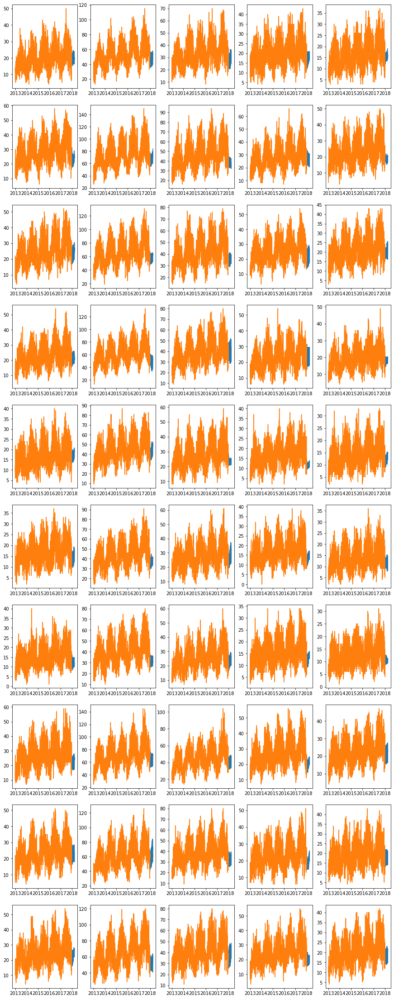

In [211]:
fig, axs = plt.subplots(10, 5, figsize=(15, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset = df[df["item"] == (col + 1)]
        subset = subset[subset["store"] == (row + 1)]
        subset = subset[["sales"]]
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = future_forest_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

### Random Forest Forecasted Values and Error

In [96]:
results_forest = random_forest_forecast(items=range(1, 3), log=True, 
                                        **forest_optimized_parameters)
forest_forecast = results_forest[0]
forest_error = results_forest[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [97]:
forest_forecast

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-03,22.0,61.0,31.0,82.0,27.0,73.0,29.0,69.0,22.0,51.0,19.0,52.0,18.0,47.0,30.0,78.0,27.0,71.0,25.0,75.0
2017-10-04,23.0,64.0,29.0,87.0,28.0,71.0,27.0,75.0,20.0,53.0,18.0,54.0,17.0,52.0,34.0,79.0,28.0,76.0,26.0,82.0
2017-10-05,24.0,62.0,32.0,94.0,30.0,80.0,30.0,81.0,21.0,54.0,19.0,57.0,17.0,51.0,34.0,78.0,29.0,74.0,26.0,80.0
2017-10-06,26.0,66.0,34.0,94.0,30.0,86.0,30.0,82.0,21.0,60.0,20.0,56.0,17.0,49.0,31.0,82.0,31.0,74.0,26.0,87.0
2017-10-07,28.0,77.0,36.0,99.0,31.0,84.0,28.0,86.0,21.0,59.0,20.0,60.0,17.0,51.0,32.0,97.0,32.0,83.0,30.0,89.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,18.0,50.0,24.0,76.0,24.0,78.0,28.0,67.0,20.0,47.0,15.0,52.0,16.0,36.0,23.0,60.0,18.0,56.0,21.0,60.0
2017-12-28,18.0,50.0,25.0,78.0,24.0,91.0,30.0,80.0,20.0,48.0,16.0,55.0,15.0,37.0,22.0,62.0,19.0,56.0,22.0,61.0
2017-12-29,18.0,51.0,25.0,78.0,24.0,96.0,30.0,85.0,20.0,50.0,16.0,56.0,15.0,37.0,23.0,63.0,19.0,55.0,23.0,62.0


In [252]:
fitted = forest_forecast.iloc[:, 0].values
a, b, test = preprocess(1, 1)
test['fitted'] = fitted
test.head(10)

In [253]:
fitted

array([22., 23., 24., 26., 28., 28., 19., 22., 21., 24., 25., 28., 26.,
       19., 23., 23., 23., 24., 27., 27., 18., 22., 23., 24., 24., 27.,
       27., 15., 23., 22., 24., 24., 26., 27., 19., 23., 23., 24., 24.,
       26., 27., 19., 23., 23., 24., 24., 26., 28., 19., 23., 23., 23.,
       24., 27., 27., 19., 23., 23., 24., 21., 24., 26., 17., 20., 20.,
       20., 21., 22., 24., 17., 20., 20., 20., 19., 21., 23., 16., 18.,
       17., 17., 18., 19., 20., 15., 17., 18., 18., 18., 19., 21.])

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,sales,fitted
date,,
2017-10-03,18,22.0
2017-10-04,15,23.0
2017-10-05,20,24.0
2017-10-06,19,26.0
2017-10-07,22,28.0
2017-10-08,19,28.0
2017-10-09,9,19.0
2017-10-10,23,22.0
2017-10-11,14,21.0


In [98]:
forest_error

,MAE,MEDAE,MSE,RMSE,MAPE
0,3.822222,3.0,22.044444,4.695151,22.151684
1,8.944444,8.0,106.988889,10.343543,17.030568
2,5.233333,4.0,45.633333,6.755245,18.969345
3,10.222222,8.0,180.111111,13.420548,15.390583
4,4.055556,3.0,25.433333,5.043147,14.920972
5,14.633333,12.0,329.700000,18.157643,23.495932
6,5.866667,6.0,50.688889,7.119613,29.132389
7,15.300000,14.0,327.055556,18.084677,26.917249
8,4.055556,3.5,25.144444,5.014424,27.631846
9,8.522222,8.0,108.833333,10.432322,20.666424


Text(0, 0.5, 'Avg Values')

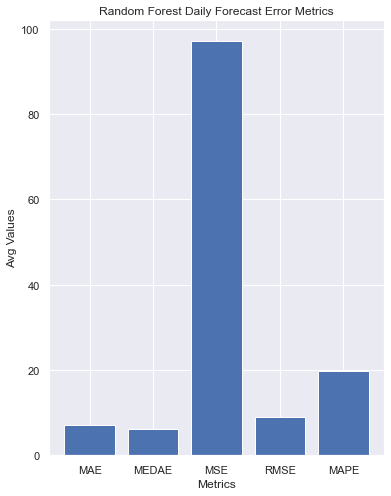

In [261]:
x_values = forest_error.columns
y_values = []
for err in x_values:
    y_values.append(forest_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Random Forest Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

Text(0, 0.5, 'Avg Values')

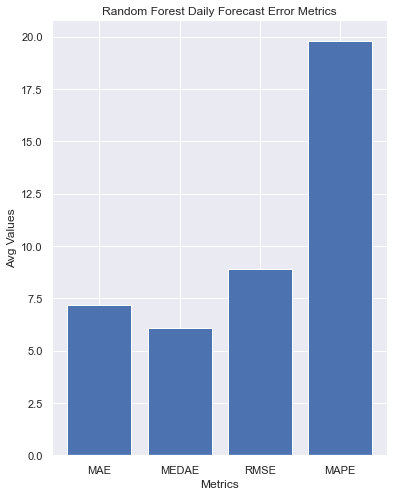

In [262]:
x_values = [x for x in forest_error.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(forest_error[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Random Forest Daily Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Random Forest Model Comparison

<BarContainer object of 3 artists>

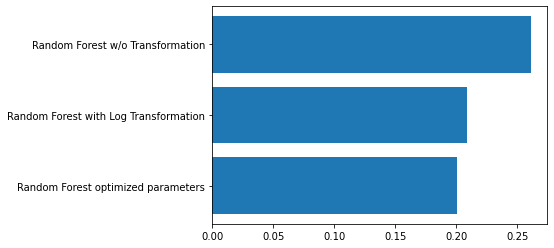

In [490]:
x = ["Random Forest w/o Transformation", "Random Forest with Log Transformation", "Random Forest optimized parameters"]
y = [forest_error["MAPE"].mean(), forest_forecast_error["MAPE"].mean(), forest_error_optimized["MAPE"].mean()]
error_df = pd.DataFrame({"Models": x, "MAPE_avg": y})
error_df.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.barh(y=error_df["Models"], width=error_df["MAPE_avg"])

## Random Forest Weekly Forecasting

### Random Forest Weekly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest Weekly')

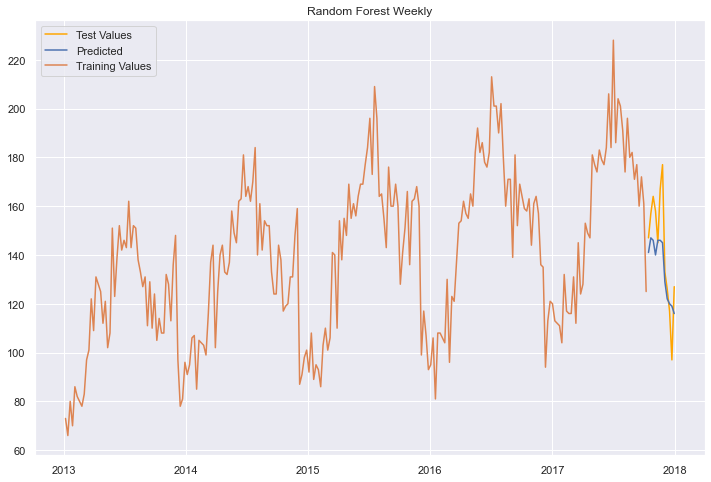

In [246]:
yhat_forest_weekly = random_forest_forecast([1], [1], weekly=True, log=True, **forest_optimized_parameters_weekly)[0]
a, train, test = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat_forest_weekly, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest Weekly")

### Random Forest Weekly Forecast Values and Error Metrics

In [234]:
results_forest_weekly = random_forest_forecast(items=range(1, 3), weekly=True, log=True,
                                               **forest_optimized_parameters_weekly)
forest_forecast_weekly = results_forest_weekly[0]
forest_error_weekly = results_forest_weekly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [235]:
forest_forecast_weekly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-10-15,141.0,425.0,222.0,599.0,206.0,535.0,183.0,509.0,135.0,359.0,136.0,368.0,123.0,330.0,223.0,544.0,184.0,519.0,198.0,521.0
2017-10-22,142.0,432.0,219.0,593.0,210.0,514.0,192.0,510.0,141.0,346.0,137.0,370.0,122.0,312.0,213.0,537.0,178.0,518.0,198.0,510.0
2017-10-29,143.0,409.0,229.0,562.0,205.0,502.0,192.0,491.0,138.0,351.0,134.0,354.0,120.0,300.0,214.0,523.0,169.0,506.0,196.0,493.0
2017-11-05,142.0,411.0,224.0,562.0,210.0,499.0,188.0,504.0,142.0,367.0,137.0,358.0,114.0,309.0,207.0,530.0,170.0,504.0,204.0,494.0
2017-11-12,144.0,421.0,222.0,548.0,210.0,494.0,189.0,495.0,138.0,356.0,136.0,363.0,114.0,314.0,209.0,527.0,167.0,504.0,201.0,508.0
2017-11-19,146.0,428.0,225.0,518.0,210.0,482.0,187.0,491.0,145.0,348.0,137.0,348.0,115.0,310.0,203.0,520.0,162.0,498.0,200.0,513.0
2017-11-26,147.0,423.0,224.0,522.0,211.0,474.0,182.0,493.0,137.0,344.0,137.0,350.0,115.0,311.0,197.0,508.0,161.0,493.0,199.0,515.0
2017-12-03,129.0,419.0,213.0,495.0,207.0,463.0,174.0,468.0,142.0,340.0,128.0,340.0,105.0,297.0,173.0,459.0,149.0,451.0,191.0,494.0
2017-12-10,121.0,417.0,211.0,462.0,205.0,462.0,169.0,444.0,135.0,352.0,127.0,335.0,96.0,284.0,159.0,450.0,142.0,438.0,187.0,489.0


In [236]:
forest_error_weekly

,MAE,MEDAE,MSE,RMSE,MAPE
0,13.500000,15.0,265.333333,16.289056,9.213643
1,50.250000,41.0,3655.083333,60.457285,14.250601
2,19.250000,17.5,695.916667,26.380232,11.178608
3,41.583333,28.5,2775.750000,52.685387,7.385045
4,21.583333,16.0,870.416667,29.502825,13.289202
5,39.833333,32.5,2037.166667,45.134983,8.525988
6,15.250000,11.0,440.250000,20.982135,10.083449
7,34.083333,25.5,1923.583333,43.858675,8.432969
8,15.083333,10.5,414.583333,20.361320,13.814201
9,41.750000,34.0,2534.250000,50.341335,14.489264


In [257]:
fitted = forest_forecast_weekly.iloc[:, 0].values
a, b, test = preprocess_weekly(1, 1)
test['fitted'] = fitted
test.head(15)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales,fitted
date,,
2017-10-15,147,141.0
2017-10-22,157,142.0
2017-10-29,164,143.0
2017-11-05,158,142.0
2017-11-12,145,144.0
2017-11-19,167,146.0
2017-11-26,177,147.0
2017-12-03,133,129.0
2017-12-10,126,121.0


Text(0, 0.5, 'Avg Values')

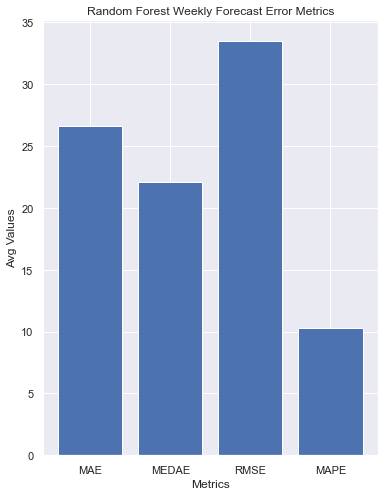

In [264]:
x_values = [x for x in forest_error_weekly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(forest_error_weekly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Random Forest Weekly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Random Forest Weekly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest Weekly Future Forecast')

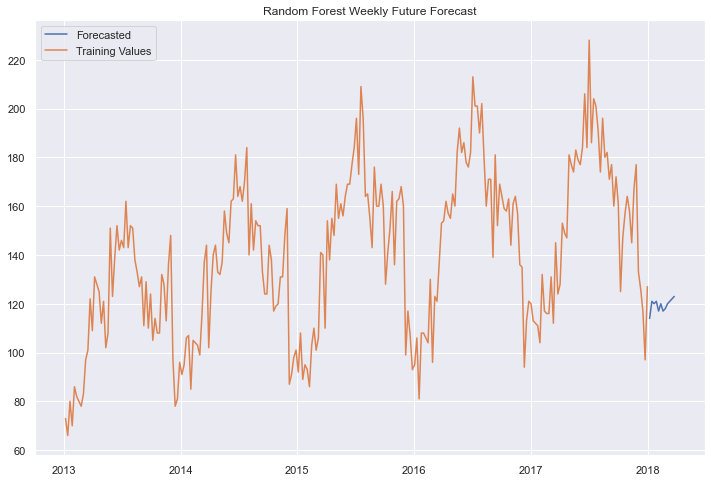

In [240]:
yhat_future_forest_weekly = random_forest_forecast([1], [1], future=True, weekly=True, log=True, **forest_optimized_parameters_weekly)
train, b, c = preprocess_weekly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat_future_forest_weekly, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest Weekly Future Forecast")

In [243]:
future_weekly_forest_df = random_forest_forecast(items=range(1, 6),
                                                          future=True, log=True,
                                                         **forest_optimized_parameters_weekly,
                                                         weekly=True)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

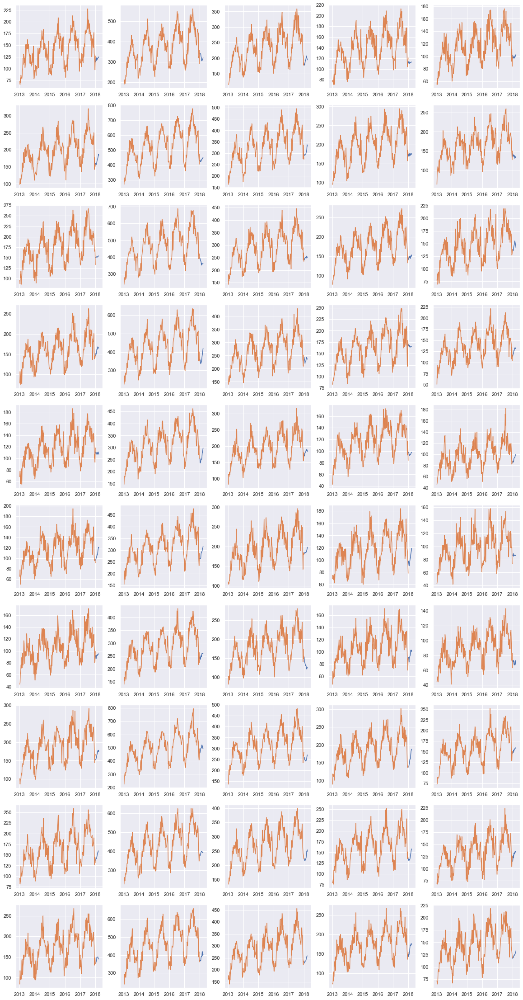

In [245]:
fig, axs = plt.subplots(10, 5, figsize=(20, 40))
for col in range(0, 5):
    for row in range(0, 10):
        subset, a, b = preprocess_weekly(row+1, col+1)
        #train = subset[["sales"]][:1736]
        #test = subset[["sales"]][1736:1826]
        y_hat = future_weekly_forest_df["store: {}, item: {}".format(row + 1, col + 1)]
        axs[row, col].plot(y_hat)
        axs[row, col].plot(subset)

## Random Forest Monthly Forecasting

### Random Forest Monthly Forecasting Visualizations

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest Monthly')

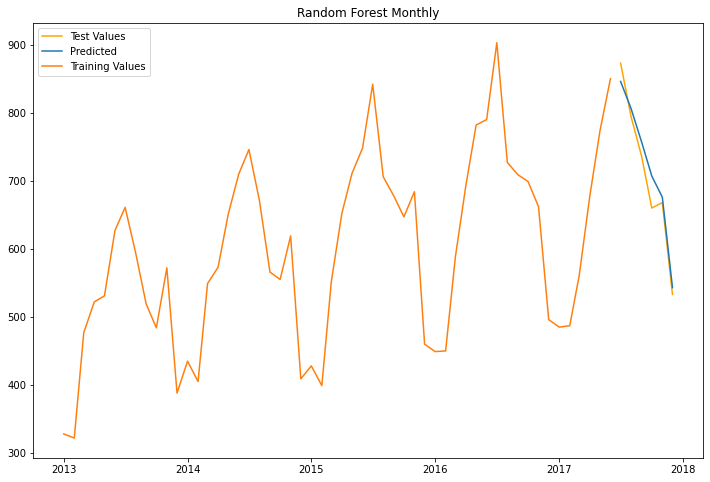

In [144]:
yhat = random_forest_forecast([1], [1], monthly=True, log=True)[0]
a, train, test = preprocess_monthly(1, 1, logged=False)
plt.figure(figsize=(12,8))
plt.plot(test, label="Test Values", color="orange")
plt.plot(yhat, label="Predicted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest Monthly")

### Random Forest Monthly Forecast Values and Error Metrics

In [99]:
results_forest_monthly = random_forest_forecast(items=range(1, 3), monthly=True,
                                               **forest_optimized_parameters)
forest_forecast_monthly = results_forest_monthly[0]
forest_error_monthly = results_forest_monthly[1]

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launche

In [258]:
fitted = forest_forecast_monthly.iloc[:, 0].values
a, b, test = preprocess_monthly(1, 1)
test['fitted'] = fitted
test.head(15)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,sales,fitted
date,,
2017-07-01,873,854.0
2017-08-01,794,794.0
2017-09-01,736,758.0
2017-10-01,660,723.0
2017-11-01,668,678.0
2017-12-01,533,538.0


In [100]:
forest_forecast_monthly

,"store: 1, item: 1","store: 1, item: 2","store: 2, item: 1","store: 2, item: 2","store: 3, item: 1","store: 3, item: 2","store: 4, item: 1","store: 4, item: 2","store: 5, item: 1","store: 5, item: 2","store: 6, item: 1","store: 6, item: 2","store: 7, item: 1","store: 7, item: 2","store: 8, item: 1","store: 8, item: 2","store: 9, item: 1","store: 9, item: 2","store: 10, item: 1","store: 10, item: 2"
date,,,,,,,,,,,,,,,,,,,,
2017-07-01,854.0,2207.0,1149.0,3065.0,1033.0,2806.0,952.0,2546.0,665.0,1784.0,673.0,1815.0,618.0,1669.0,1078.0,2943.0,987.0,2569.0,1032.0,2653.0
2017-08-01,794.0,2132.0,1057.0,2990.0,975.0,2654.0,858.0,2368.0,602.0,1690.0,657.0,1735.0,583.0,1543.0,1040.0,2789.0,858.0,2327.0,918.0,2579.0
2017-09-01,758.0,2054.0,980.0,2838.0,892.0,2508.0,831.0,2275.0,573.0,1559.0,601.0,1663.0,564.0,1482.0,975.0,2699.0,780.0,2243.0,890.0,2435.0
2017-10-01,723.0,2022.0,942.0,2724.0,882.0,2368.0,808.0,2141.0,563.0,1542.0,583.0,1612.0,555.0,1450.0,898.0,2575.0,770.0,2203.0,887.0,2325.0
2017-11-01,678.0,1887.0,929.0,2632.0,850.0,2244.0,728.0,2154.0,551.0,1546.0,569.0,1592.0,538.0,1443.0,901.0,2581.0,798.0,2185.0,854.0,2313.0
2017-12-01,538.0,1532.0,852.0,1930.0,695.0,1997.0,685.0,1724.0,441.0,1352.0,538.0,1375.0,473.0,1194.0,725.0,2114.0,640.0,1770.0,724.0,1897.0


In [101]:
forest_error_monthly

,MAE,MEDAE,MSE,RMSE,MAPE
0,19.833333,14.5,823.166667,28.690881,2.857680
1,123.833333,103.0,21588.166667,146.929121,6.518401
2,89.333333,65.5,11093.666667,105.326477,9.186564
3,124.833333,110.5,24353.166667,156.055012,4.406001
4,35.333333,27.5,2411.000000,49.101935,3.579979
5,127.833333,120.5,18541.833333,136.168401,5.663851
6,51.500000,43.5,4749.166667,68.914198,5.964980
7,72.500000,47.0,11714.500000,108.233544,3.116201
8,43.500000,43.5,2085.833333,45.670924,6.954458
9,98.833333,89.0,13524.833333,116.296317,6.211311


Text(0, 0.5, 'Avg Values')

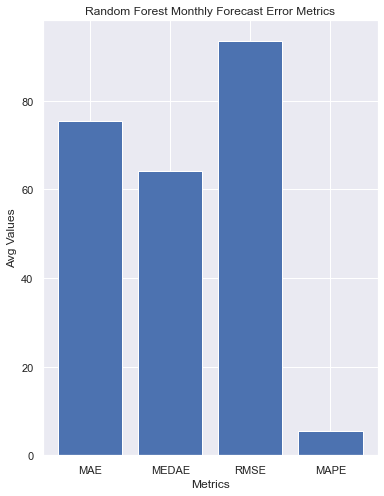

In [265]:
x_values = [x for x in forest_error_monthly.columns if x != 'MSE']
y_values = []
for err in x_values:
    y_values.append(forest_error_monthly[err].mean())
plt.figure(figsize=(6,8))
plt.bar(x_values, y_values)
plt.title("Random Forest Monthly Forecast Error Metrics")
plt.xlabel("Metrics")
plt.ylabel("Avg Values")

### Random Forest Monthly Future Forecast

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Random Forest Monthly Future Forecast')

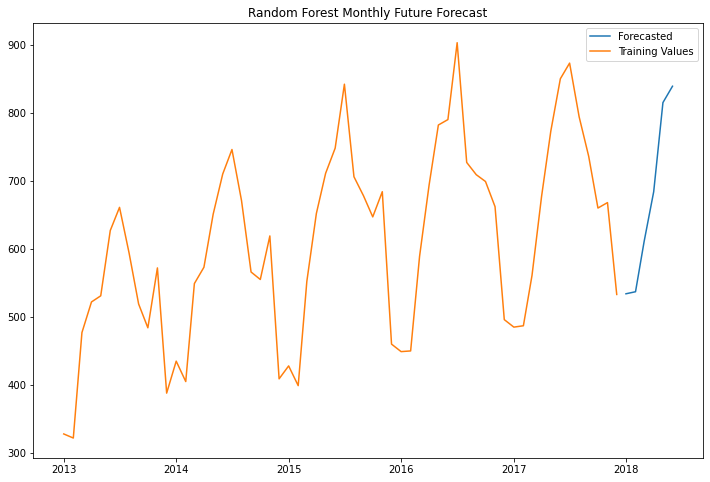

In [157]:
yhat = random_forest_forecast([1], [1], future=True, monthly=True)
train, b, c = preprocess_monthly(1, 1)
plt.figure(figsize=(12,8))
plt.plot(yhat, label="Forecasted")
plt.plot(train, label="Training Values")
plt.legend()
plt.title("Random Forest Monthly Future Forecast")

## Feature importance

### Random Forest

In [387]:
forest = random_forest_forecast([1], [1], log=True, **forest_optimized_parameters)

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<BarContainer object of 30 artists>

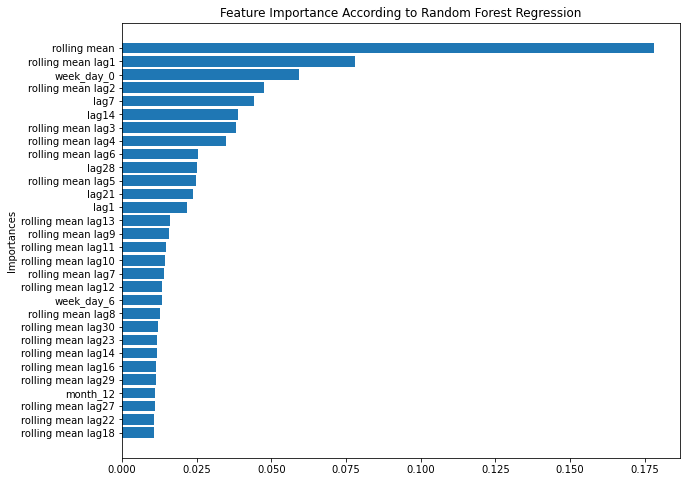

In [389]:
forest_importance = forest[2]
forest_importance.sort_values(by='coefs', ascending=True, inplace=True)
forest_importance = forest_importance.iloc[-30:, :]
plt.figure(figsize=(10, 8))
plt.title("Feature Importance According to Random Forest Regression")
plt.ylabel("Importances")
plt.barh(forest_importance["features"], forest_importance["coefs"])

C:\Users\Jacob\anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<BarContainer object of 30 artists>

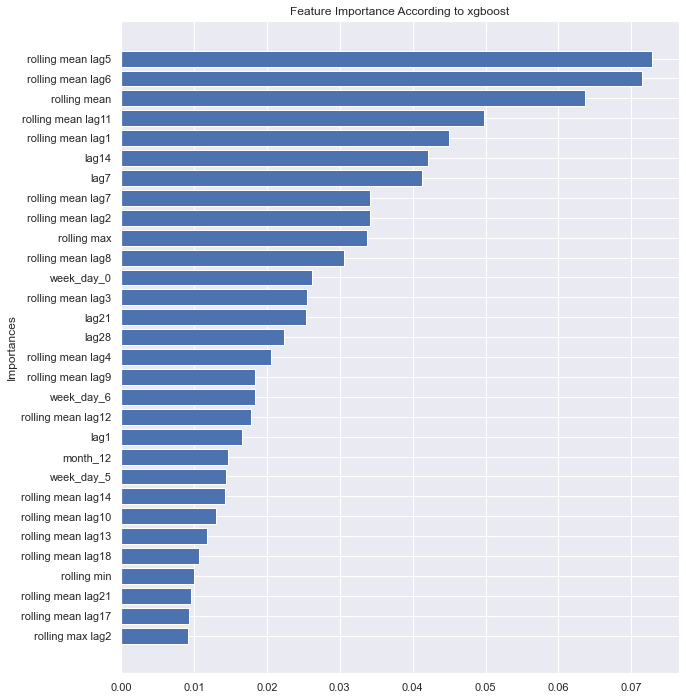

In [251]:
xgboost_feature_df = xgboost_forecast([1], [1], log=True, features=True, 
                                      **xgboost_optimized_parameters)
xgboost_feature_df.sort_values(by='coefs', ascending=True, inplace=True)
xgboost_feature_df = xgboost_feature_df.iloc[-30:, :]
plt.figure(figsize=(10, 12))
plt.title("Feature Importance According to xgboost")
plt.ylabel("Importances")
plt.barh(xgboost_feature_df["features"], xgboost_feature_df["coefs"])

## Error Comparison (MAPE) Between All of the Models

Text(0.5, 0, 'MAPE Average')

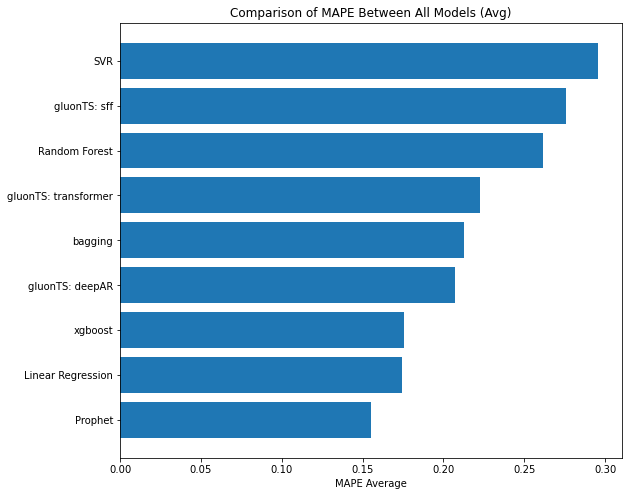

In [396]:
models = ["Linear Regression", "xgboost", "Random Forest", "Prophet", "gluonTS: sff", "gluonTS: deepAR", "gluonTS: transformer", "bagging", "SVR"]
MAPE_avg = [regression_error["MAPE"].mean(), xgboost_error["MAPE"].mean(), forest_error["MAPE"].mean(), prophet_error["MAPE"].mean(), gluonts_ssf_error["MAPE"].mean(), deepAR_error["MAPE"].mean(), transformer_error["MAPE"].mean(), bagging_error["MAPE"].mean(), svr_error["MAPE"].mean()]
error_df = pd.DataFrame({"Models": models, "MAPE_avg": MAPE_avg})
error_df.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.figure(figsize=(9, 8))
plt.barh(y=error_df["Models"], width=error_df["MAPE_avg"])
plt.title("Comparison of MAPE Between All Models (Avg)")
plt.xlabel("MAPE Average")

## Error Comparison Between Models w Log Transformations and Optimized Parameters

Text(0.5, 0, 'MAPE Average')

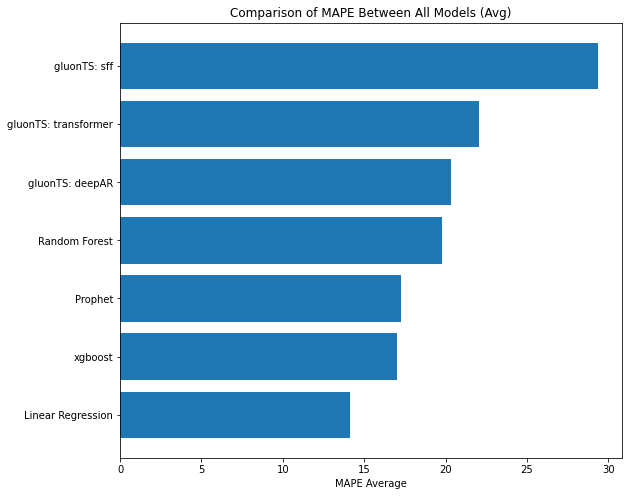

In [110]:
models = ["Linear Regression", "xgboost", "Random Forest", "Prophet", "gluonTS: sff", "gluonTS: deepAR", "gluonTS: transformer"]
MAPE_avg = [regression_error["MAPE"].mean(), xgboost_error["MAPE"].mean(), forest_error["MAPE"].mean(), prophet_error["MAPE"].mean(), gluonts_ssf_error["MAPE"].mean(), deepAR_error["MAPE"].mean(), transformer_error["MAPE"].mean()]
error_df = pd.DataFrame({"Models": models, "MAPE_avg": MAPE_avg})
error_df.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.figure(figsize=(9, 8))
plt.barh(y=error_df["Models"], width=error_df["MAPE_avg"])
plt.title("Comparison of MAPE Between All Models (Avg)")
plt.xlabel("MAPE Average")

In [109]:
MAPE_avg = [regression_error["MAPE"].mean(), xgboost_error["MAPE"].mean(), 
            forest_error["MAPE"].mean(), prophet_error["MAPE"].mean(), 
            gluonts_ssf_error["MAPE"].mean(), deepAR_error["MAPE"].mean(), 
            transformer_error["MAPE"].mean()]
MSE_avg = [regression_error["MSE"].mean(), xgboost_error["MSE"].mean(), 
            forest_error["MSE"].mean(), prophet_error["MSE"].mean(), 
            gluonts_ssf_error["MSE"].mean(), deepAR_error["MSE"].mean(), 
            transformer_error["MSE"].mean()]
RMSE_avg = [regression_error["RMSE"].mean(), xgboost_error["RMSE"].mean(), 
            forest_error["RMSE"].mean(), prophet_error["RMSE"].mean(), 
            gluonts_ssf_error["RMSE"].mean(), deepAR_error["RMSE"].mean(), 
            transformer_error["RMSE"].mean()]
MAE_avg = [regression_error["MAE"].mean(), xgboost_error["MAE"].mean(), 
            forest_error["MAE"].mean(), prophet_error["MAE"].mean(), 
            gluonts_ssf_error["MAE"].mean(), deepAR_error["MAE"].mean(), 
            transformer_error["MAE"].mean()]
MEDAE_avg = [regression_error["MEDAE"].mean(), xgboost_error["MEDAE"].mean(), 
            forest_error["MEDAE"].mean(), prophet_error["MEDAE"].mean(), 
            gluonts_ssf_error["MEDAE"].mean(), deepAR_error["MEDAE"].mean(), 
            transformer_error["MEDAE"].mean()]

In [111]:
df_error_optimized = pd.DataFrame({"models": models, 'RMSE': RMSE_avg, 
                                   'MAE': MAE_avg, "MEDAE": MEDAE_avg, 
                                   "MAPE": MAPE_avg})
df_error_optimized.sort_values(by="RMSE", ascending=True, inplace=True)
df_error_optimized = pd.melt(df_error_optimized, id_vars="models", 
                             var_name="error metric", 
                   value_name="avg error")
df_error_optimized

,models,error metric,avg error
0,Prophet,RMSE,4.805155
1,gluonTS: deepAR,RMSE,5.188473
2,gluonTS: transformer,RMSE,5.500090
3,Linear Regression,RMSE,6.629043
4,gluonTS: sff,RMSE,6.800874
5,xgboost,RMSE,8.697181
6,Random Forest,RMSE,8.897422
7,Prophet,MAE,3.772222
8,gluonTS: deepAR,MAE,4.095556
9,gluonTS: transformer,MAE,4.378889


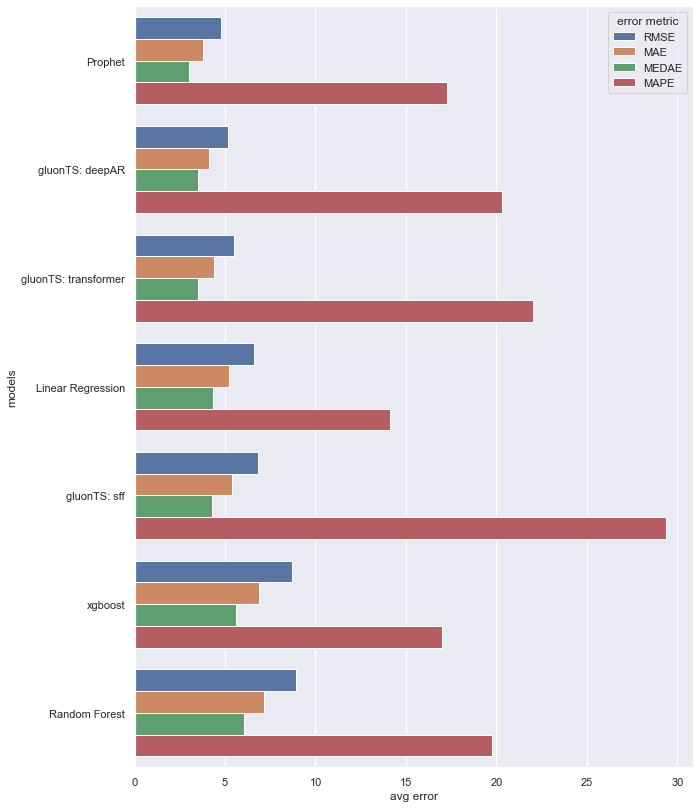

In [112]:
sns.set(rc = {'figure.figsize':(10,14)})
sns.barplot(x="avg error", y="models", hue="error metric", 
            data=df_error_optimized,
           orient="h")

## Error Comparison Between Weekly Forecasts

In [306]:
models_weekly = ["xgboost", "Random Forest", "gluonTS: SFF", "gluonTS: deepAR", "gluonTS: transformer", "linear regression", "prophet"]
MAPE_avg_weekly = [xgboost_error_weekly["MAPE"].mean(), 
            forest_error_weekly["MAPE"].mean(),
            gluonts_ssf_error_weekly["MAPE"].mean(),
            deepAR_error_weekly["MAPE"].mean(), 
            transformer_error_weekly["MAPE"].mean(),
                   regression_error_weekly["MAPE"].mean(),
                   prophet_error_weekly["MAPE"].mean()]
MSE_avg_weekly = [xgboost_error_weekly["MSE"].mean(), 
            forest_error_weekly["MSE"].mean(),
            gluonts_ssf_error_weekly["MSE"].mean(),
            deepAR_error_weekly["MSE"].mean(), 
            transformer_error_weekly["MSE"].mean(),
                  regression_error_weekly["MSE"].mean(),
                  prophet_error_weekly["MSE"].mean()]
RMSE_avg_weekly = [xgboost_error_weekly["RMSE"].mean(), 
            forest_error_weekly["RMSE"].mean(),
            gluonts_ssf_error_weekly["RMSE"].mean(),
            deepAR_error_weekly["RMSE"].mean(), 
            transformer_error_weekly["RMSE"].mean(),
                   regression_error_weekly["RMSE"].mean(),
                   prophet_error_weekly["RMSE"].mean()]
MAE_avg_weekly = [xgboost_error_weekly["MAE"].mean(), 
            forest_error_weekly["MAE"].mean(),
            gluonts_ssf_error_weekly["MAE"].mean(),
            deepAR_error_weekly["MAE"].mean(), 
            transformer_error_weekly["MAE"].mean(),
                  regression_error_weekly["MAE"].mean(),
                  prophet_error_weekly["MAE"].mean()]
MEDAE_avg_weekly = [xgboost_error_weekly["MEDAE"].mean(), 
            forest_error_weekly["MEDAE"].mean(),
            gluonts_ssf_error_weekly["MEDAE"].mean(),
            deepAR_error_weekly["MEDAE"].mean(), 
            transformer_error_weekly["MEDAE"].mean(),
                    regression_error_weekly["MEDAE"].mean(),
                    prophet_error_weekly["MEDAE"].mean()]

In [307]:
df_error_weekly = pd.DataFrame({"models": models_weekly, "MAPE": MAPE_avg_weekly, 
                                 'RMSE': RMSE_avg_weekly, 'MAE': MAE_avg_weekly, 
                                 "MEDAE": MEDAE_avg_weekly})
df_error_weekly.sort_values(by="RMSE", ascending=True, inplace=True)
df_error_weekly = pd.melt(df_error_weekly, id_vars="models", var_name="error metric", 
                   value_name="avg error")
df_error_weekly

,models,error metric,avg error
0,gluonTS: deepAR,MAPE,12.264265
1,linear regression,MAPE,6.980842
2,gluonTS: transformer,MAPE,16.044344
3,xgboost,MAPE,9.437041
4,Random Forest,MAPE,10.283634
5,gluonTS: SFF,MAPE,12.782542
6,prophet,MAPE,8.216819
7,gluonTS: deepAR,RMSE,23.254202
8,linear regression,RMSE,23.280147
9,gluonTS: transformer,RMSE,28.089040


Text(0.5, 0, 'MAPE Average')

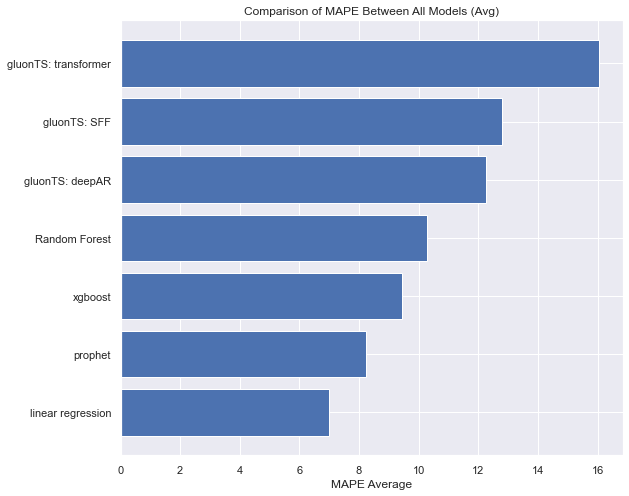

In [308]:
error_df_weekly = pd.DataFrame({"Models": models_weekly, 
                                 "MAPE_avg": MAPE_avg_weekly})
error_df_weekly.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.figure(figsize=(9, 8))
plt.barh(y=error_df_weekly["Models"], width=error_df_weekly["MAPE_avg"])
plt.title("Comparison of MAPE Between All Models (Avg)")
plt.xlabel("MAPE Average")

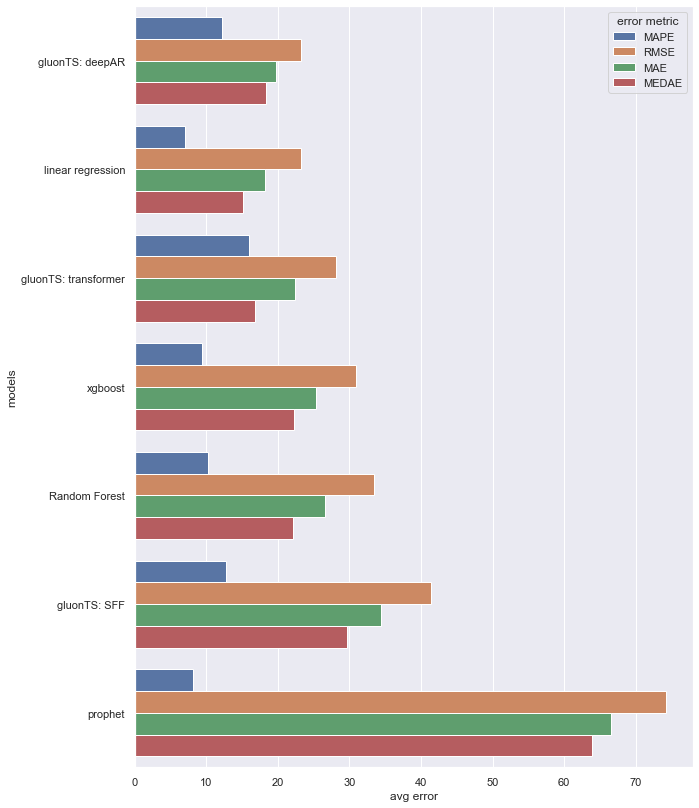

In [309]:
sns.set(rc = {'figure.figsize':(10,14)})
sns.barplot(x="avg error", y="models", hue="error metric", data=df_error_weekly,
           orient="h")

## Error Comparison Between Monthly Forecasts

In [280]:
models_monthly = ["xgboost", "Random Forest", "gluonTS: deepAR", "gluonTS: transformer", "linear regression", "prophet"]
MAPE_avg_monthly = [xgboost_error_monthly["MAPE"].mean(), 
            forest_error_monthly["MAPE"].mean(), 
            deepAR_error_monthly["MAPE"].mean(), 
            transformer_error_monthly["MAPE"].mean(),
                   regression_error_monthly["MAPE"].mean(),
                   prophet_error_monthly["MAPE"].mean()]
MSE_avg_monthly = [xgboost_error_monthly["MSE"].mean(), 
            forest_error_monthly["MSE"].mean(), 
            deepAR_error_monthly["MSE"].mean(), 
            transformer_error_monthly["MSE"].mean(),
                  regression_error_monthly["MSE"].mean(),
                  prophet_error_monthly["MSE"].mean()]
RMSE_avg_monthly = [xgboost_error_monthly["RMSE"].mean(), 
            forest_error_monthly["RMSE"].mean(), 
            deepAR_error_monthly["RMSE"].mean(), 
            transformer_error_monthly["RMSE"].mean(),
                   regression_error_monthly["RMSE"].mean(),
                   prophet_error_monthly["RMSE"].mean()]
MAE_avg_monthly = [xgboost_error_monthly["MAE"].mean(), 
            forest_error_monthly["MAE"].mean(), 
            deepAR_error_monthly["MAE"].mean(), 
            transformer_error_monthly["MAE"].mean(),
                  regression_error_monthly["MAE"].mean(),
                  prophet_error_monthly["MAE"].mean()]
MEDAE_avg_monthly = [xgboost_error_monthly["MEDAE"].mean(), 
            forest_error_monthly["MEDAE"].mean(), 
            deepAR_error_monthly["MEDAE"].mean(), 
            transformer_error_monthly["MEDAE"].mean(),
                    regression_error_monthly["MEDAE"].mean(),
                    prophet_error_monthly["MEDAE"].mean()]

In [281]:
df_error_monthly = pd.DataFrame({"models": models_monthly, "MAPE": MAPE_avg_monthly, 
                                 'RMSE': RMSE_avg_monthly, 'MAE': MAE_avg_monthly, 
                                 "MEDAE": MEDAE_avg_monthly})
df_error_monthly.sort_values(by="RMSE", ascending=True, inplace=True)
df_error_monthly = pd.melt(df_error_monthly, id_vars="models", var_name="error metric", 
                   value_name="avg error")
df_error_monthly

df_error_monthly

,models,error metric,avg error
0,prophet,MAPE,8.216819
1,xgboost,MAPE,5.660573
2,gluonTS: deepAR,MAPE,9.959104
3,Random Forest,MAPE,5.568168
4,gluonTS: transformer,MAPE,12.735422
5,linear regression,MAPE,21.269391
6,prophet,RMSE,74.224036
7,xgboost,RMSE,87.130655
8,gluonTS: deepAR,RMSE,90.693632
9,Random Forest,RMSE,93.488308


Text(0.5, 0, 'MAPE Average')

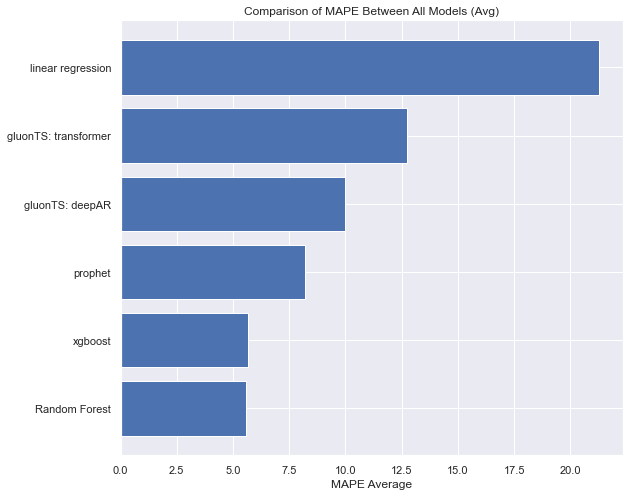

In [282]:
error_df_monthly = pd.DataFrame({"Models": models_monthly, 
                                 "MAPE_avg": MAPE_avg_monthly})
error_df_monthly.sort_values(by="MAPE_avg", ascending=True, inplace=True)
plt.figure(figsize=(9, 8))
plt.barh(y=error_df_monthly["Models"], width=error_df_monthly["MAPE_avg"])
plt.title("Comparison of MAPE Between All Models (Avg)")
plt.xlabel("MAPE Average")

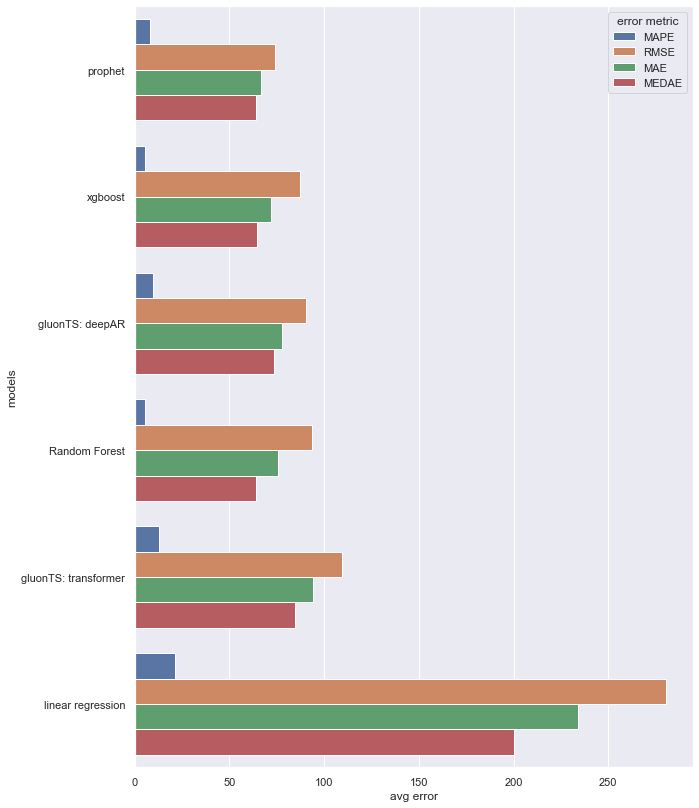

In [283]:
sns.set(rc = {'figure.figsize':(10,14)})
sns.barplot(x="avg error", y="models", hue="error metric", data=df_error_monthly,
           orient="h")